# Installations and imports


In [ ]:
!pip uninstall -y scikit-learn
!pip install scikit-learn==1.5.2
!pip install pubchempy
!pip install rdkit
!pip install matplotlib seaborn
!pip install xsmiles

Found existing installation: scikit-learn 1.5.2
Uninstalling scikit-learn-1.5.2:
  Successfully uninstalled scikit-learn-1.5.2
  Using cached scikit_learn-1.5.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (13 kB)
Using cached scikit_learn-1.5.2-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (13.3 MB)


In [ ]:
# Data manipulation
import pandas as pd
import numpy as np
import json

# Cheminformatics
import pubchempy as pcp
from rdkit import Chem
from rdkit.Chem import Descriptors
from rdkit.ML.Descriptors import MoleculeDescriptors

# Machine learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import (
    accuracy_score, roc_auc_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve
)
from sklearn.feature_selection import mutual_info_classif
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

# Model explanation
import shap

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Utilities
import joblib
import time
from imblearn.over_sampling import SMOTE


# Helper functions and dataset loading

In [ ]:
def calculate_descriptors(smiles):
    try:
        mol = Chem.MolFromSmiles(str(smiles))
        if mol is None:
            return None

        descriptor_names = [desc_name[0] for desc_name in Descriptors._descList]
        calculator = MoleculeDescriptors.MolecularDescriptorCalculator(descriptor_names)
        descriptors = calculator.CalcDescriptors(mol)
        descriptor_dict = dict(zip(descriptor_names, descriptors))

        return descriptor_dict
    except Exception:
        return None

In [ ]:
def get_smiles_from_cas(cas_number):
    print(cas_number)
    time.sleep(0.1)
    try:
        compound = pcp.get_compounds(cas_number, 'name')
        if compound:
            return compound[0].canonical_smiles
        else:
            print(f"No compound found for CAS number: {cas_number}")
            return None
    except Exception as e:
        print(f"Error retrieving compound for CAS number {cas_number}: {e}")
        compound = pcp.get_compounds(cas_number, 'xref')
        return compound

def add_smiles_column(df):
    df['SMILES'] = df['CAS'].apply(get_smiles_from_cas)
    return df

## Pre-processing of the 190 dataset

In [ ]:
# Path to the input file with data
input_data_path = '/content/drive/MyDrive/dp_data/data.xlsx'

df_190 = pd.read_excel(input_data_path, usecols='B:G')
df_190.rename(columns={'CAS_number': 'CAS', 'Substance': 'Chemical name', 'Irritation': 'Irritant', 'Smiles_code': 'SMILES'}, inplace=True)
df_190 = df_190[['Chemical name', 'CAS', 'Irritant', 'SMILES']]
df = df_190
df

,Chemical name,CAS,Irritant,SMILES
0,Heptanal,111-71-7,I,CCCCCCC=O
1,Lilestralis/lilial,80-54-6,I,CC(CC1=CC=C(C=C1)C(C)(C)C)C=O
2,1-Bromopentane,110-53-2,I,CCCCCBr
3,dl-Citronellol,106-22-9,I,CC(CCC=C(C)C)CCO
4,d-Limonene,5989-27-5,I,CC1=CCC(CC1)C(=C)C
...,...,...,...,...
186,Butyl carbamate,592-35-8,NI,CCCCOC(=O)N
187,Phenethyl bromide,103-63-9,I,C1=CC=C(C=C1)CCBr
188,(3-Chloropropyl)trimethoxysilane,2530-87-2,NI,CO[Si](CCCCl)(OC)OC
189,"1,9-Decadiene",1647-16-1,I,C=CCCCCCCC=C


**Check for the NaN values**

In [ ]:
original_count = len(df_190)

df_190.dropna(inplace=True)

remaining_count = len(df_190)

print(f"Original number of records: {original_count}")
print(f"Number of records after dropping NaN values: {remaining_count}")
print(f"Number of records removed due to NaN values: {original_count - remaining_count}")

Original number of records: 191
Number of records after dropping NaN values: 191
Number of records removed due to NaN values: 0


**Check for duplicates based on the SMILES code**

In [ ]:
count = df['SMILES'].duplicated().sum()
print(f"Number of duplicate SMILES entries (excluding first occurrences): {count}")

df[df['SMILES'].duplicated(keep=False)]

df = df.drop_duplicates(subset='SMILES', keep='first').reset_index(drop=True)
print("\nDataframe after removing duplicates:")
df


Number of duplicate SMILES entries (excluding first occurrences): 11

Dataframe after removing duplicates:


,Chemical name,CAS,Irritant,SMILES
0,Heptanal,111-71-7,I,CCCCCCC=O
1,Lilestralis/lilial,80-54-6,I,CC(CC1=CC=C(C=C1)C(C)(C)C)C=O
2,1-Bromopentane,110-53-2,I,CCCCCBr
3,dl-Citronellol,106-22-9,I,CC(CCC=C(C)C)CCO
4,d-Limonene,5989-27-5,I,CC1=CCC(CC1)C(=C)C
...,...,...,...,...
175,Butyl carbamate,592-35-8,NI,CCCCOC(=O)N
176,Phenethyl bromide,103-63-9,I,C1=CC=C(C=C1)CCBr
177,(3-Chloropropyl)trimethoxysilane,2530-87-2,NI,CO[Si](CCCCl)(OC)OC
178,"1,9-Decadiene",1647-16-1,I,C=CCCCCCCC=C


**Check for duplicates based on the CAS number**

In [ ]:
duplicate_cas_count = df['CAS'].duplicated().sum()
print(f"Number of duplicate CAS numbers: {duplicate_cas_count}")

Number of duplicate CAS numbers: 0


**Distribution of endpoint classes**

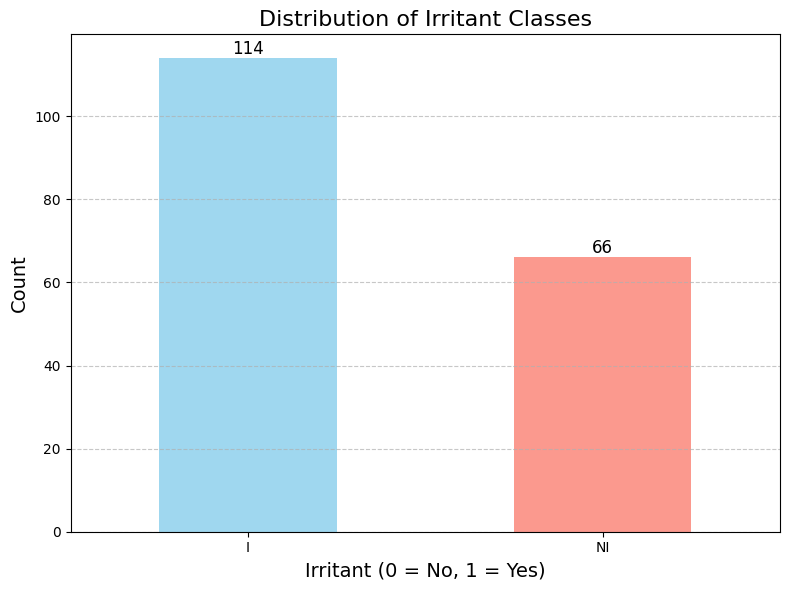

In [ ]:
irritant_counts = df['Irritant'].value_counts()

plt.figure(figsize=(8, 6))
bars = irritant_counts.plot(kind='bar', color=['skyblue', 'salmon'], alpha=0.8)

for i, count in enumerate(irritant_counts):
    plt.text(i, count + 1, str(count), ha='center', fontsize=12)

plt.title('Distribution of Irritant Classes', fontsize=16)
plt.xlabel('Irritant (0 = No, 1 = Yes)', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Descriptors

**DataFrame with calculated descriptors**

In [ ]:
descriptors_df = df['SMILES'].apply(calculate_descriptors).apply(pd.Series)
descriptors_df

[20:46:54] WARNING: not removing hydrogen atom without neighbors
[20:46:54] WARNING: not removing hydrogen atom without neighbors


,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,9.768009,9.768009,0.750000,0.750000,0.395123,9.125000,114.188,100.076,114.104465,48.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,0.0
1,10.535393,10.535393,0.116191,0.116191,0.689906,13.600000,204.313,184.153,204.151415,82.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3.350347,3.350347,1.167500,1.167500,0.429137,9.000000,151.047,139.959,150.004412,38.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
3,8.629773,8.629773,0.329353,0.329353,0.606746,12.727273,156.269,136.109,156.151415,66.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,3.974575,3.974575,0.767315,0.767315,0.485034,25.800000,136.238,120.110,136.125201,56.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,9.874124,9.874124,0.450231,-0.681991,0.557710,8.625000,117.148,106.060,117.078979,48.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
176,3.386070,3.386070,1.052593,1.052593,0.620954,9.444444,185.064,175.992,183.988762,48.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
177,5.534051,5.534051,0.615903,-2.322816,0.478370,12.000000,198.722,183.602,198.047899,68.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
178,3.678479,3.678479,1.174692,1.174692,0.371492,9.200000,138.254,120.110,138.140851,58.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,0.0


from matplotlib import pyplot as plt
_df_0['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['MaxAbsEStateIndex'].plot(kind='hist', bins=20, title='MaxAbsEStateIndex')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['MaxEStateIndex'].plot(kind='hist', bins=20, title='MaxEStateIndex')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['MinAbsEStateIndex'].plot(kind='hist', bins=20, title='MinAbsEStateIndex')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='index', y='MaxAbsEStateIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='MaxAbsEStateIndex', y='MaxEStateIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='MaxEStateIndex', y='MinAbsEStateIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='MinAbsEStateIndex', y='MinEStateIndex', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['MaxAbsEStateIndex']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('MaxAbsEStateIndex')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['MaxEStateIndex']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('MaxEStateIndex')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['MinAbsEStateIndex']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('MinAbsEStateIndex')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['MinEStateIndex']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('index', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('MinEStateIndex')

from matplotlib import pyplot as plt
_df_12['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['MaxAbsEStateIndex'].plot(kind='line', figsize=(8, 4), title='MaxAbsEStateIndex')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['MaxEStateIndex'].plot(kind='line', figsize=(8, 4), title='MaxEStateIndex')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_15['MinAbsEStateIndex'].plot(kind='line', figsize=(8, 4), title='MinAbsEStateIndex')
plt.gca().spines[['top', 'right']].set_visible(False)

**count of features with 0 variance**

In [ ]:
print(f"Number of descriptors with 0 variance: {(descriptors_df.var() == 0).sum()}")
print(f"Number of descriptors with only 0 values: {(descriptors_df == 0.0).all().sum()}")

Number of descriptors with 0 variance: 36
Number of descriptors with only 0 values: 36


the count is the same and the same features are included so we just remove them

In [ ]:
print(f"Number of descriptors: {descriptors_df.shape[1]}")

descriptors_df = descriptors_df.loc[:, descriptors_df.var() != 0]

print(f"Number of descriptors after removing those with only zero values: {descriptors_df.shape[1]}")

Number of descriptors: 217
Number of descriptors after removing those with only zero values: 181


**merge substances DF with descriptors DF**

In [ ]:
df.reset_index(drop=True, inplace=True)
df = pd.concat([df, descriptors_df], axis=1)
df = df.drop(columns=["SMILES", "Chemical name", "CAS"])

In [ ]:
df['Irritant'] = df['Irritant'].replace({'I': 1, 'NI': 0})
df.dropna(inplace=True)
df

<ipython-input-14-98ed8600e0da>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['Irritant'] = df['Irritant'].replace({'I': 1, 'NI': 0})


,Irritant,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,...,fr_phos_acid,fr_phos_ester,fr_piperzine,fr_priamide,fr_pyridine,fr_quatN,fr_sulfide,fr_thiocyan,fr_thiophene,fr_unbrch_alkane
0,1,9.768009,9.768009,0.750000,0.750000,0.395123,9.125000,114.188,100.076,114.104465,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
1,1,10.535393,10.535393,0.116191,0.116191,0.689906,13.600000,204.313,184.153,204.151415,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,1,3.350347,3.350347,1.167500,1.167500,0.429137,9.000000,151.047,139.959,150.004412,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,1,8.629773,8.629773,0.329353,0.329353,0.606746,12.727273,156.269,136.109,156.151415,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1,3.974575,3.974575,0.767315,0.767315,0.485034,25.800000,136.238,120.110,136.125201,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
174,1,10.617068,10.617068,0.258197,0.258197,0.641895,9.545455,148.205,136.109,148.088815,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
175,0,9.874124,9.874124,0.450231,-0.681991,0.557710,8.625000,117.148,106.060,117.078979,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0
176,1,3.386070,3.386070,1.052593,1.052593,0.620954,9.444444,185.064,175.992,183.988762,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
177,0,5.534051,5.534051,0.615903,-2.322816,0.478370,12.000000,198.722,183.602,198.047899,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(df.columns.tolist())


['Irritant', 'MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsEStateIndex', 'MinEStateIndex', 'qed', 'SPS', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt', 'NumValenceElectrons', 'NumRadicalElectrons', 'MaxPartialCharge', 'MinPartialCharge', 'MaxAbsPartialCharge', 'MinAbsPartialCharge', 'FpDensityMorgan1', 'FpDensityMorgan2', 'FpDensityMorgan3', 'BCUT2D_MWHI', 'BCUT2D_MWLOW', 'BCUT2D_CHGHI', 'BCUT2D_CHGLO', 'BCUT2D_LOGPHI', 'BCUT2D_LOGPLOW', 'BCUT2D_MRHI', 'BCUT2D_MRLOW', 'AvgIpc', 'BalabanJ', 'BertzCT', 'Chi0', 'Chi0n', 'Chi0v', 'Chi1', 'Chi1n', 'Chi1v', 'Chi2n', 'Chi2v', 'Chi3n', 'Chi3v', 'Chi4n', 'Chi4v', 'HallKierAlpha', 'Ipc', 'Kappa1', 'Kappa2', 'Kappa3', 'LabuteASA', 'PEOE_VSA1', 'PEOE_VSA10', 'PEOE_VSA11', 'PEOE_VSA12', 'PEOE_VSA13', 'PEOE_VSA14', 'PEOE_VSA2', 'PEOE_VSA3', 'PEOE_VSA4', 'PEOE_VSA5', 'PEOE_VSA6', 'PEOE_VSA7', 'PEOE_VSA8', 'PEOE_VSA9', 'SMR_VSA1', 'SMR_VSA10', 'SMR_VSA2', 'SMR_VSA3', 'SMR_VSA4', 'SMR_VSA5', 'SMR_VSA6', 'SMR_VSA7', 'SMR_VSA9', 'SlogP_VSA1', 'SlogP_VSA10', 'S

# Feature selection methods

linear correlation

In [ ]:
def select_top_n_features_by_correlation(df, target, n_features):
    correlation_matrix = df.corr()
    target_correlation = correlation_matrix[target].abs().drop(target).sort_values(ascending=False)

    # Plotting
    plt.figure(figsize=(12, 8))
    sns.barplot(x=target_correlation.index[:n_features], y=target_correlation.values[:n_features])
    plt.title('Top Features by Correlation with Target', fontsize=16)
    plt.xlabel('Features', fontsize=14)
    plt.ylabel('Correlation Coefficient (Absolute Value)', fontsize=14)
    plt.xticks(rotation=45, ha='right', fontsize=12)
    plt.tight_layout()
    plt.show()

    return target_correlation.index[:n_features]


both linear and non-linear correlation

In [ ]:
def select_top_n_features_by_mutual_info(X, y, n_features):
    mi_scores = mutual_info_classif(X, y, discrete_features='auto')
    mi_scores_series = pd.Series(mi_scores, index=X.columns).sort_values(ascending=False)

    # Plotting
    plt.figure(figsize=(10, 6))
    sns.barplot(x=mi_scores_series.index[:n_features], y=mi_scores_series.values[:n_features])
    plt.title('Top Features by Mutual Information with Target')
    plt.xlabel('Features')
    plt.ylabel('Mutual Information Score')
    plt.xticks(rotation=45)
    plt.show()

    return mi_scores_series.index[:n_features]


In [ ]:
def select_top_n_features_by_shap(X, y, n_features):
    model = RandomForestClassifier(random_state=42)
    model.fit(X, y)

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    if isinstance(shap_values, list):
        shap_values = np.mean(shap_values, axis=0)

    shap_importance = np.mean(np.abs(shap_values), axis=0)

    if shap_importance.ndim != 1:
        shap_importance = shap_importance.mean(axis=1)

    shap_importance_df = pd.DataFrame({
        'feature': X.columns,
        'importance': shap_importance
    }).sort_values(by='importance', ascending=False)

    top_features = shap_importance_df['feature'][:n_features]

    plt.figure(figsize=(12, 8))
    sns.barplot(x=shap_importance_df['feature'][:n_features], y=shap_importance_df['importance'][:n_features])
    plt.title('Top Features by SHAP Importance')
    plt.xlabel('Features')
    plt.ylabel('Mean Absolute SHAP Value')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

    return top_features


# Models using pipeline

In [ ]:
def run_model_grid_search(
    df,
    target_column,
    model_class,
    param_grid,
    feature_counts,
    feature_selection_methods,
    model_name="model",
    save_filename="best_model.pkl",
    extra_model_kwargs=None,
    scale_data=False,
    run_shap=True,
    use_random_search=False,
    n_iter=50
):
    if extra_model_kwargs is None:
        extra_model_kwargs = {}

    X = df.drop(columns=[target_column])
    y = df[target_column]

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=42, stratify=y
    )

    smote = SMOTE(random_state=42)
    X_train, y_train = smote.fit_resample(X_train, y_train)

    scaler = None
    if scale_data:
        scaler = StandardScaler()
        X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X.columns)
        X_test = pd.DataFrame(scaler.transform(X_test), columns=X.columns)
        print("Data scaled using StandardScaler.")

    def save_model(model, filename, selected_features, scaler=None):
      joblib.dump(model, filename)
      print(f"\nBest model saved to {filename}")

      features_filename = filename.replace('.pkl', '_features.json')
      with open(features_filename, 'w') as f:
          json.dump(selected_features.tolist(), f)
      print(f"Selected features saved to {features_filename}")

      if scaler is not None:
            scaler_filename = filename.replace('.pkl', '_scaler.pkl')
            joblib.dump(scaler, scaler_filename)
            print(f"Scaler saved to {scaler_filename}")

    def plot_auc_curve(model, X_test, y_test, title='ROC Curve'):
        y_proba = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_proba)
        auc_score = roc_auc_score(y_test, y_proba)

        plt.figure(figsize=(10, 6))
        plt.plot(fpr, tpr, color='blue', label=f'AUC = {auc_score:.2f}')
        plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title(title)
        plt.legend(loc='lower right')
        plt.show()

        return auc_score

    overall_best_model = None
    overall_best_auc = 0
    overall_best_features = None
    overall_best_method = None

    for n_features in feature_counts:
        if n_features == 'all':
            methods = {'All Features': X_train.columns}
        else:
            methods = {
                method_name: method_func(X_train, y_train, n_features)
                for method_name, method_func in feature_selection_methods.items()
            }

        for method_name, top_features in methods.items():
            X_train_selected = X_train[top_features]
            X_test_selected = X_test[top_features]

            print(f"\nPerforming Grid Search for {method_name} (Top {n_features} Features)")

            model = model_class(**extra_model_kwargs)
            if use_random_search:
                print(f"Running RandomizedSearchCV with n_iter={n_iter}")
                search = RandomizedSearchCV(
                    estimator=model,
                    param_distributions=param_grid,
                    n_iter=n_iter,
                    cv=5,
                    scoring='roc_auc',
                    n_jobs=-1,
                    verbose=1,
                    random_state=42
                )
            else:
                print("Running GridSearchCV")
                search = GridSearchCV(
                    estimator=model,
                    param_grid=param_grid,
                    cv=5,
                    scoring='roc_auc',
                    n_jobs=-1,
                    verbose=1
                )

            search.fit(X_train_selected, y_train)
            best_model = search.best_estimator_

            print(f"\nBest Parameters for {method_name} (Top {n_features} Features):")
            print(search.best_params_)

            y_pred = best_model.predict(X_test_selected)
            y_proba = best_model.predict_proba(X_test_selected)[:, 1]
            accuracy = accuracy_score(y_test, y_pred)
            auc_score = roc_auc_score(y_test, y_proba)
            precision = precision_score(y_test, y_pred)
            recall = recall_score(y_test, y_pred)
            f1 = f1_score(y_test, y_pred)
            cm = confusion_matrix(y_test, y_pred)

            print(f"Accuracy: {accuracy:.4f}")
            print(f"AUC Score: {auc_score:.4f}")
            print(f"Precision: {precision:.4f}")
            print(f"Recall: {recall:.4f}")
            print(f"F1 Score: {f1:.4f}")
            print("Confusion Matrix:")
            print(cm)
            print("Classification Report:")
            print(classification_report(y_test, y_pred))

            plot_auc_curve(best_model, X_test_selected, y_test, title=f'{model_name} - {method_name} ({n_features} Features)')

            if auc_score > overall_best_auc:
                overall_best_model = best_model
                overall_best_auc = auc_score
                overall_best_features = top_features
                overall_best_method = f"{method_name} ({n_features} Features)"
                overall_best_accuracy = accuracy
                overall_best_precision = precision
                overall_best_recall = recall
                overall_best_f1 = f1
                overall_best_cm = cm
                overall_best_classification_report = classification_report(y_test, y_pred)

    print("\n=== Overall Best Model ===")
    print(f"Feature Selection Method: {overall_best_method}")
    print(f"Selected Features: {overall_best_features}")
    print(f"AUC Score: {overall_best_auc:.4f}")
    print(f"Accuracy: {overall_best_accuracy:.4f}")
    print(f"Precision: {overall_best_precision:.4f}")
    print(f"Recall: {overall_best_recall:.4f}")
    print(f"F1 Score: {overall_best_f1:.4f}")
    print("\nConfusion Matrix:")
    print(overall_best_cm)
    print("\nClassification Report:")
    print(overall_best_classification_report)

    save_model(overall_best_model, save_filename, overall_best_features, scaler)

    if run_shap:
      print("\nGenerating SHAP summary plot...")
      explainer = shap.Explainer(overall_best_model, X_train[overall_best_features])
      shap_values = explainer(X_test[overall_best_features])
      shap.summary_plot(shap_values, X_test[overall_best_features])

In [ ]:
feature_selection_methods = {
    "Correlation-Based": lambda X, y, n: select_top_n_features_by_correlation(X.join(y), 'Irritant', n),
    "Mutual Information-Based": lambda X, y, n: select_top_n_features_by_mutual_info(X, y, n),
    "SHAP-Based": lambda X, y, n: select_top_n_features_by_shap(X, y, n)
}

feature_counts = [10, 50, 100, 'all']

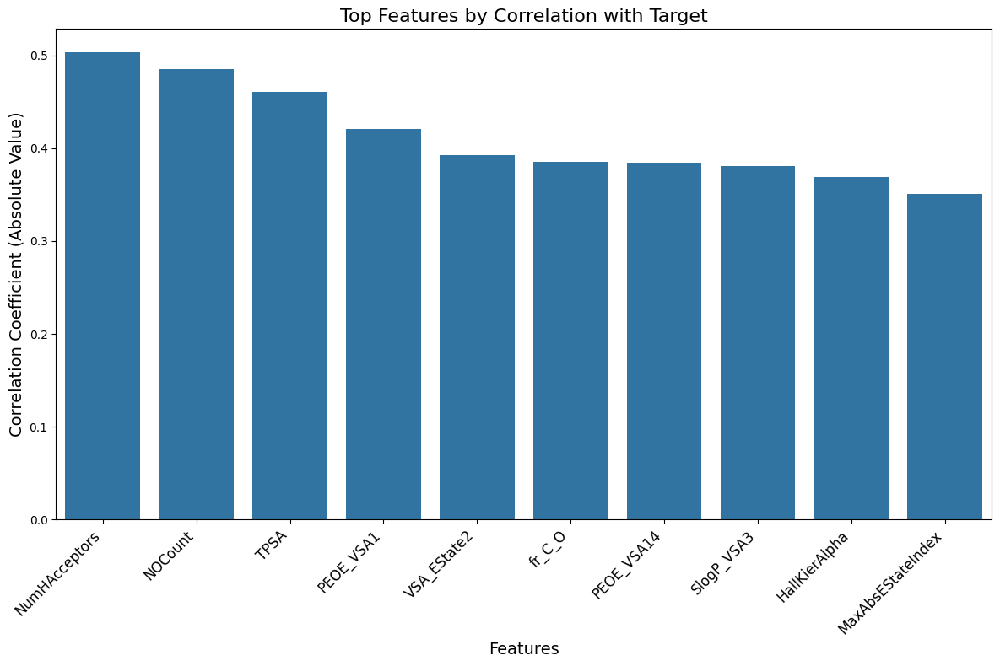

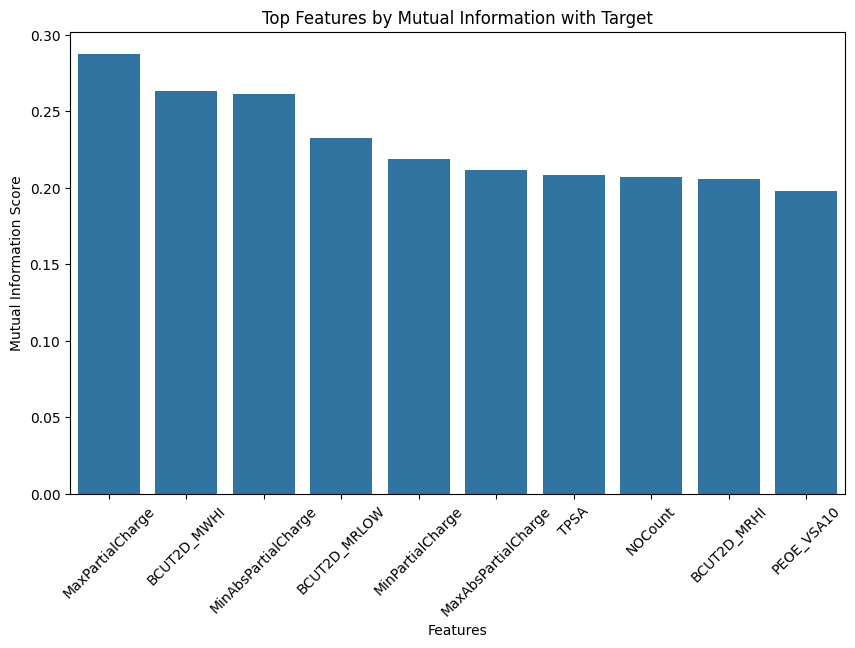

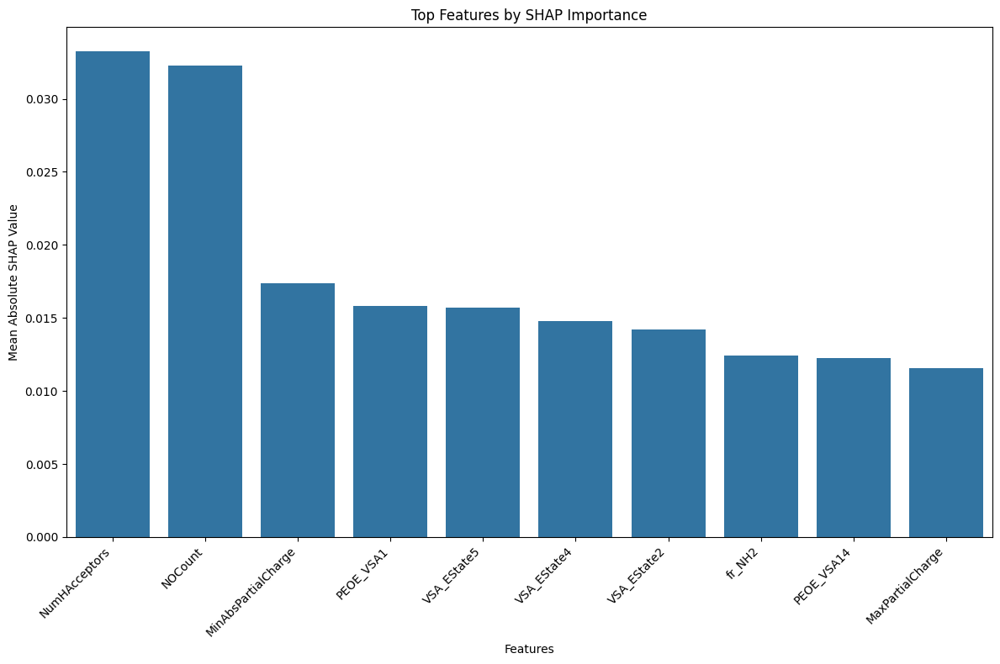


Performing Grid Search for Correlation-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:29:01] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Correlation-Based (Top 10 Features):
{'subsample': 1.0, 'reg_lambda': 2, 'reg_alpha': 1, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.6}
Accuracy: 0.7879
AUC Score: 0.8611
Precision: 0.8182
Recall: 0.8571
F1 Score: 0.8372
Confusion Matrix:
[[ 8  4]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.67      0.70        12
           1       0.82      0.86      0.84        21

    accuracy                           0.79        33
   macro avg       0.77      0.76      0.77        33
weighted avg       0.79      0.79      0.79        33



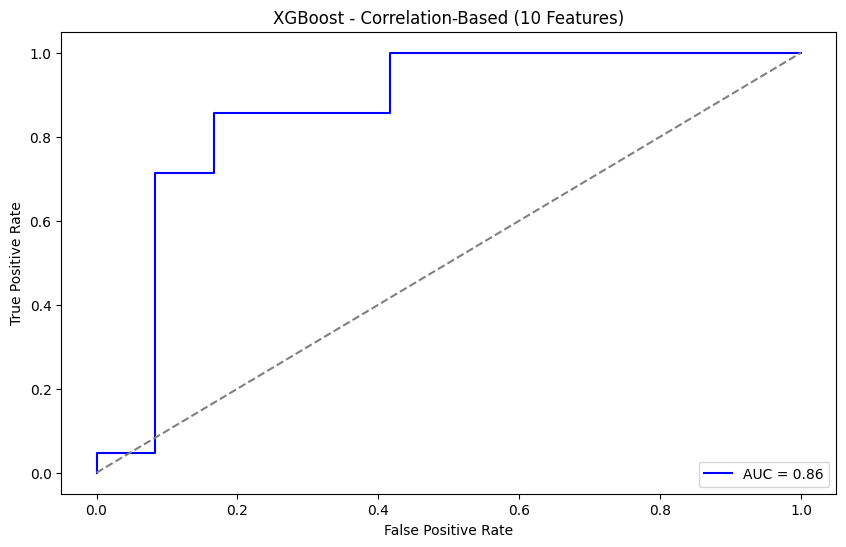


Performing Grid Search for Mutual Information-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:29:12] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Mutual Information-Based (Top 10 Features):
{'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0.1, 'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.2, 'gamma': 1, 'colsample_bytree': 0.6}
Accuracy: 0.8788
AUC Score: 0.8810
Precision: 0.9048
Recall: 0.9048
F1 Score: 0.9048
Confusion Matrix:
[[10  2]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        12
           1       0.90      0.90      0.90        21

    accuracy                           0.88        33
   macro avg       0.87      0.87      0.87        33
weighted avg       0.88      0.88      0.88        33



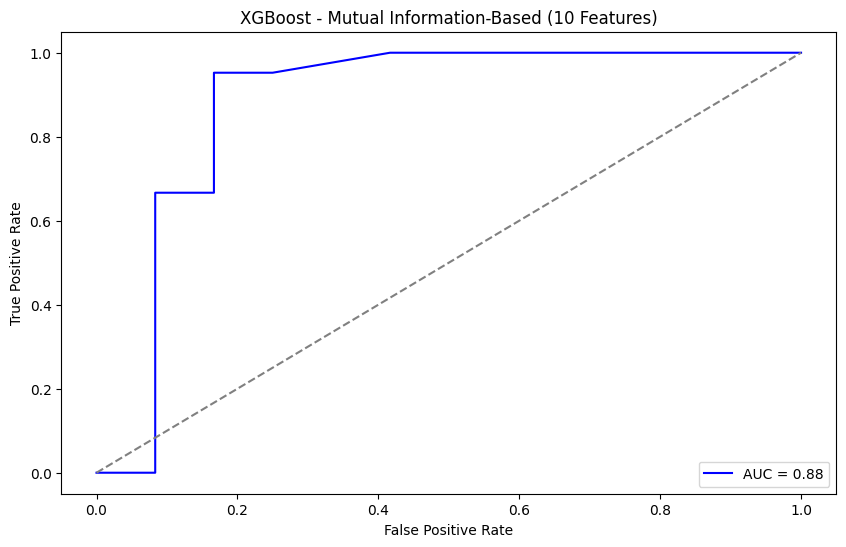


Performing Grid Search for SHAP-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:29:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for SHAP-Based (Top 10 Features):
{'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 1.0}
Accuracy: 0.8485
AUC Score: 0.9365
Precision: 0.9000
Recall: 0.8571
F1 Score: 0.8780
Confusion Matrix:
[[10  2]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.83      0.80        12
           1       0.90      0.86      0.88        21

    accuracy                           0.85        33
   macro avg       0.83      0.85      0.84        33
weighted avg       0.85      0.85      0.85        33



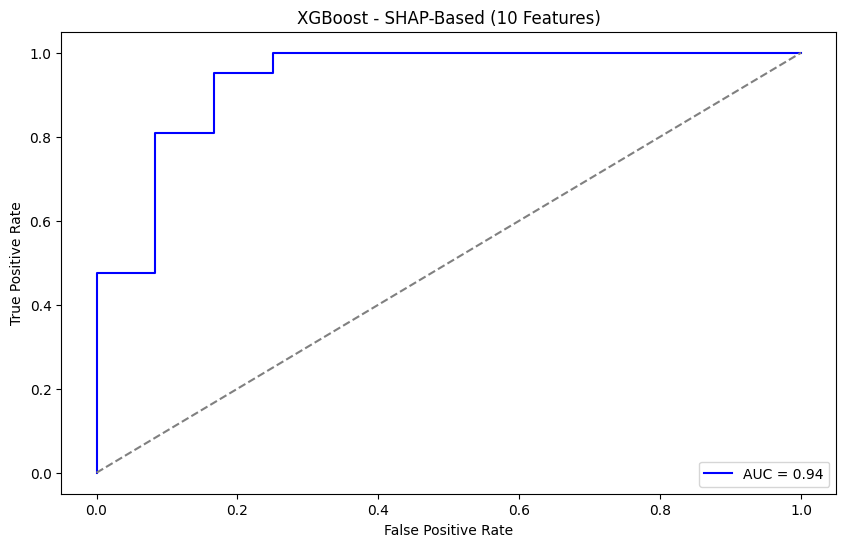

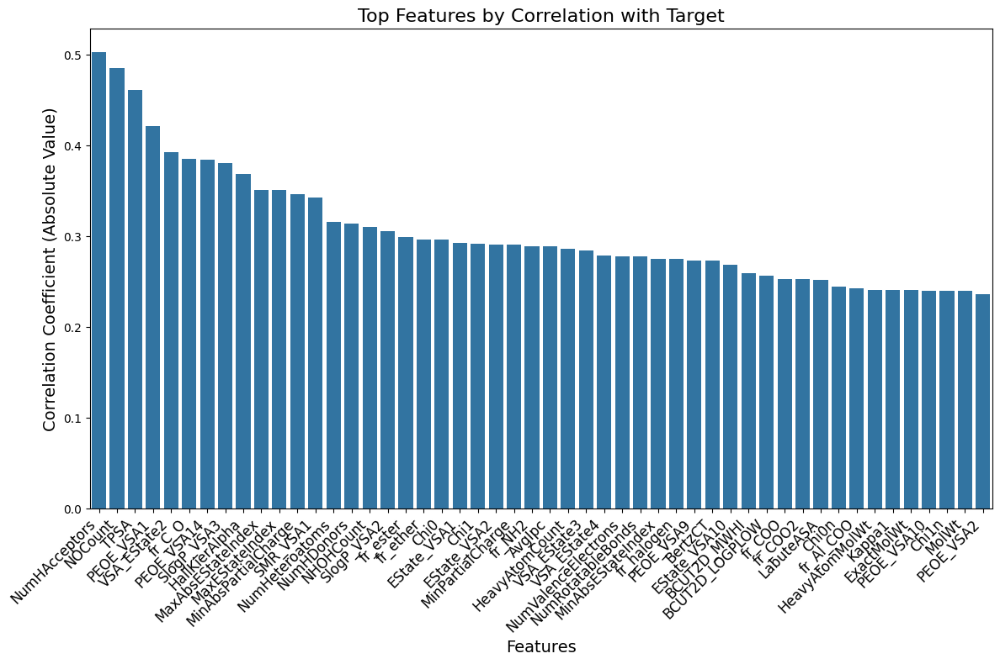

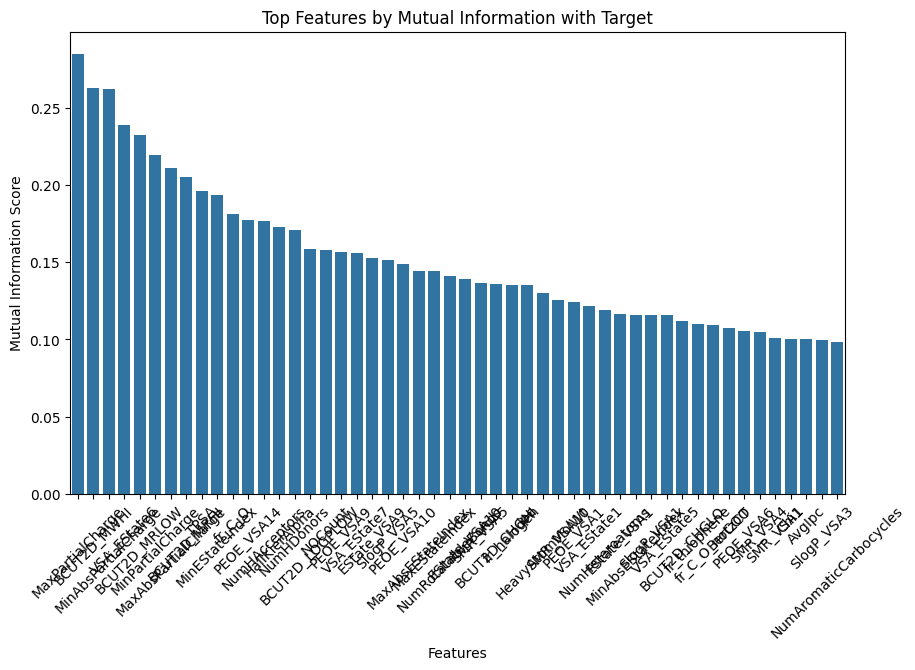

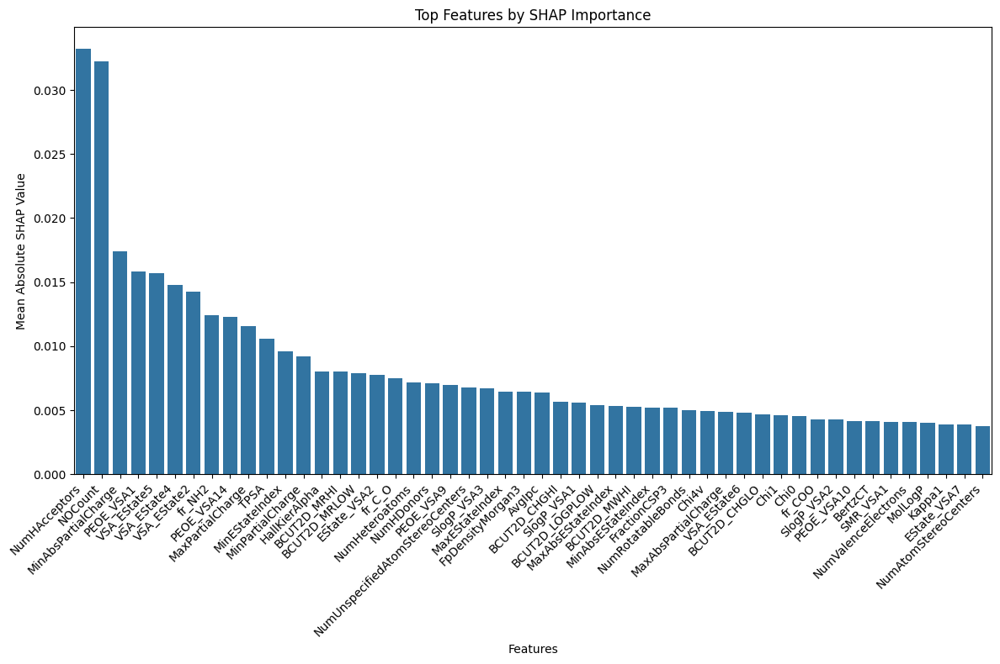


Performing Grid Search for Correlation-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:29:48] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Correlation-Based (Top 50 Features):
{'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 1.0}
Accuracy: 0.9394
AUC Score: 0.9206
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



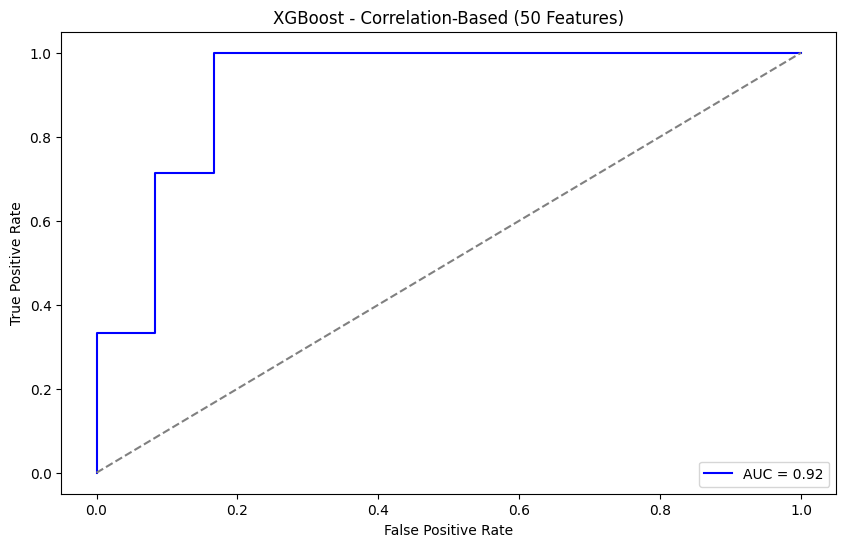


Performing Grid Search for Mutual Information-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:30:22] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Mutual Information-Based (Top 50 Features):
{'subsample': 0.8, 'reg_lambda': 1, 'reg_alpha': 0, 'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0, 'colsample_bytree': 0.8}
Accuracy: 0.9394
AUC Score: 0.9444
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



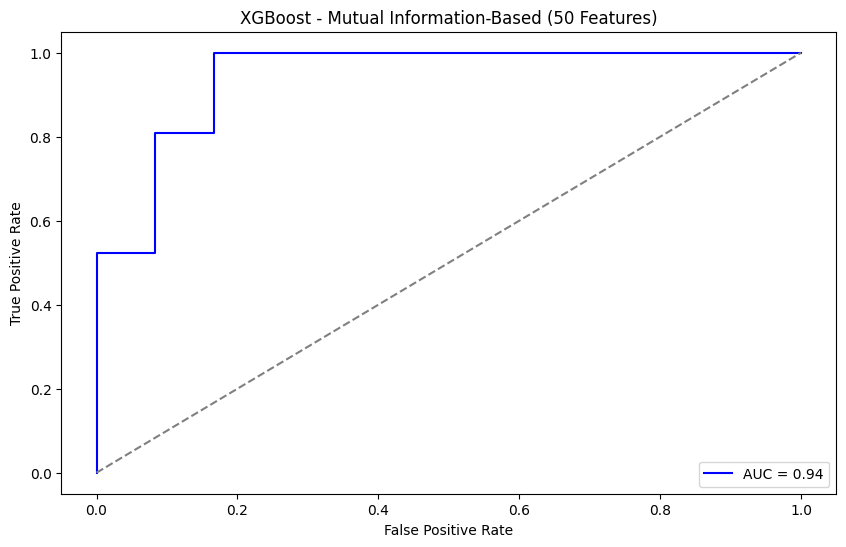


Performing Grid Search for SHAP-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:31:10] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for SHAP-Based (Top 50 Features):
{'subsample': 1.0, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 1.0}
Accuracy: 0.9394
AUC Score: 0.9683
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



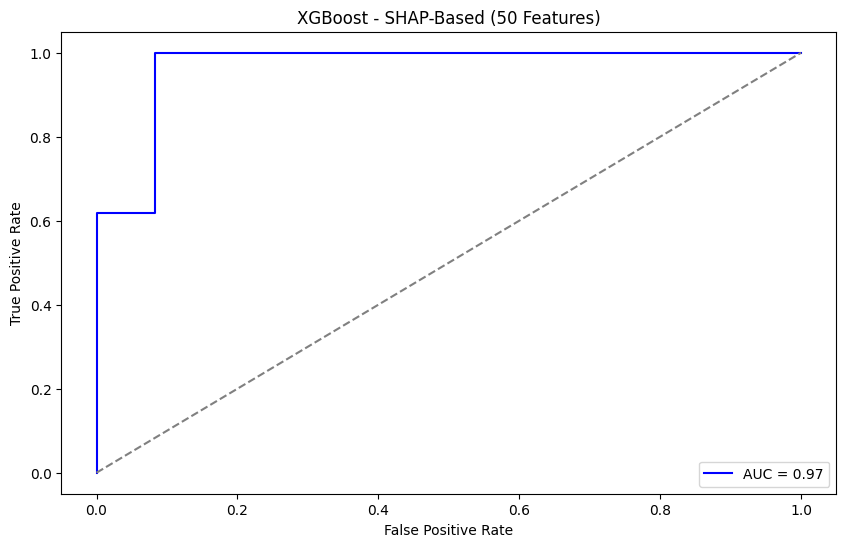

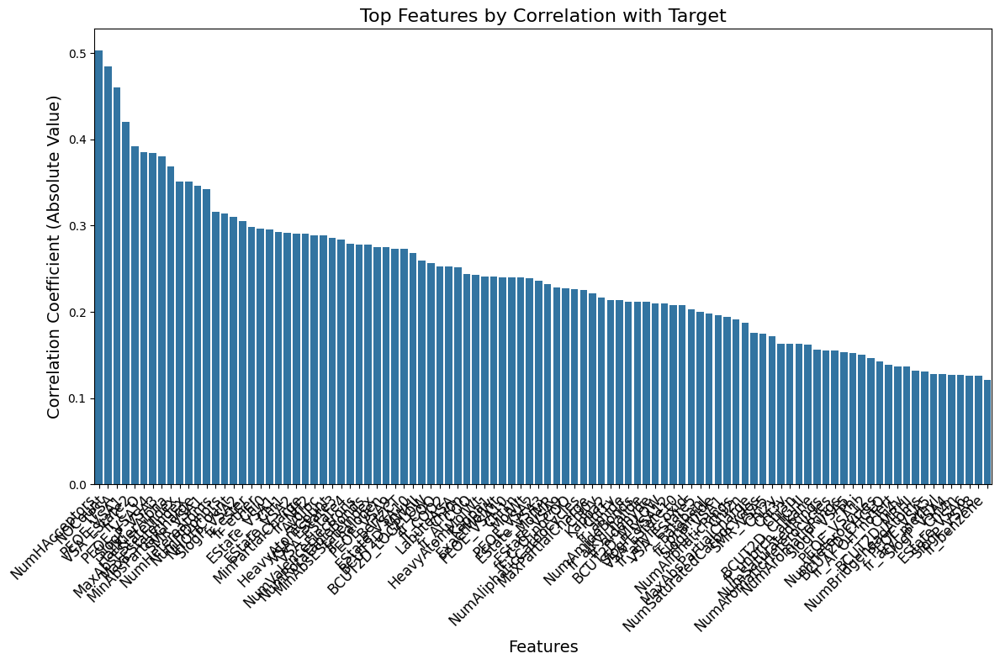

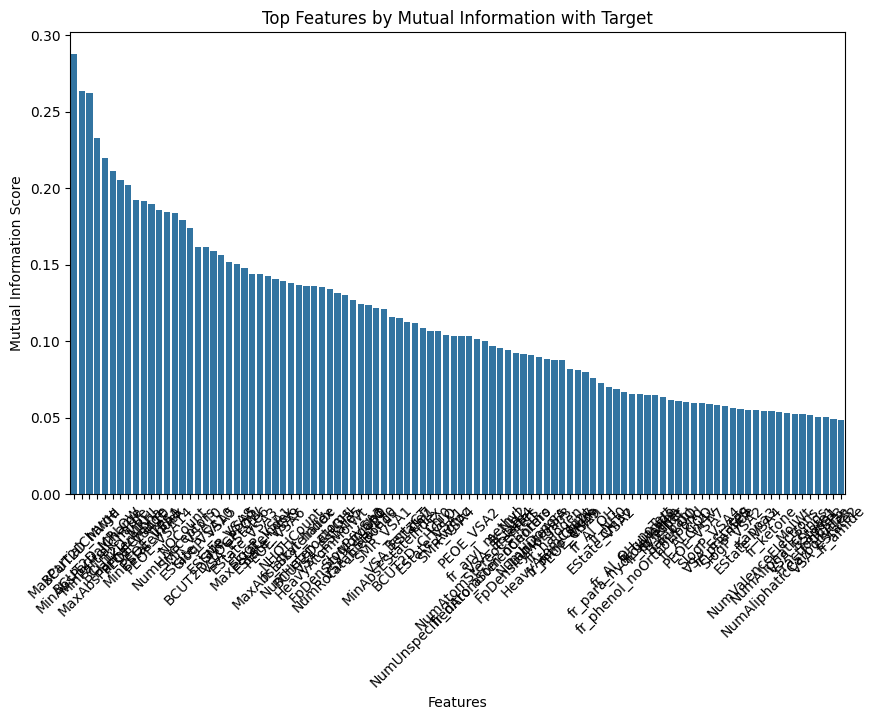

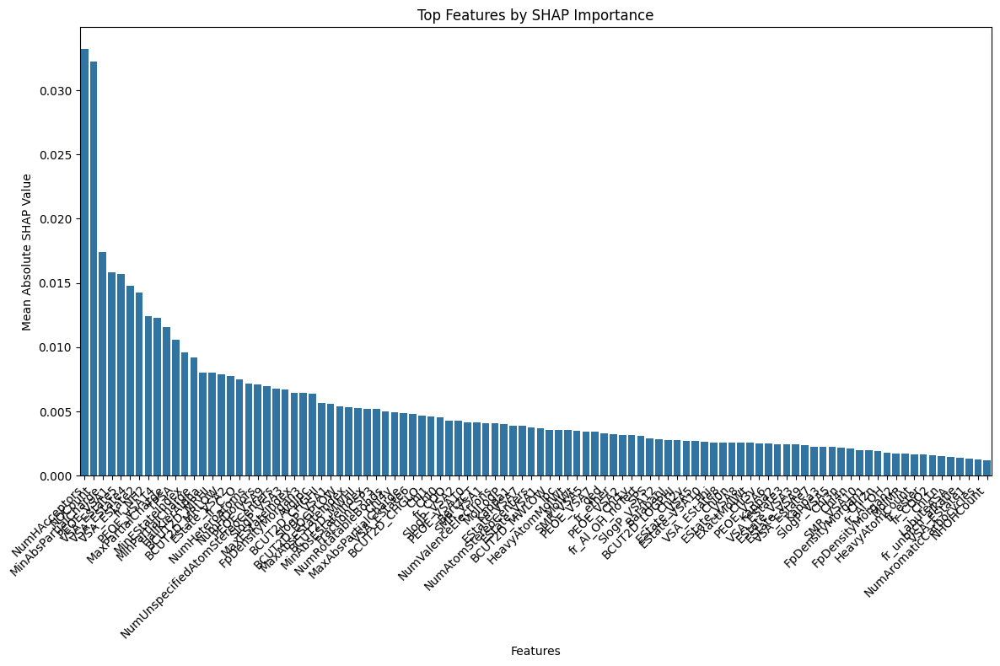


Performing Grid Search for Correlation-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:31:58] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Correlation-Based (Top 100 Features):
{'subsample': 0.6, 'reg_lambda': 2, 'reg_alpha': 0, 'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.2, 'gamma': 0, 'colsample_bytree': 1.0}
Accuracy: 0.9091
AUC Score: 0.9087
Precision: 0.8750
Recall: 1.0000
F1 Score: 0.9333
Confusion Matrix:
[[ 9  3]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.75      0.86        12
           1       0.88      1.00      0.93        21

    accuracy                           0.91        33
   macro avg       0.94      0.88      0.90        33
weighted avg       0.92      0.91      0.91        33



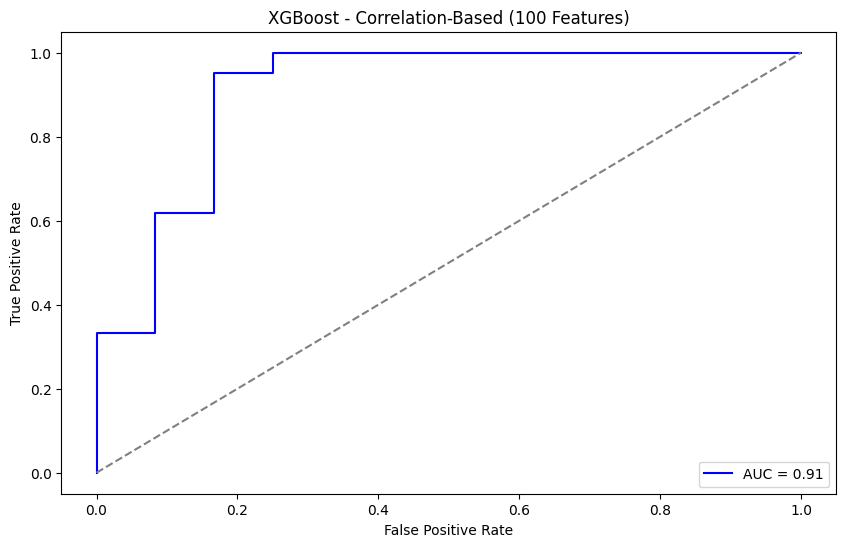


Performing Grid Search for Mutual Information-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:32:43] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for Mutual Information-Based (Top 100 Features):
{'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 50, 'max_depth': 9, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.6}
Accuracy: 0.8788
AUC Score: 0.9683
Precision: 0.9048
Recall: 0.9048
F1 Score: 0.9048
Confusion Matrix:
[[10  2]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        12
           1       0.90      0.90      0.90        21

    accuracy                           0.88        33
   macro avg       0.87      0.87      0.87        33
weighted avg       0.88      0.88      0.88        33



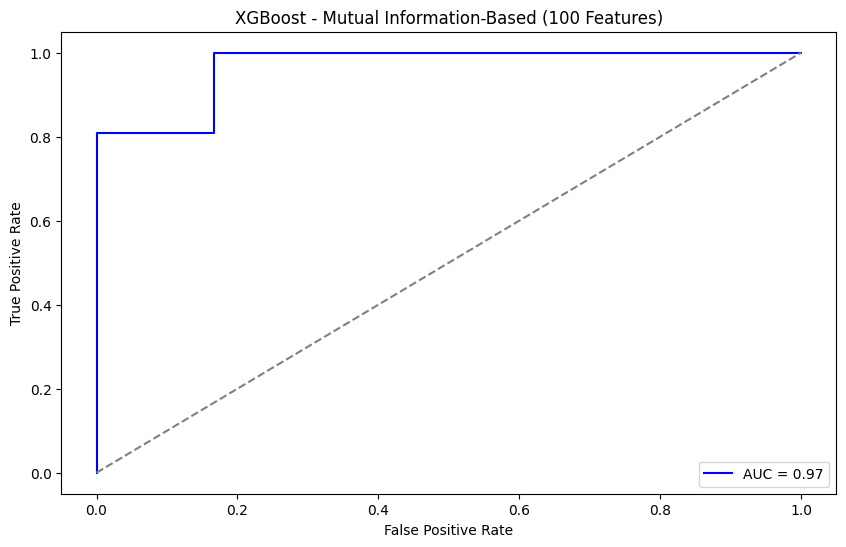


Performing Grid Search for SHAP-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:33:27] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for SHAP-Based (Top 100 Features):
{'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 50, 'max_depth': 9, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.6}
Accuracy: 0.8788
AUC Score: 0.9563
Precision: 0.9048
Recall: 0.9048
F1 Score: 0.9048
Confusion Matrix:
[[10  2]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.83      0.83        12
           1       0.90      0.90      0.90        21

    accuracy                           0.88        33
   macro avg       0.87      0.87      0.87        33
weighted avg       0.88      0.88      0.88        33



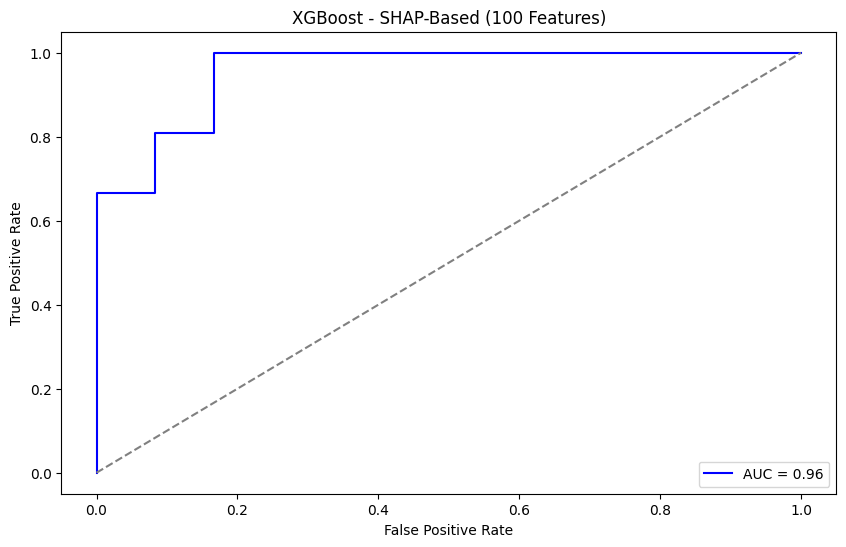


Performing Grid Search for All Features (Top all Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [21:34:26] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)



Best Parameters for All Features (Top all Features):
{'subsample': 0.8, 'reg_lambda': 2, 'reg_alpha': 0.1, 'n_estimators': 50, 'max_depth': 9, 'learning_rate': 0.05, 'gamma': 0, 'colsample_bytree': 0.6}
Accuracy: 0.9394
AUC Score: 0.9643
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



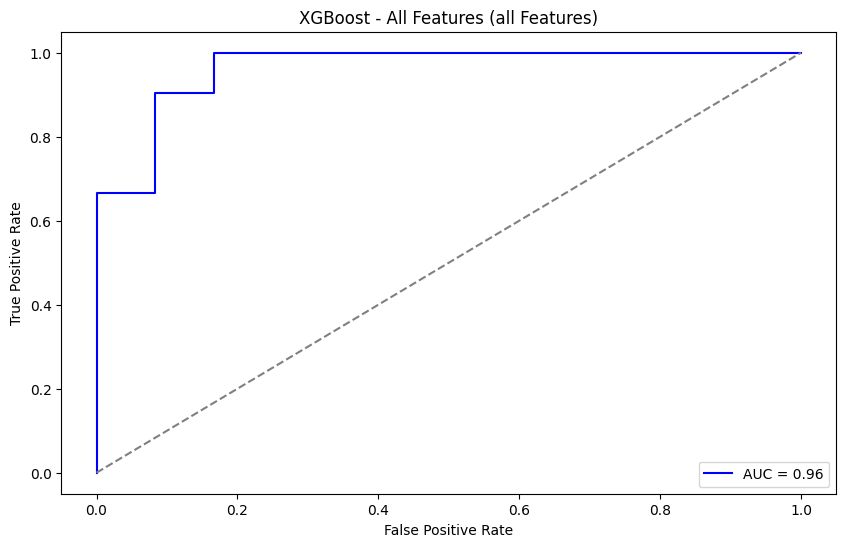


=== Overall Best Model ===
Feature Selection Method: SHAP-Based (50 Features)
Selected Features: 115                      NumHAcceptors
105                            NOCount
14                 MinAbsPartialCharge
47                           PEOE_VSA1
97                         VSA_EState5
96                         VSA_EState4
94                         VSA_EState2
143                             fr_NH2
52                          PEOE_VSA14
11                    MaxPartialCharge
81                                TPSA
3                       MinEStateIndex
12                    MinPartialCharge
41                       HallKierAlpha
24                         BCUT2D_MRHI
25                        BCUT2D_MRLOW
84                         EState_VSA2
138                             fr_C_O
117                     NumHeteroatoms
116                         NumHDonors
60                           PEOE_VSA9
123    NumUnspecifiedAtomStereoCenters
75                          SlogP_VSA3
1    

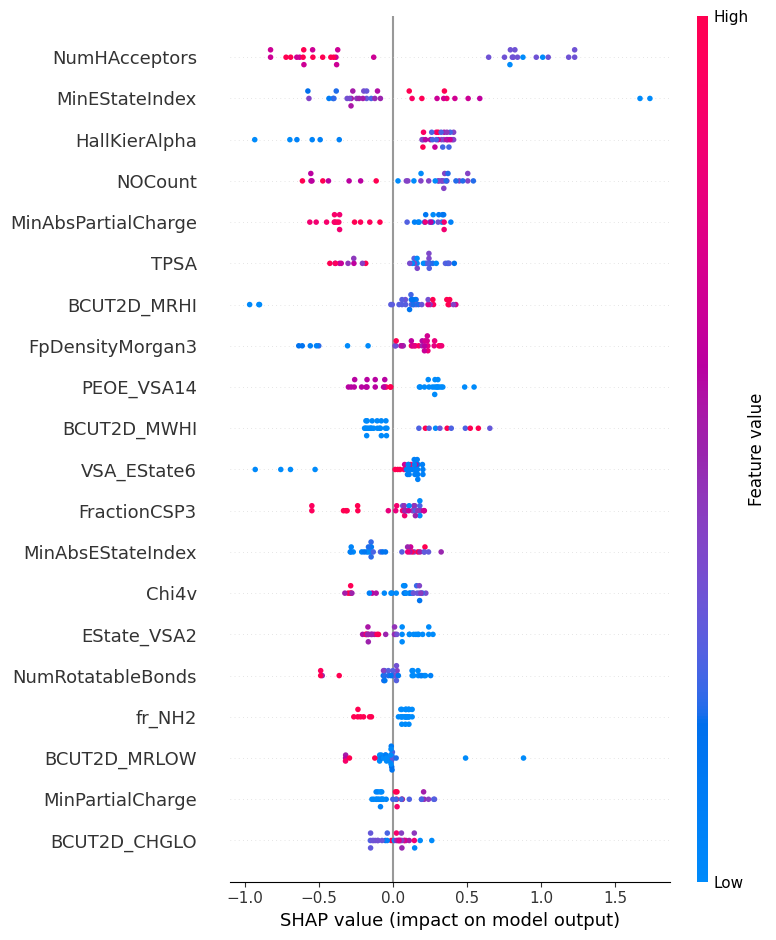

In [ ]:
# param_grid_xgb = {
#     'max_depth': [3, 5, 7],
#     'learning_rate': [0.01, 0.1, 0.2],
#     'n_estimators': [50, 100, 150]
# }

param_grid_xgb = {
    'n_estimators': [50, 100, 150, 200],
    'max_depth': [3, 5, 7, 9],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0],
    'gamma': [0, 1, 5],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 2, 5]
}


run_model_grid_search(
    df=df,
    target_column='Irritant',
    model_class=xgb.XGBClassifier,
    param_grid=param_grid_xgb,
    feature_counts=feature_counts,
    feature_selection_methods=feature_selection_methods,
    model_name="XGBoost",
    save_filename="best_xgb_model.pkl",
    extra_model_kwargs={'use_label_encoder': False, 'eval_metric': 'logloss', 'random_state': 42},
    use_random_search=True,
    n_iter=40
)

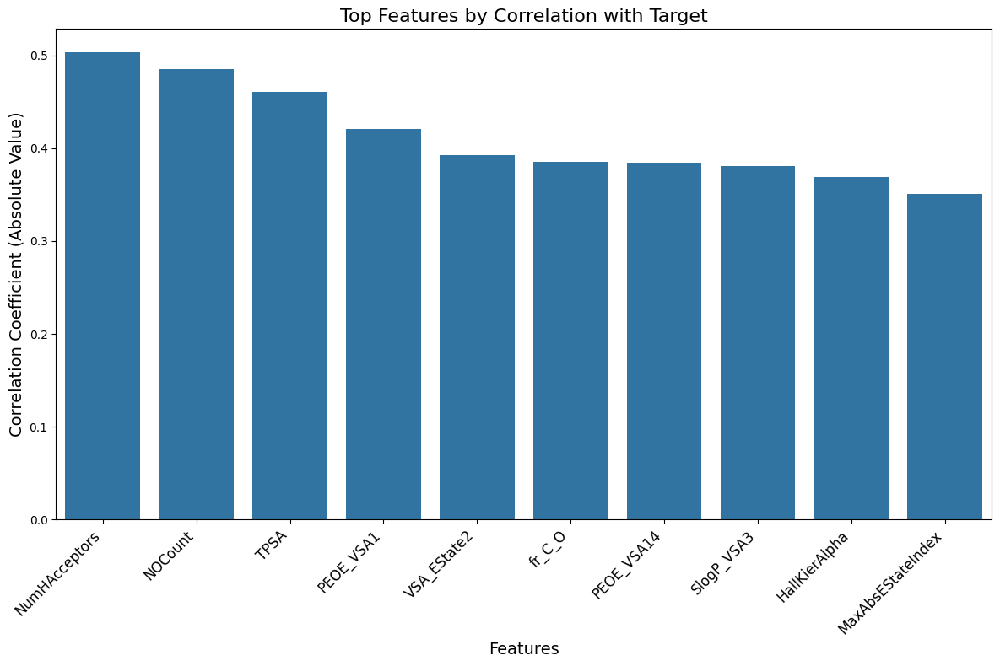

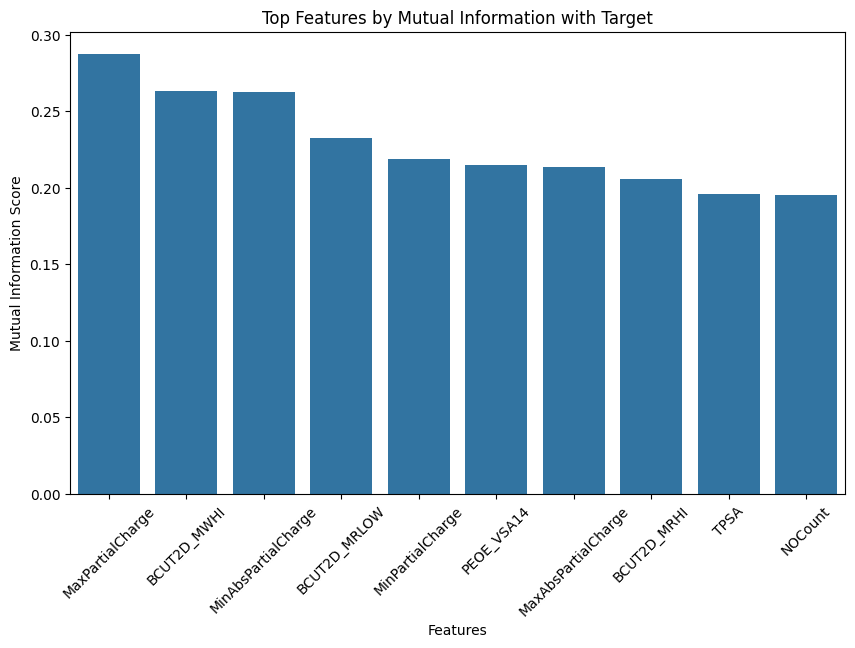

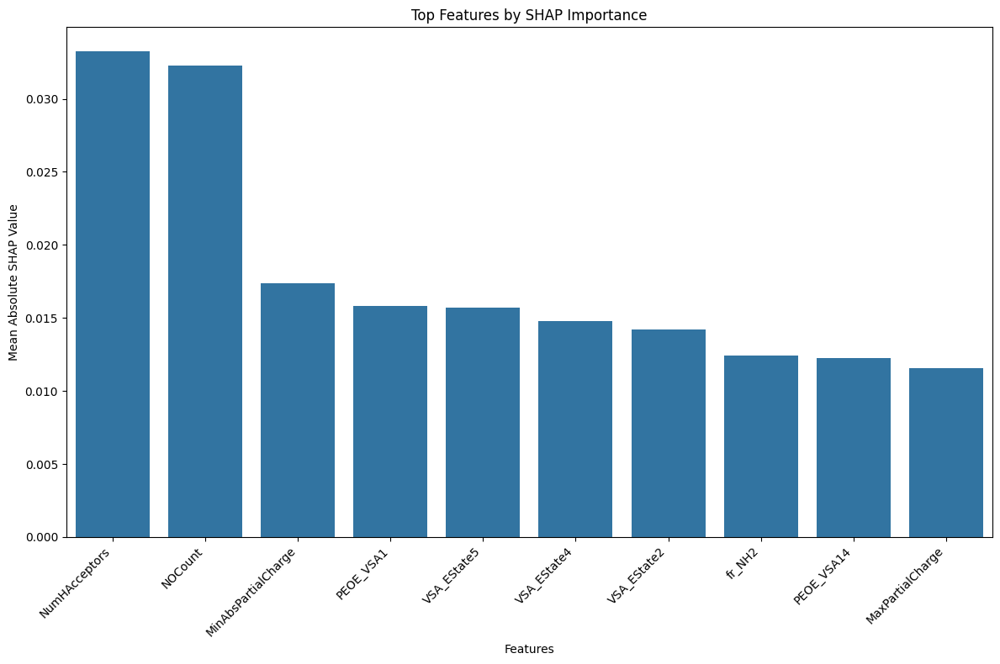


Performing Grid Search for Correlation-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 10 Features):
{'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 10, 'bootstrap': True}
Accuracy: 0.7879
AUC Score: 0.8889
Precision: 0.7917
Recall: 0.9048
F1 Score: 0.8444
Confusion Matrix:
[[ 7  5]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.58      0.67        12
           1       0.79      0.90      0.84        21

    accuracy                           0.79        33
   macro avg       0.78      0.74      0.76        33
weighted avg       0.79      0.79      0.78        33



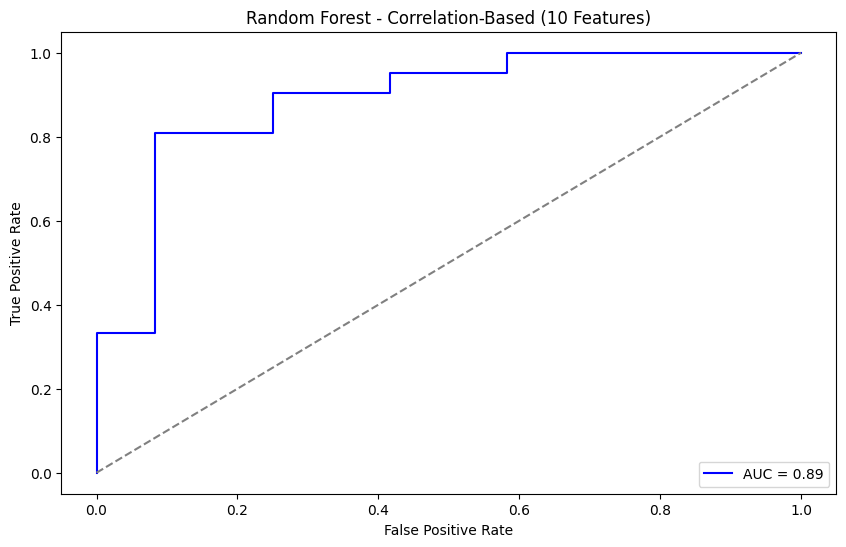


Performing Grid Search for Mutual Information-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 10 Features):
{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 5, 'bootstrap': True}
Accuracy: 0.8485
AUC Score: 0.9405
Precision: 0.9000
Recall: 0.8571
F1 Score: 0.8780
Confusion Matrix:
[[10  2]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.83      0.80        12
           1       0.90      0.86      0.88        21

    accuracy                           0.85        33
   macro avg       0.83      0.85      0.84        33
weighted avg       0.85      0.85      0.85        33



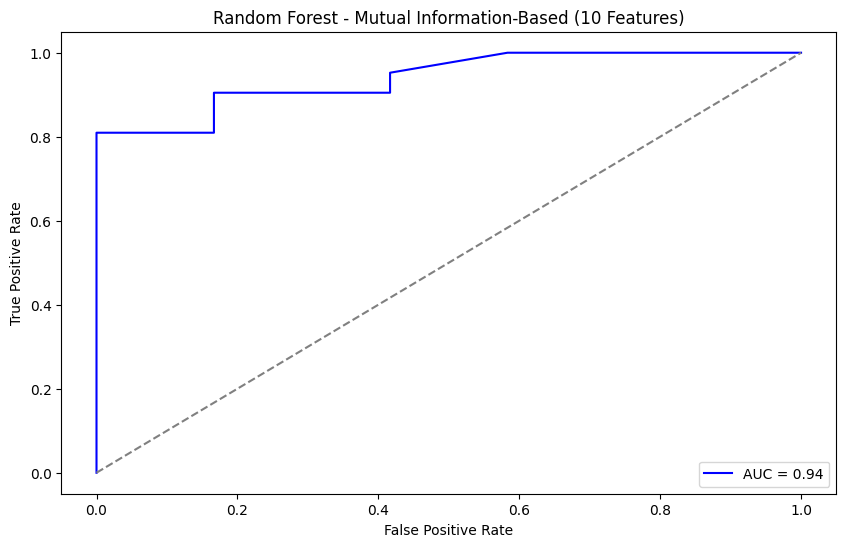


Performing Grid Search for SHAP-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 10 Features):
{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'bootstrap': True}
Accuracy: 0.8485
AUC Score: 0.9484
Precision: 0.9000
Recall: 0.8571
F1 Score: 0.8780
Confusion Matrix:
[[10  2]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.83      0.80        12
           1       0.90      0.86      0.88        21

    accuracy                           0.85        33
   macro avg       0.83      0.85      0.84        33
weighted avg       0.85      0.85      0.85        33



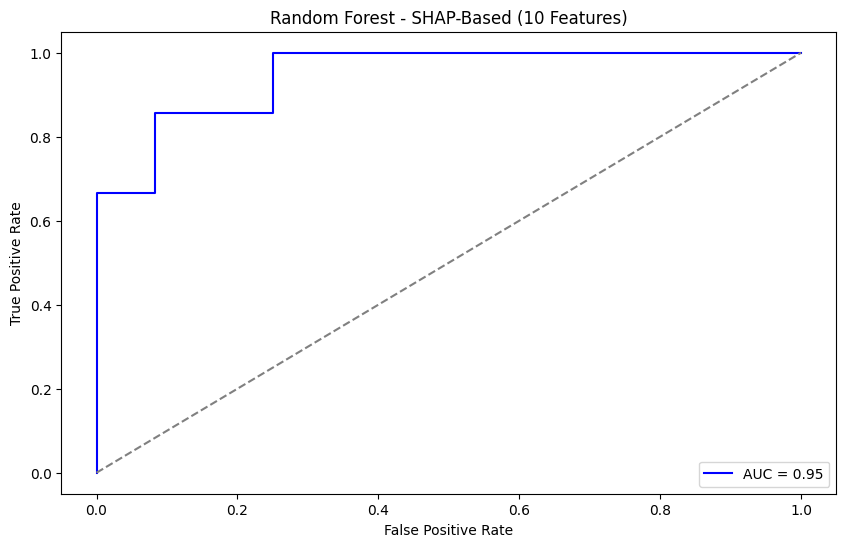

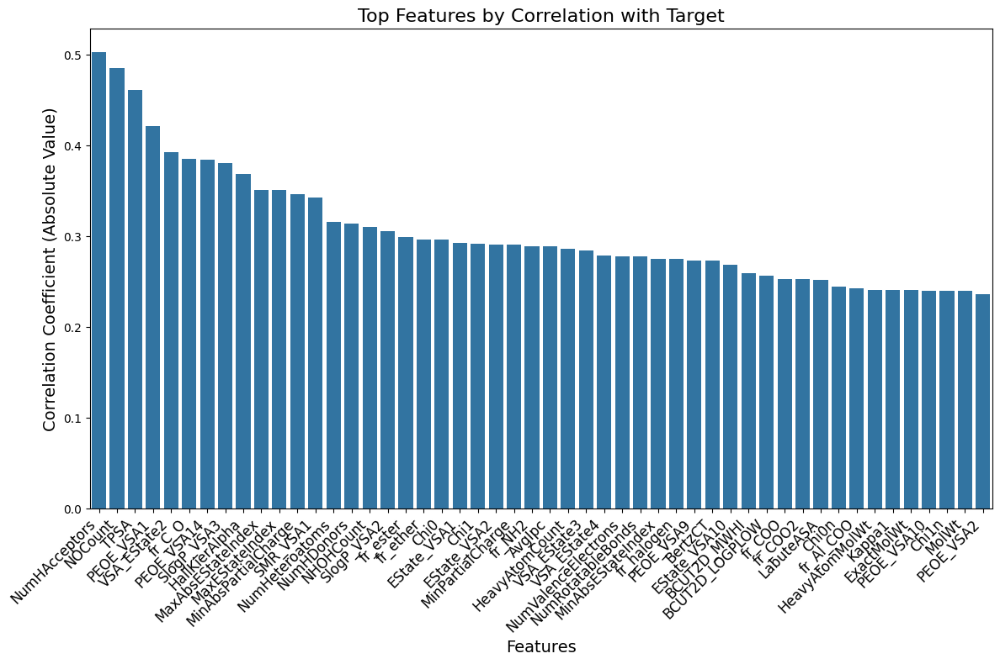

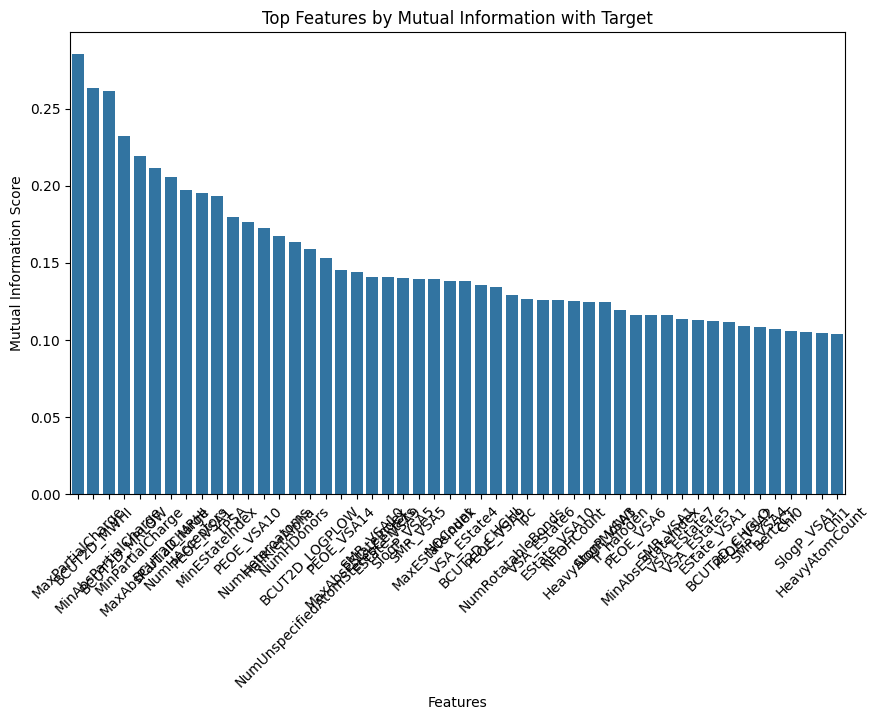

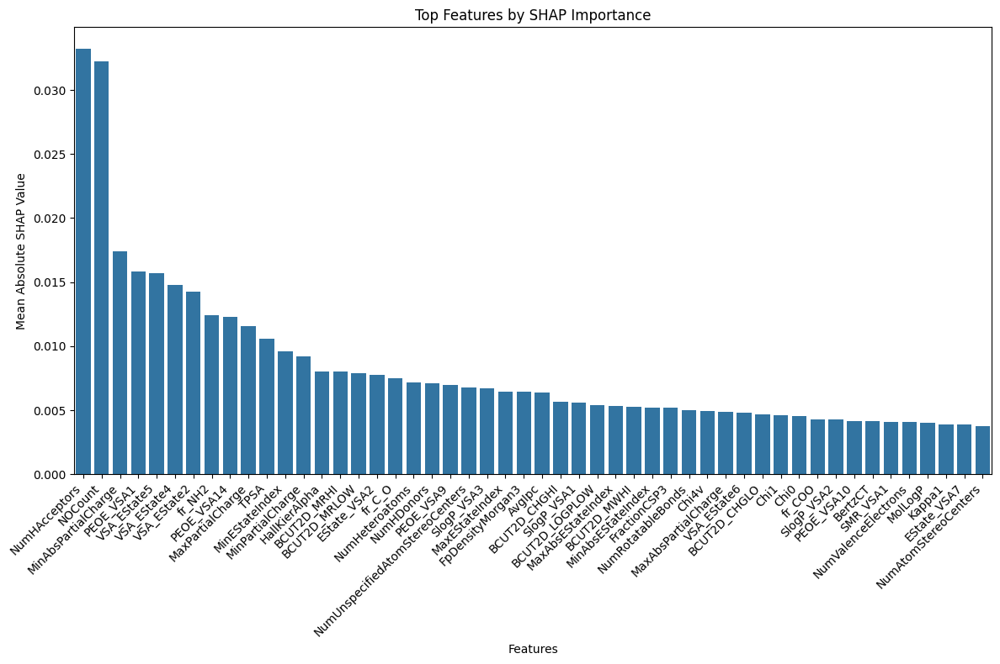


Performing Grid Search for Correlation-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 50 Features):
{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 10, 'bootstrap': True}
Accuracy: 0.9091
AUC Score: 0.9742
Precision: 0.8750
Recall: 1.0000
F1 Score: 0.9333
Confusion Matrix:
[[ 9  3]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.75      0.86        12
           1       0.88      1.00      0.93        21

    accuracy                           0.91        33
   macro avg       0.94      0.88      0.90        33
weighted avg       0.92      0.91      0.91        33



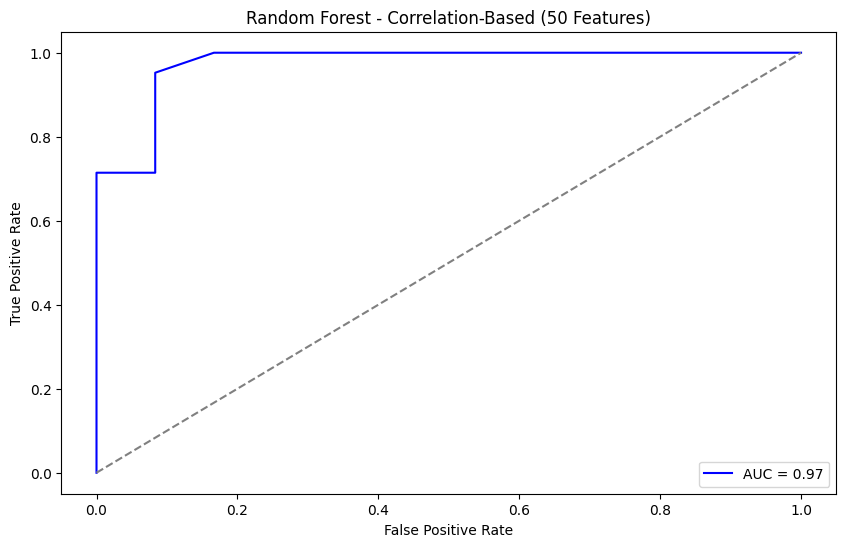


Performing Grid Search for Mutual Information-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 50 Features):
{'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True}
Accuracy: 0.9091
AUC Score: 0.9524
Precision: 0.9091
Recall: 0.9524
F1 Score: 0.9302
Confusion Matrix:
[[10  2]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.91      0.95      0.93        21

    accuracy                           0.91        33
   macro avg       0.91      0.89      0.90        33
weighted avg       0.91      0.91      0.91        33



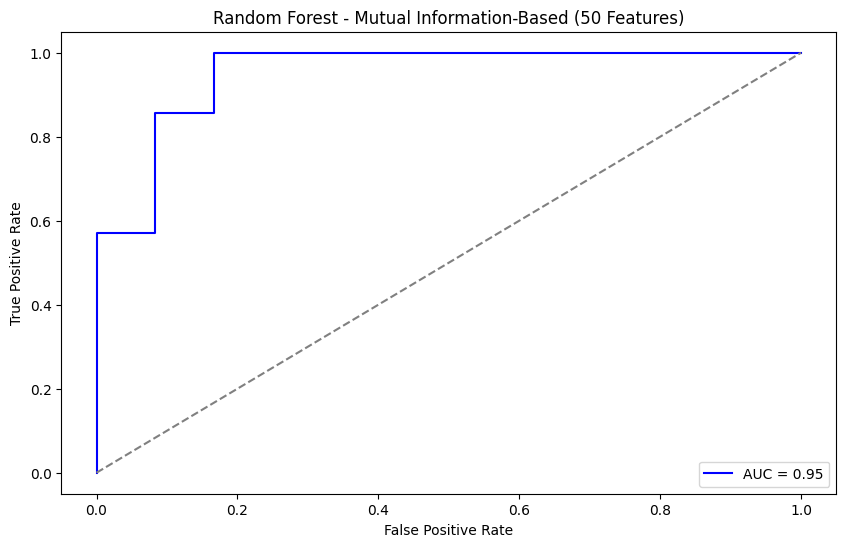


Performing Grid Search for SHAP-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 50 Features):
{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 5, 'bootstrap': False}
Accuracy: 0.9091
AUC Score: 0.9603
Precision: 0.9091
Recall: 0.9524
F1 Score: 0.9302
Confusion Matrix:
[[10  2]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.91      0.95      0.93        21

    accuracy                           0.91        33
   macro avg       0.91      0.89      0.90        33
weighted avg       0.91      0.91      0.91        33



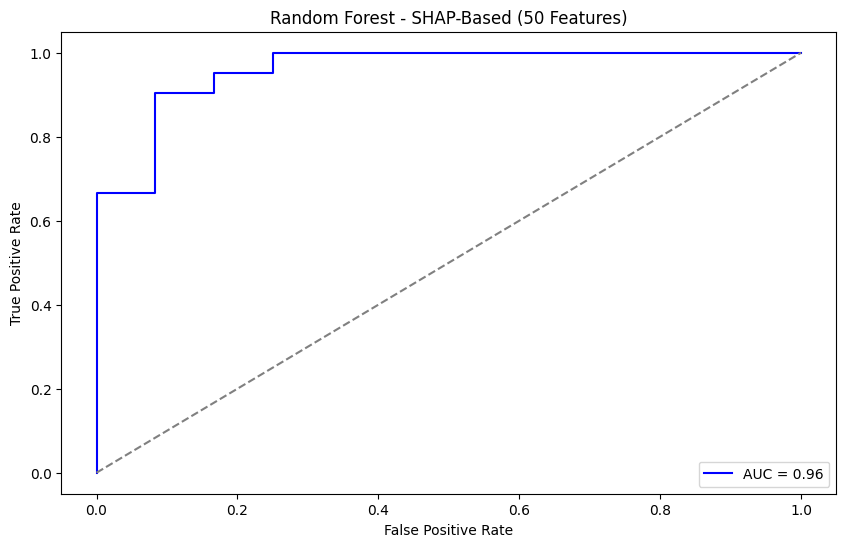

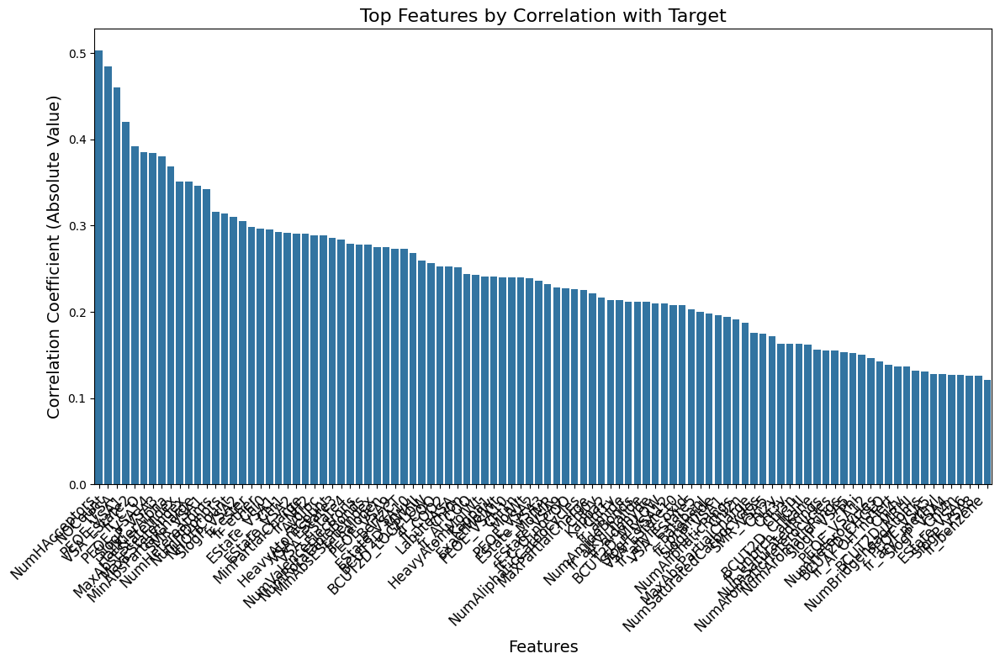

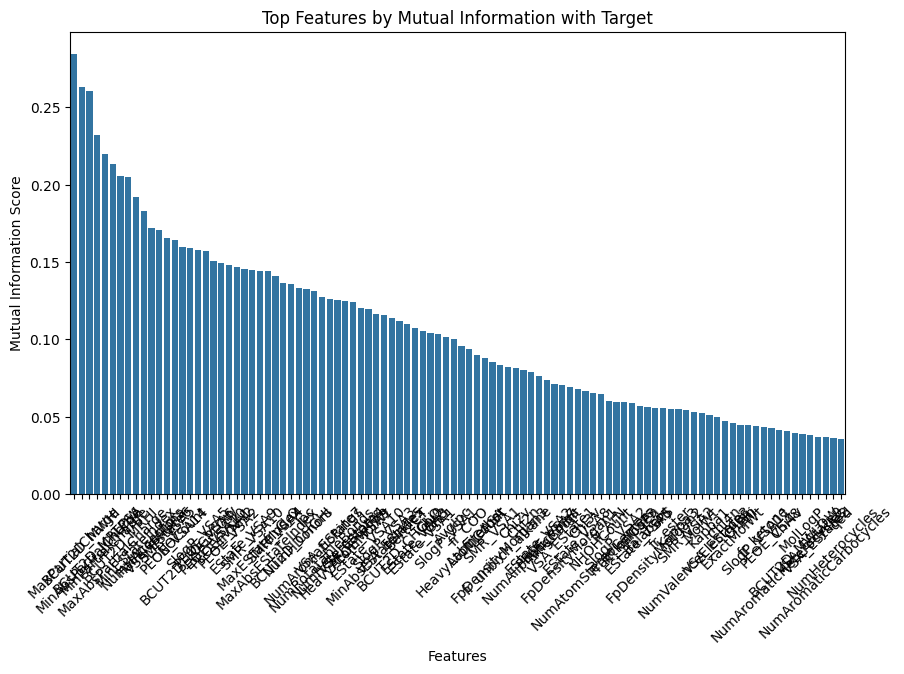

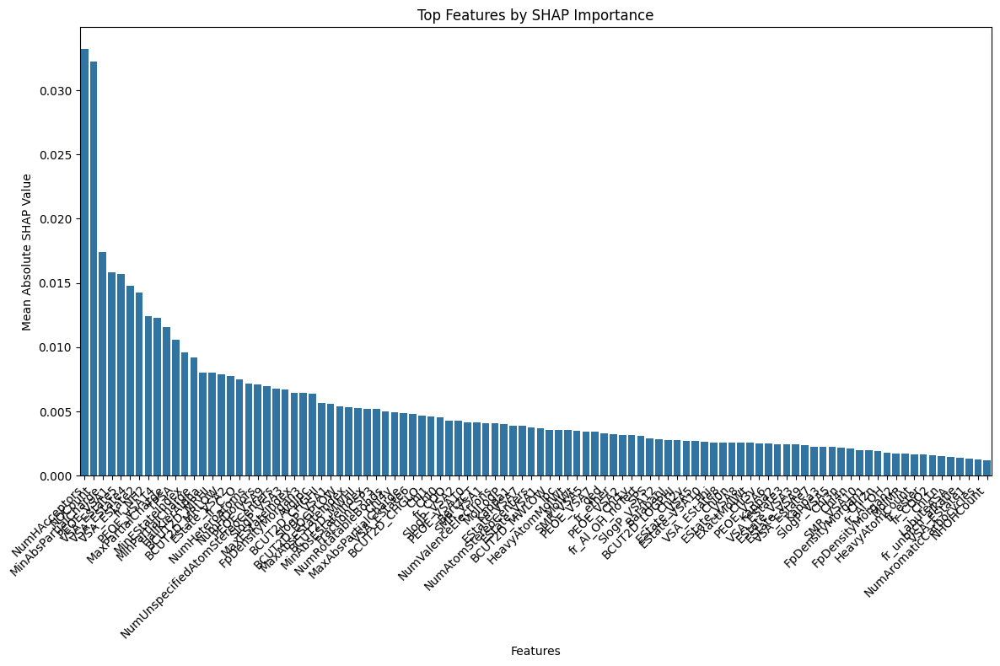


Performing Grid Search for Correlation-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 100 Features):
{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'bootstrap': True}
Accuracy: 0.8788
AUC Score: 0.9762
Precision: 0.8696
Recall: 0.9524
F1 Score: 0.9091
Confusion Matrix:
[[ 9  3]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.75      0.82        12
           1       0.87      0.95      0.91        21

    accuracy                           0.88        33
   macro avg       0.88      0.85      0.86        33
weighted avg       0.88      0.88      0.88        33



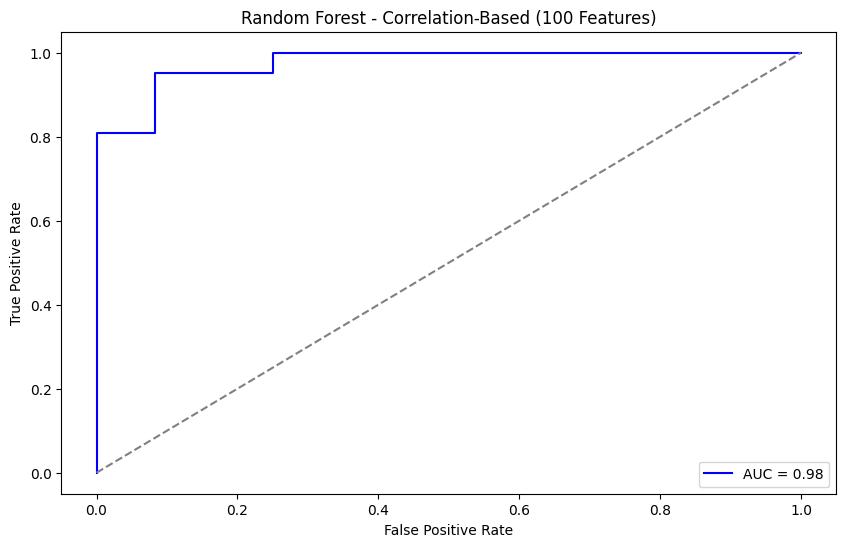


Performing Grid Search for Mutual Information-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 100 Features):
{'n_estimators': 200, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': None, 'bootstrap': False}
Accuracy: 0.9394
AUC Score: 0.9683
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



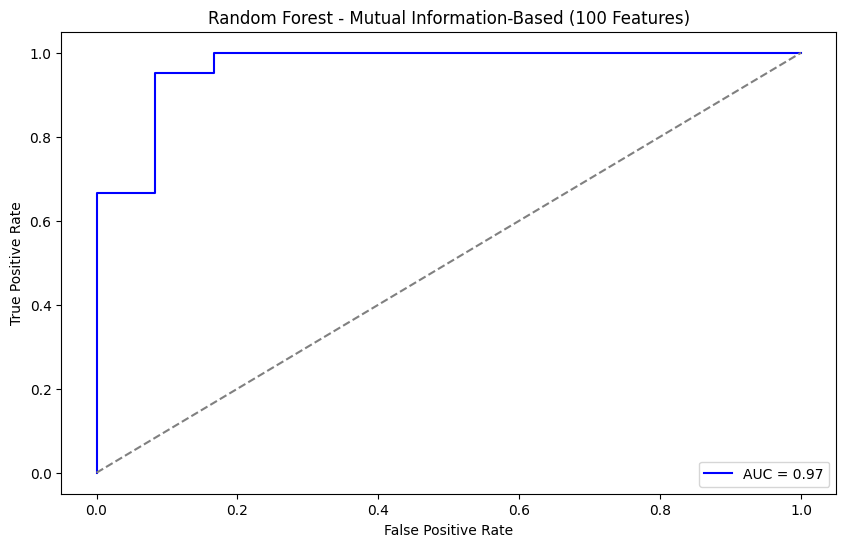


Performing Grid Search for SHAP-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 100 Features):
{'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': None, 'bootstrap': False}
Accuracy: 0.9394
AUC Score: 0.9921
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



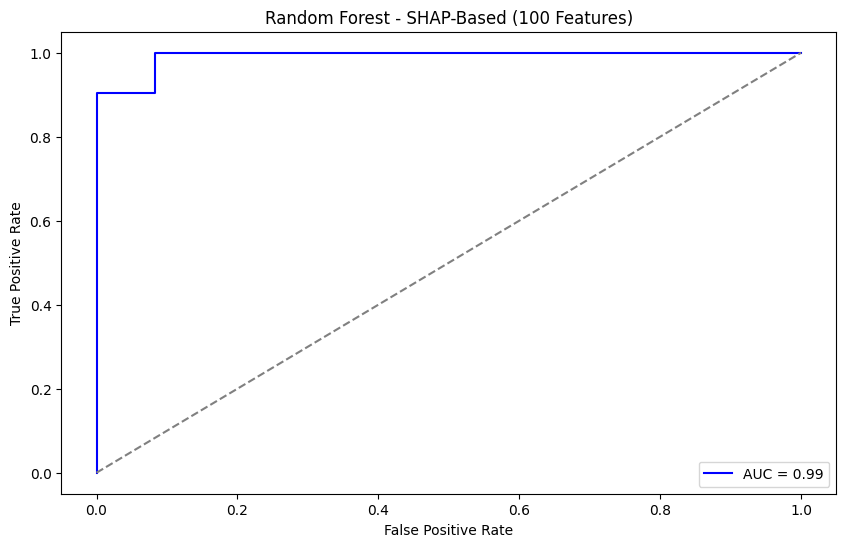


Performing Grid Search for All Features (Top all Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for All Features (Top all Features):
{'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 20, 'bootstrap': False}
Accuracy: 0.9091
AUC Score: 0.9802
Precision: 0.9091
Recall: 0.9524
F1 Score: 0.9302
Confusion Matrix:
[[10  2]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.91      0.95      0.93        21

    accuracy                           0.91        33
   macro avg       0.91      0.89      0.90        33
weighted avg       0.91      0.91      0.91        33



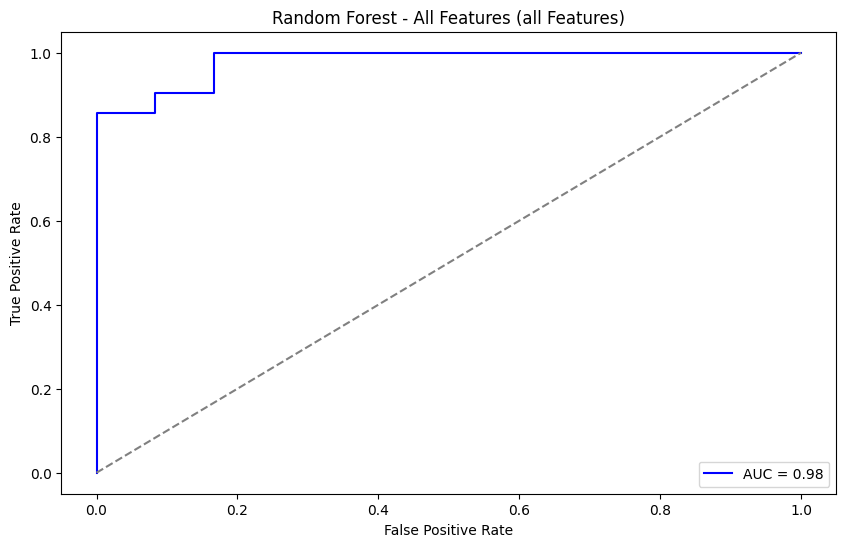


=== Overall Best Model ===
Feature Selection Method: SHAP-Based (100 Features)
Selected Features: 115             NumHAcceptors
105                   NOCount
14        MinAbsPartialCharge
47                  PEOE_VSA1
97                VSA_EState5
                ...          
46                  LabuteASA
180          fr_unbrch_alkane
92                VSA_EState1
110    NumAromaticCarbocycles
104                 NHOHCount
Name: feature, Length: 100, dtype: object
AUC Score: 0.9921
Accuracy: 0.9394
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545

Confusion Matrix:
[[10  2]
 [ 0 21]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33


Best model saved to best_rf_model.pkl
Selected feature

<Figure size 640x480 with 0 Axes>

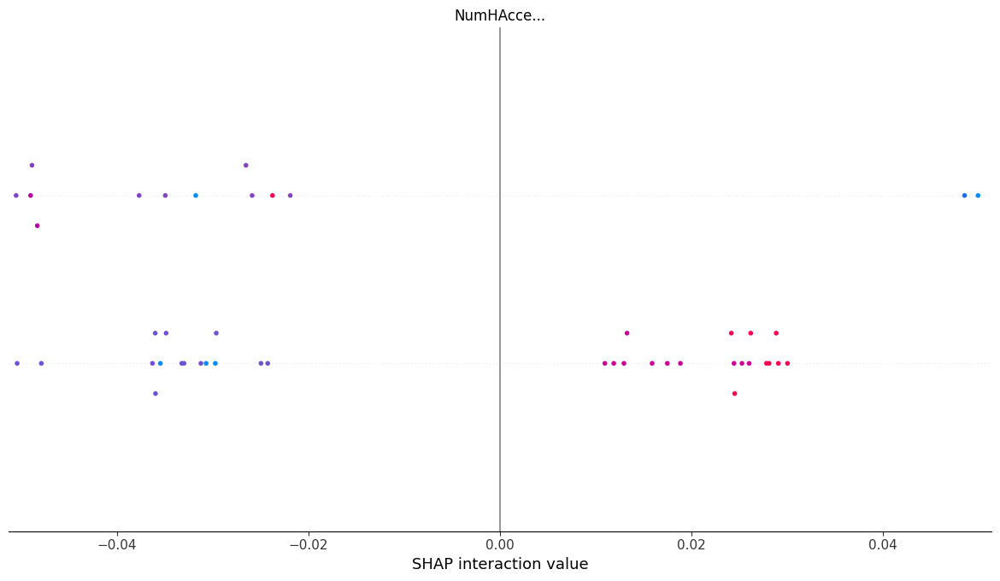

In [ ]:
param_grid_rf = {
    'n_estimators': [100, 200, 300],
    'max_depth': [5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2', None],
    'bootstrap': [True, False]
}


run_model_grid_search(
    df=df,
    target_column='Irritant',
    model_class=RandomForestClassifier,
    param_grid=param_grid_rf,
    feature_counts=feature_counts,
    feature_selection_methods=feature_selection_methods,
    model_name="Random Forest",
    save_filename="best_rf_model.pkl",
    extra_model_kwargs={'random_state': 42},
    use_random_search=True,
    n_iter=40
)


Data scaled using StandardScaler.


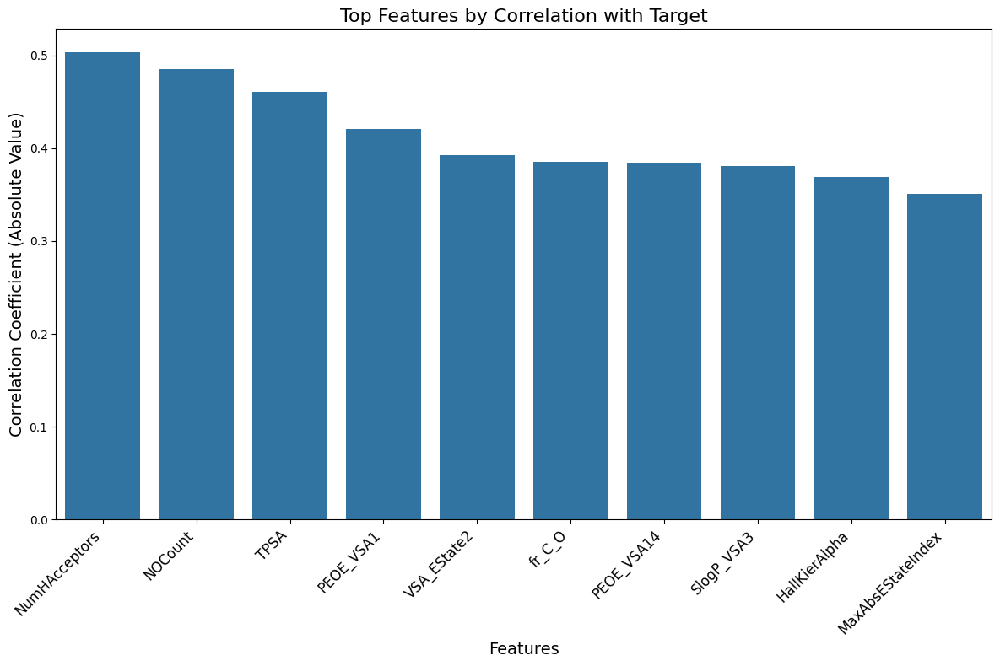

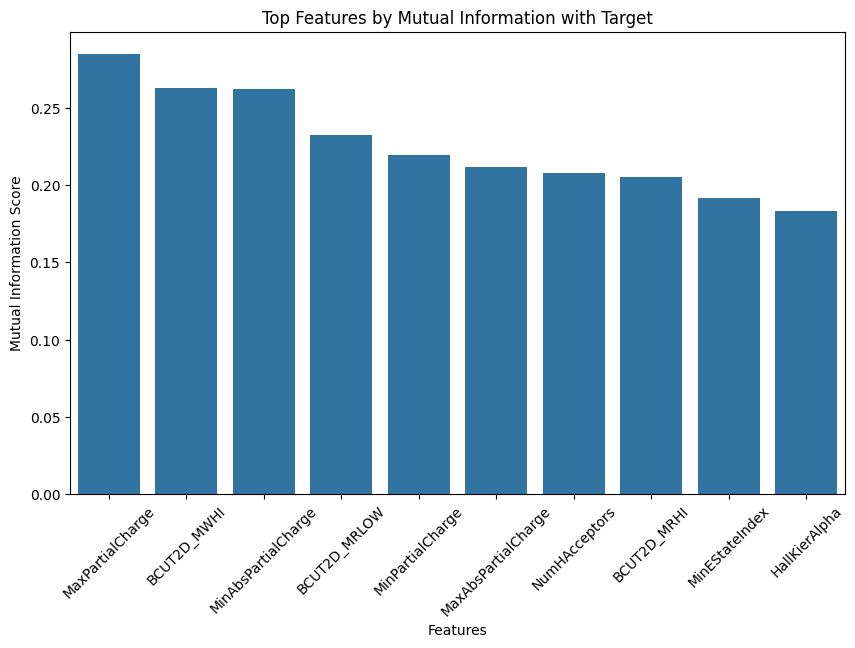

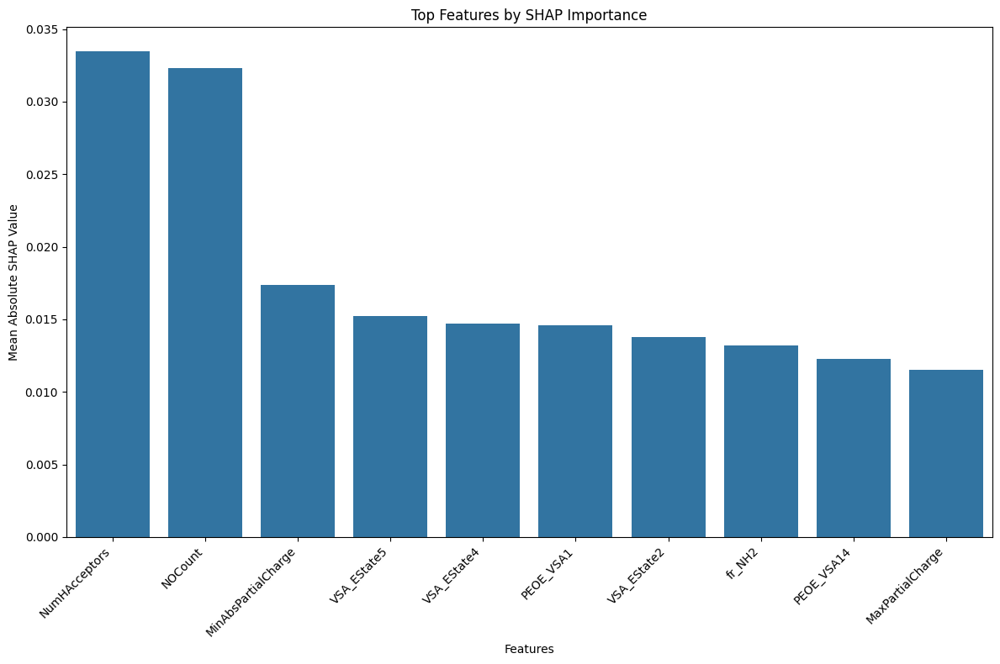


Performing Grid Search for Correlation-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 10 Features):
{'kernel': 'rbf', 'gamma': 'scale', 'C': 10}
Accuracy: 0.7879
AUC Score: 0.8492
Precision: 0.8500
Recall: 0.8095
F1 Score: 0.8293
Confusion Matrix:
[[ 9  3]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.75      0.72        12
           1       0.85      0.81      0.83        21

    accuracy                           0.79        33
   macro avg       0.77      0.78      0.77        33
weighted avg       0.79      0.79      0.79        33



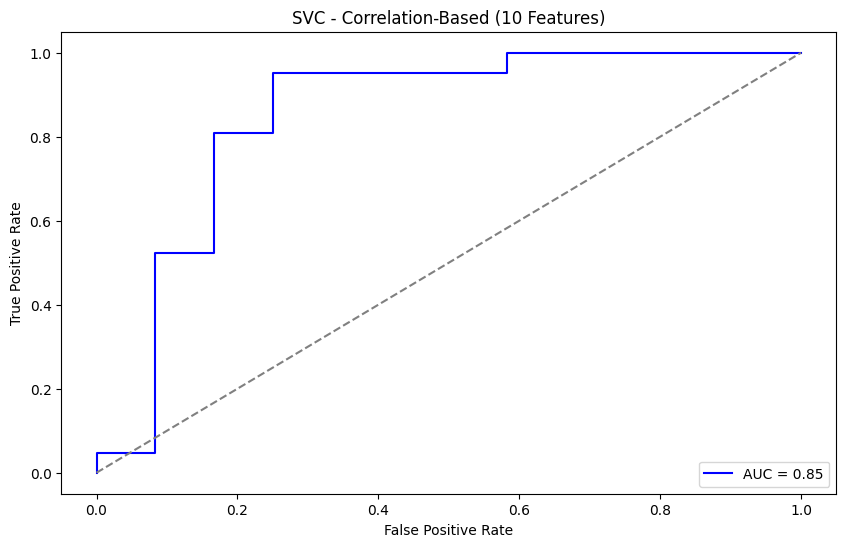


Performing Grid Search for Mutual Information-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 10 Features):
{'kernel': 'rbf', 'gamma': 0.1, 'C': 10}
Accuracy: 0.8182
AUC Score: 0.8532
Precision: 0.8947
Recall: 0.8095
F1 Score: 0.8500
Confusion Matrix:
[[10  2]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77        12
           1       0.89      0.81      0.85        21

    accuracy                           0.82        33
   macro avg       0.80      0.82      0.81        33
weighted avg       0.83      0.82      0.82        33



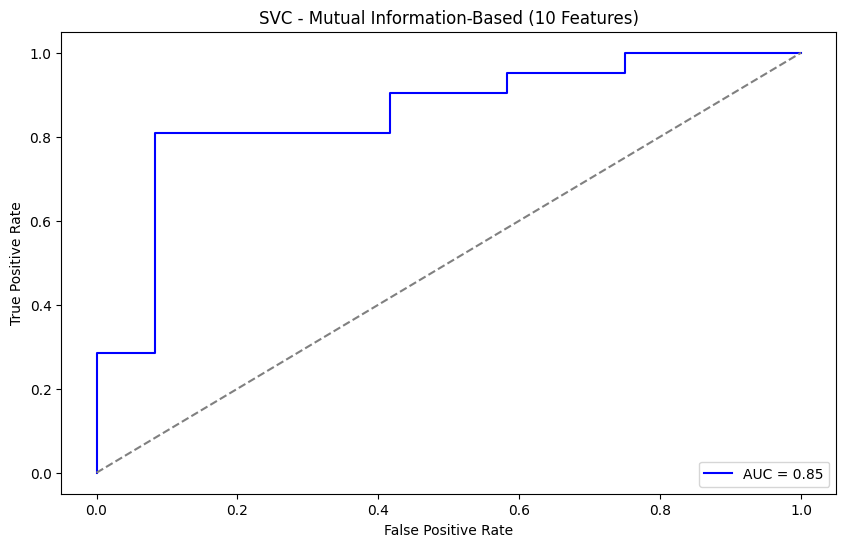


Performing Grid Search for SHAP-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 10 Features):
{'kernel': 'rbf', 'gamma': 0.01, 'C': 100}
Accuracy: 0.7879
AUC Score: 0.8294
Precision: 0.8500
Recall: 0.8095
F1 Score: 0.8293
Confusion Matrix:
[[ 9  3]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.69      0.75      0.72        12
           1       0.85      0.81      0.83        21

    accuracy                           0.79        33
   macro avg       0.77      0.78      0.77        33
weighted avg       0.79      0.79      0.79        33



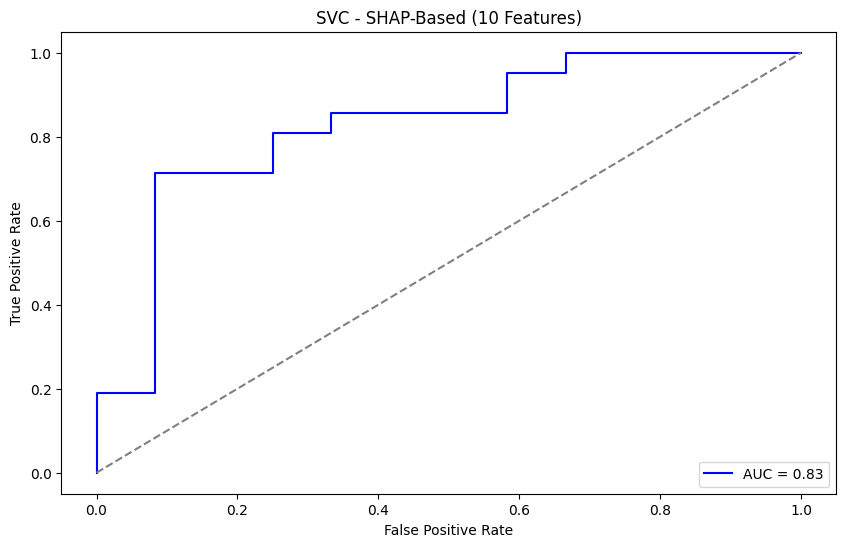

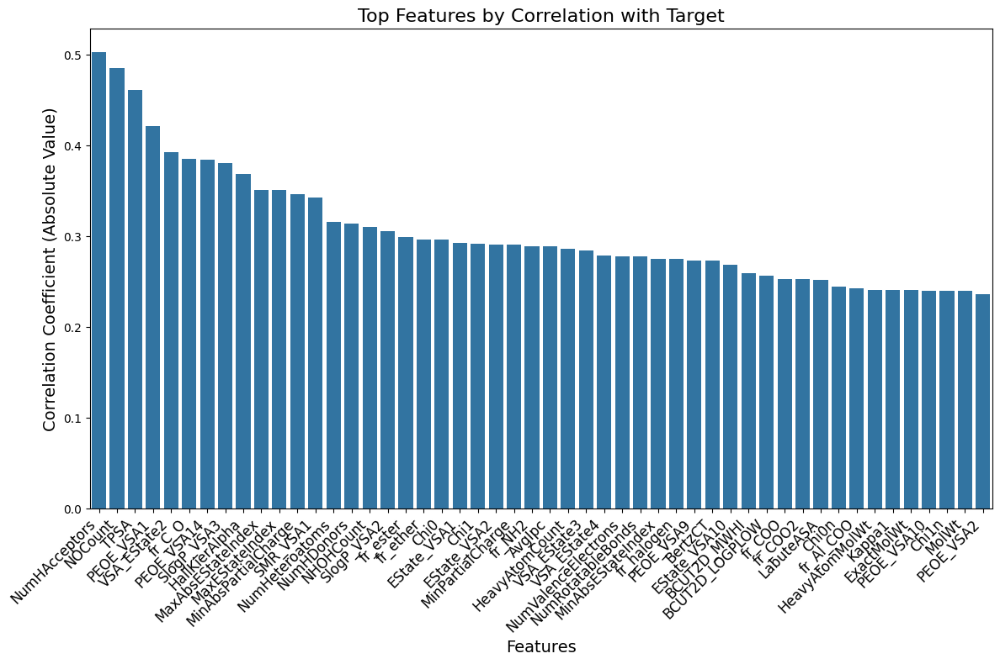

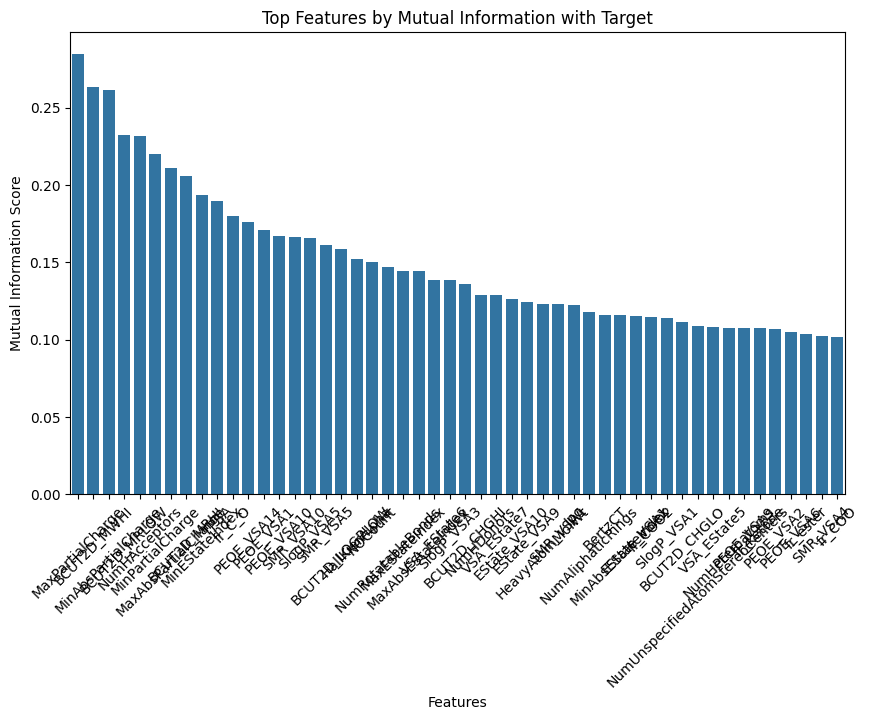

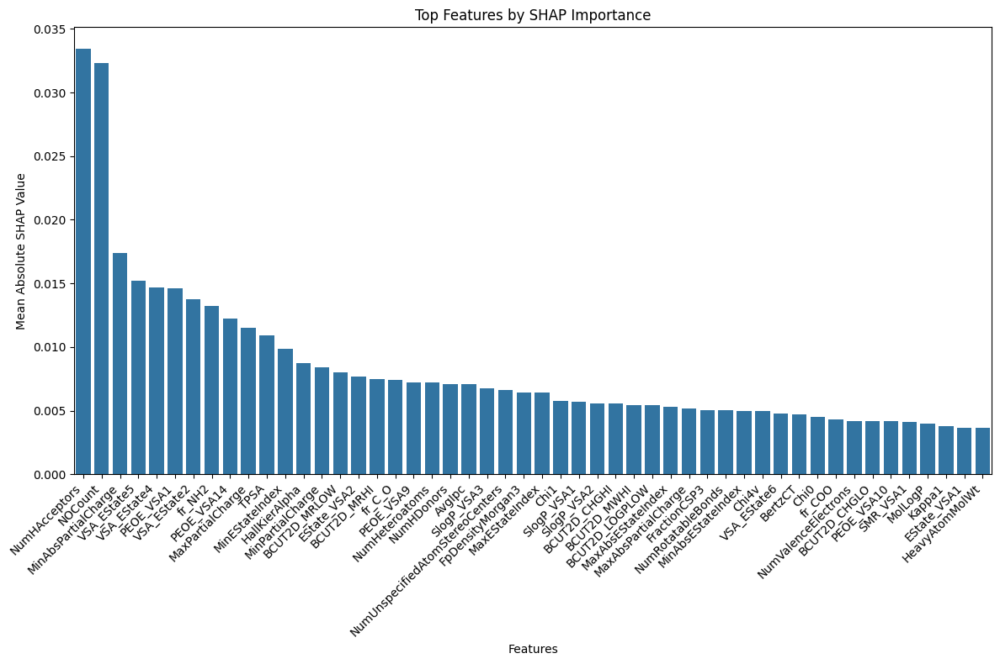


Performing Grid Search for Correlation-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 50 Features):
{'kernel': 'rbf', 'gamma': 1, 'C': 0.1}
Accuracy: 0.6364
AUC Score: 0.0655
Precision: 0.6364
Recall: 1.0000
F1 Score: 0.7778
Confusion Matrix:
[[ 0 12]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.64      1.00      0.78        21

    accuracy                           0.64        33
   macro avg       0.32      0.50      0.39        33
weighted avg       0.40      0.64      0.49        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


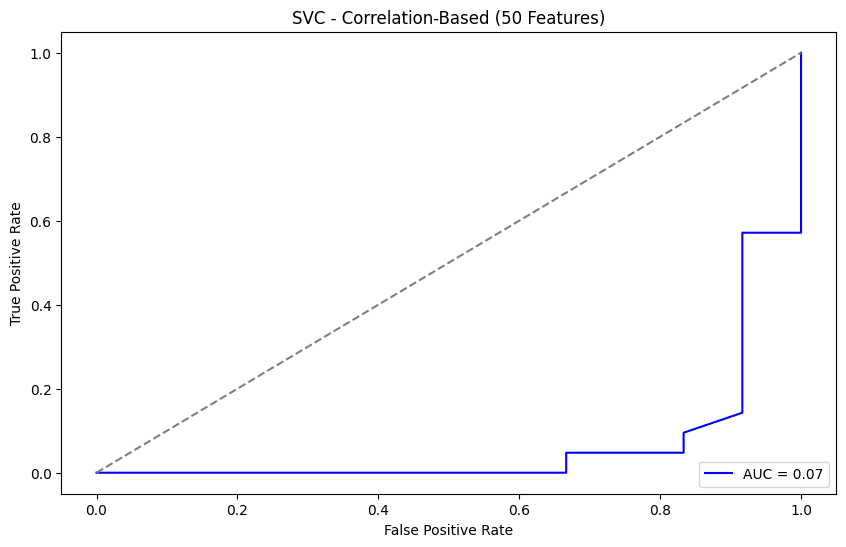


Performing Grid Search for Mutual Information-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 50 Features):
{'kernel': 'rbf', 'gamma': 0.1, 'C': 10}
Accuracy: 0.9091
AUC Score: 0.9683
Precision: 0.9091
Recall: 0.9524
F1 Score: 0.9302
Confusion Matrix:
[[10  2]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.91      0.95      0.93        21

    accuracy                           0.91        33
   macro avg       0.91      0.89      0.90        33
weighted avg       0.91      0.91      0.91        33



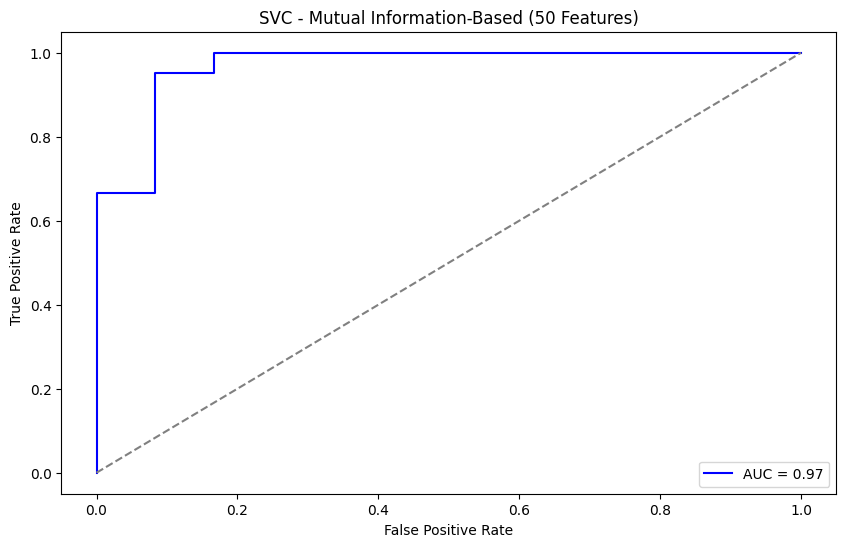


Performing Grid Search for SHAP-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 50 Features):
{'kernel': 'rbf', 'gamma': 1, 'C': 0.1}
Accuracy: 0.6364
AUC Score: 0.0119
Precision: 0.6364
Recall: 1.0000
F1 Score: 0.7778
Confusion Matrix:
[[ 0 12]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        12
           1       0.64      1.00      0.78        21

    accuracy                           0.64        33
   macro avg       0.32      0.50      0.39        33
weighted avg       0.40      0.64      0.49        33



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


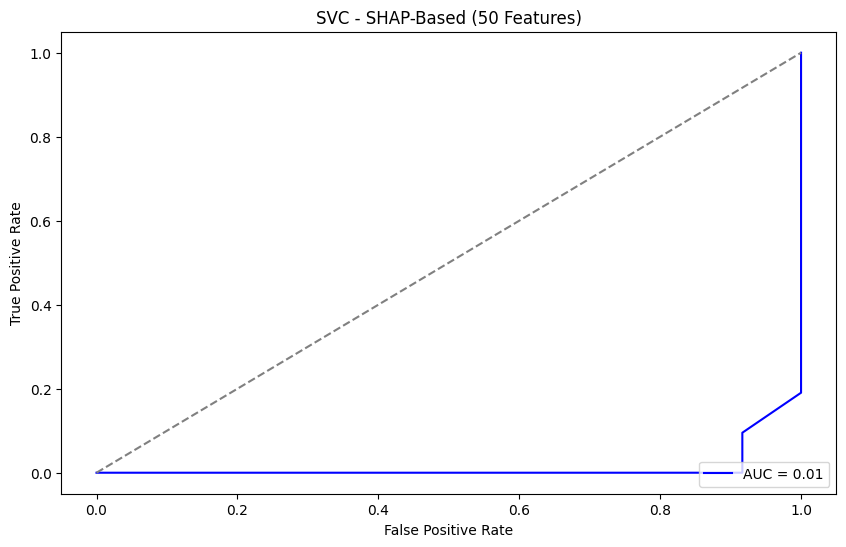

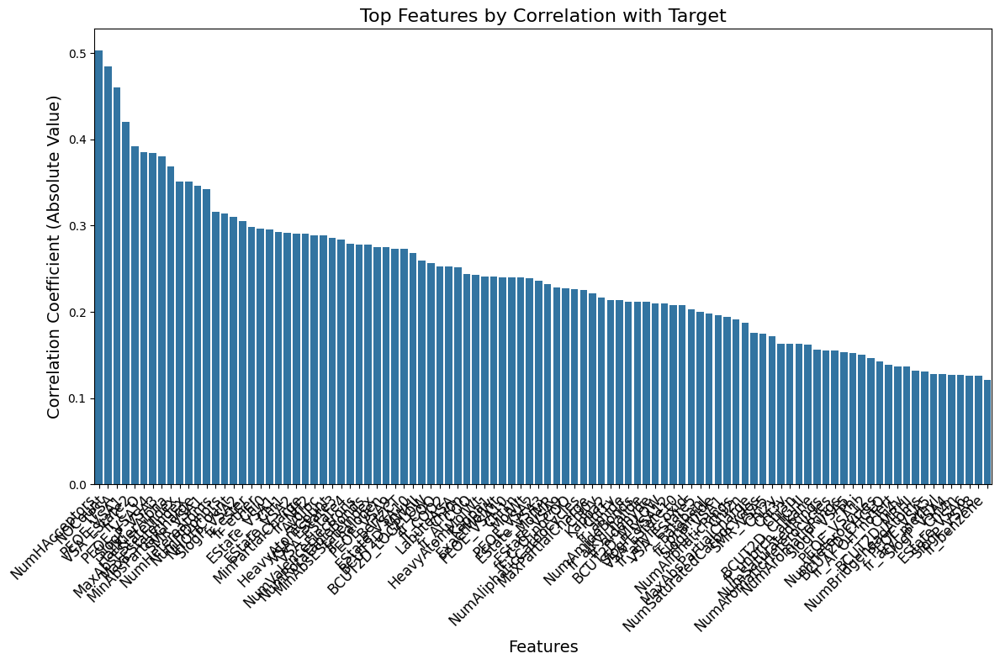

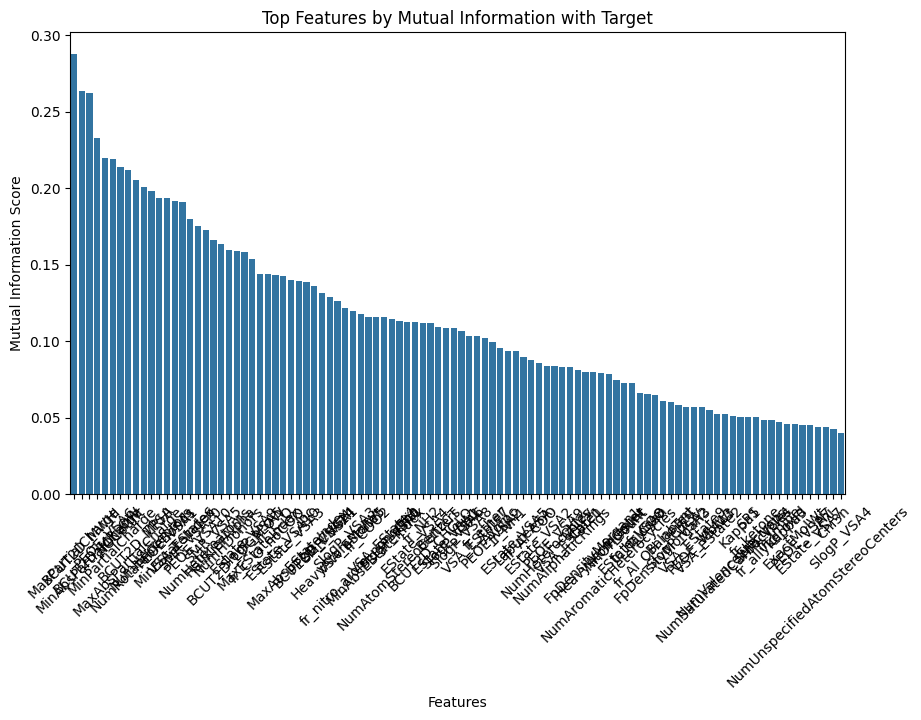

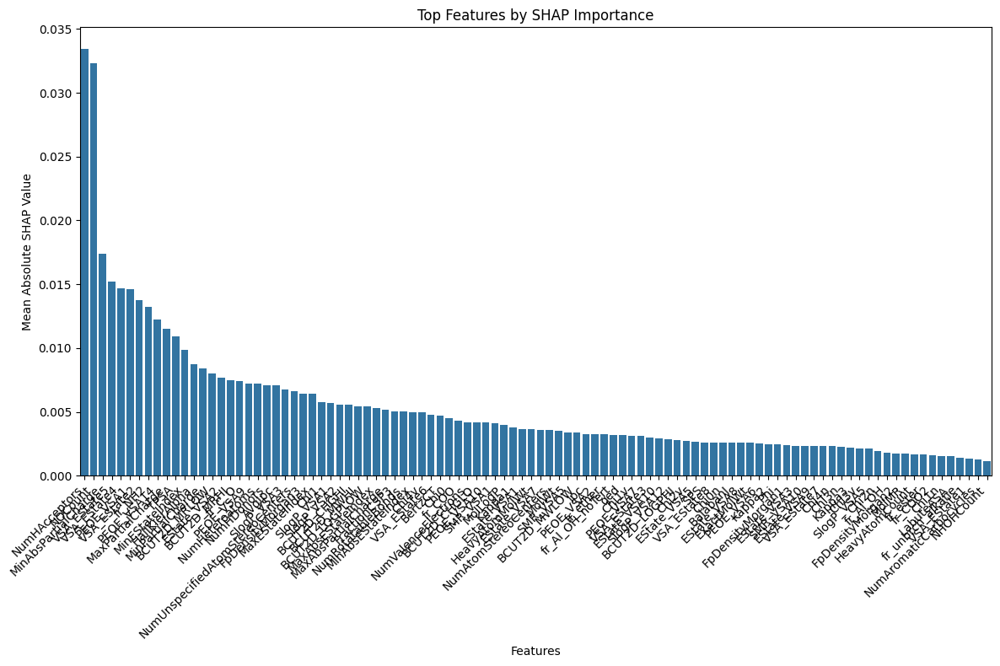


Performing Grid Search for Correlation-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 100 Features):
{'kernel': 'rbf', 'gamma': 'scale', 'C': 10}
Accuracy: 0.8485
AUC Score: 0.9127
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837
Confusion Matrix:
[[ 9  3]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78        12
           1       0.86      0.90      0.88        21

    accuracy                           0.85        33
   macro avg       0.84      0.83      0.83        33
weighted avg       0.85      0.85      0.85        33



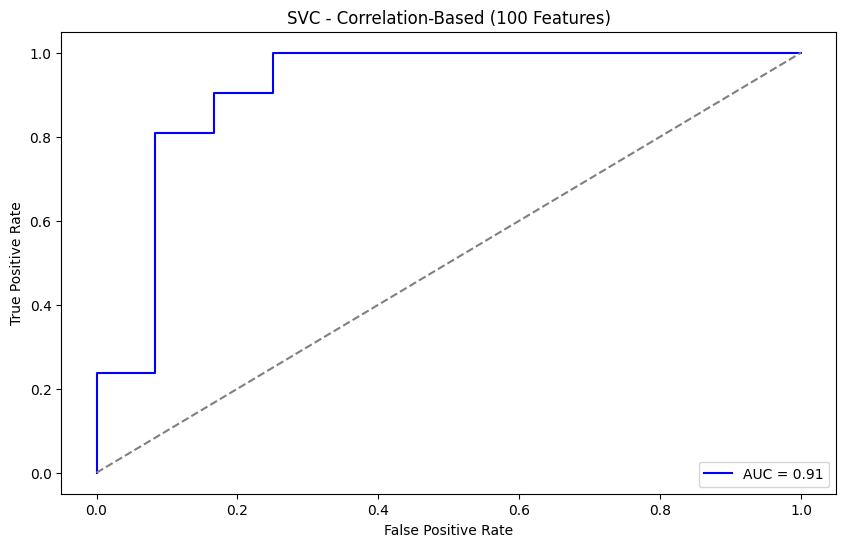


Performing Grid Search for Mutual Information-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 100 Features):
{'kernel': 'rbf', 'gamma': 0.1, 'C': 0.1}
Accuracy: 0.6970
AUC Score: 0.0595
Precision: 0.6774
Recall: 1.0000
F1 Score: 0.8077
Confusion Matrix:
[[ 2 10]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.17      0.29        12
           1       0.68      1.00      0.81        21

    accuracy                           0.70        33
   macro avg       0.84      0.58      0.55        33
weighted avg       0.79      0.70      0.62        33



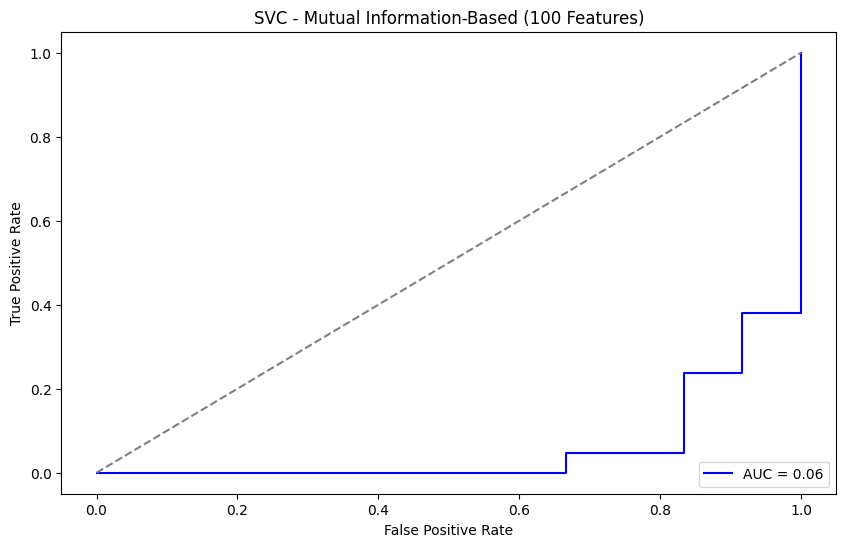


Performing Grid Search for SHAP-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 100 Features):
{'kernel': 'rbf', 'gamma': 0.1, 'C': 10}
Accuracy: 0.8788
AUC Score: 0.9921
Precision: 0.8400
Recall: 1.0000
F1 Score: 0.9130
Confusion Matrix:
[[ 8  4]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.67      0.80        12
           1       0.84      1.00      0.91        21

    accuracy                           0.88        33
   macro avg       0.92      0.83      0.86        33
weighted avg       0.90      0.88      0.87        33



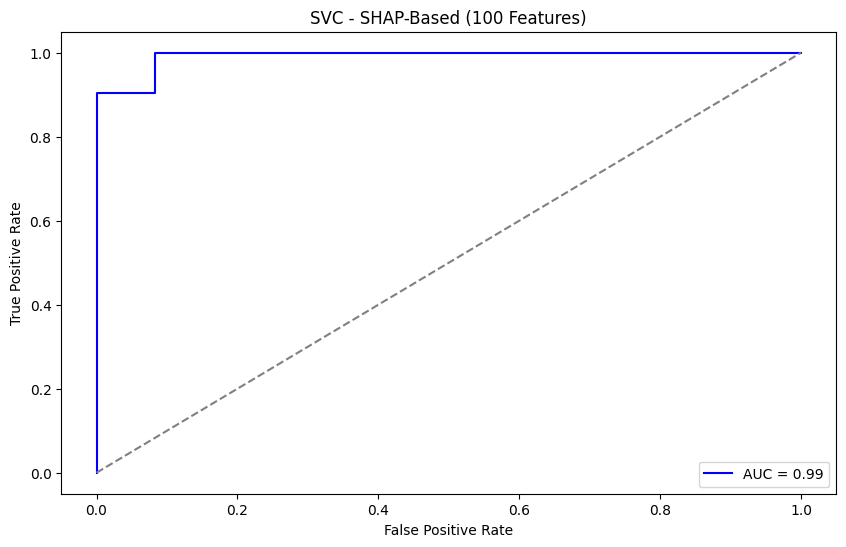


Performing Grid Search for All Features (Top all Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for All Features (Top all Features):
{'kernel': 'rbf', 'gamma': 0.01, 'C': 10}
Accuracy: 0.8182
AUC Score: 0.9444
Precision: 0.8000
Recall: 0.9524
F1 Score: 0.8696
Confusion Matrix:
[[ 7  5]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.58      0.70        12
           1       0.80      0.95      0.87        21

    accuracy                           0.82        33
   macro avg       0.84      0.77      0.78        33
weighted avg       0.83      0.82      0.81        33



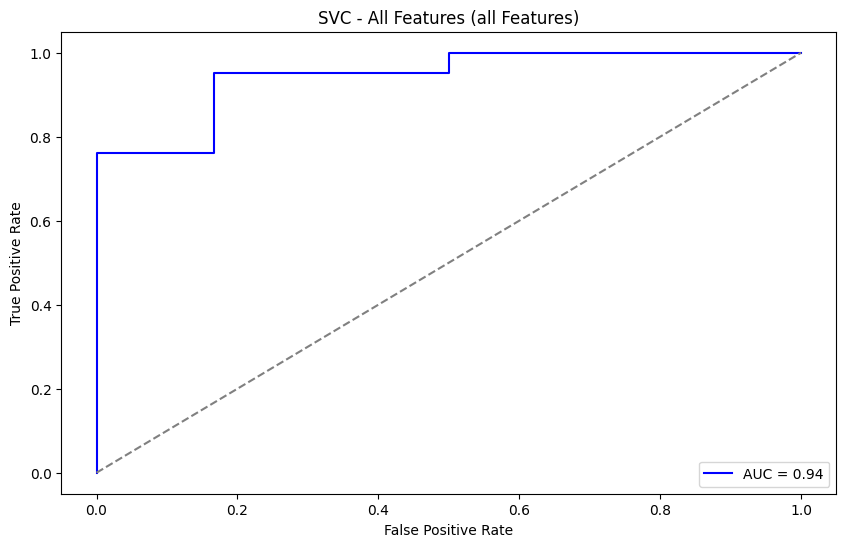


=== Overall Best Model ===
Feature Selection Method: SHAP-Based (100 Features)
Selected Features: 115             NumHAcceptors
105                   NOCount
14        MinAbsPartialCharge
97                VSA_EState5
96                VSA_EState4
                ...          
46                  LabuteASA
180          fr_unbrch_alkane
92                VSA_EState1
110    NumAromaticCarbocycles
104                 NHOHCount
Name: feature, Length: 100, dtype: object
AUC Score: 0.9921
Accuracy: 0.8788
Precision: 0.8400
Recall: 1.0000
F1 Score: 0.9130

Confusion Matrix:
[[ 8  4]
 [ 0 21]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.67      0.80        12
           1       0.84      1.00      0.91        21

    accuracy                           0.88        33
   macro avg       0.92      0.83      0.86        33
weighted avg       0.90      0.88      0.87        33


Best model saved to best_svc_model.pkl
Selected featur

TypeError: The passed model is not callable and cannot be analyzed directly with the given masker! Model: SVC(C=10, gamma=0.1, probability=True, random_state=42)

In [ ]:
param_grid_svc = {
    'C': [0.01, 0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf'],
    'gamma': ['scale', 'auto', 0.01, 0.1, 1]  # only used with 'rbf'
}

run_model_grid_search(
    df=df,
    target_column='Irritant',
    model_class=SVC,
    param_grid=param_grid_svc,
    feature_counts=feature_counts,
    feature_selection_methods=feature_selection_methods,
    model_name="SVC",
    save_filename="best_svc_model.pkl",
    extra_model_kwargs={'probability': True, 'random_state': 42},
    scale_data=True,
    use_random_search=True,
    n_iter=40
)

Data scaled using StandardScaler.


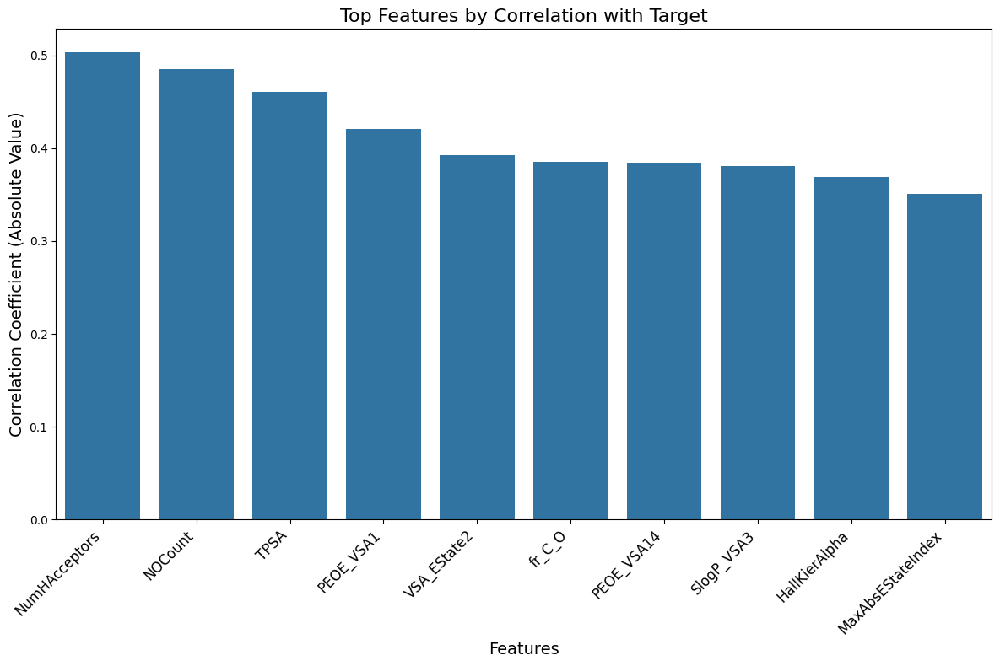

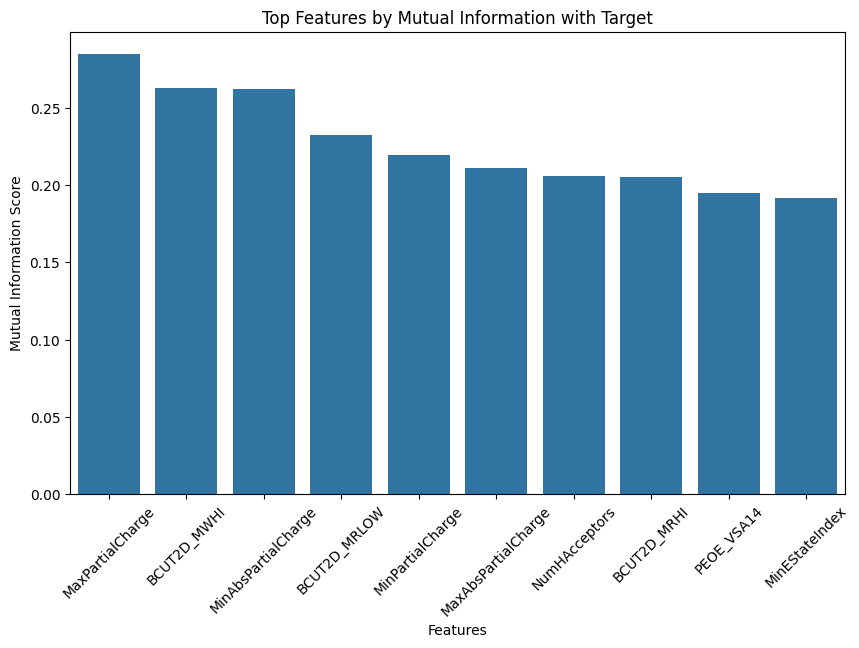

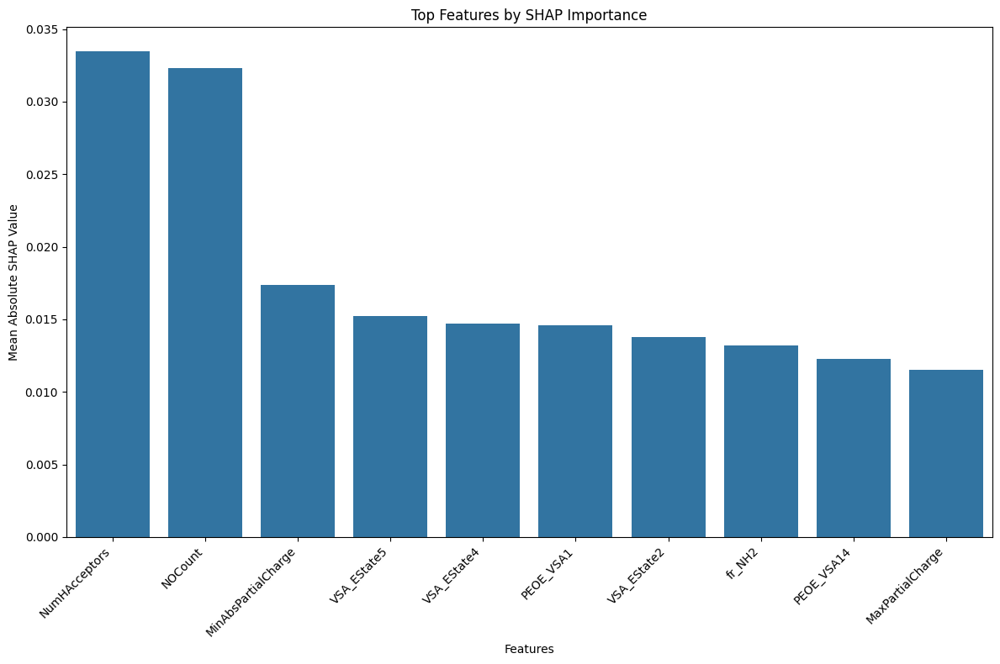


Performing Grid Search for Correlation-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 10 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 0.001}
Accuracy: 0.7576
AUC Score: 0.8294
Precision: 0.8095
Recall: 0.8095
F1 Score: 0.8095
Confusion Matrix:
[[ 8  4]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.67      0.67      0.67        12
           1       0.81      0.81      0.81        21

    accuracy                           0.76        33
   macro avg       0.74      0.74      0.74        33
weighted avg       0.76      0.76      0.76        33



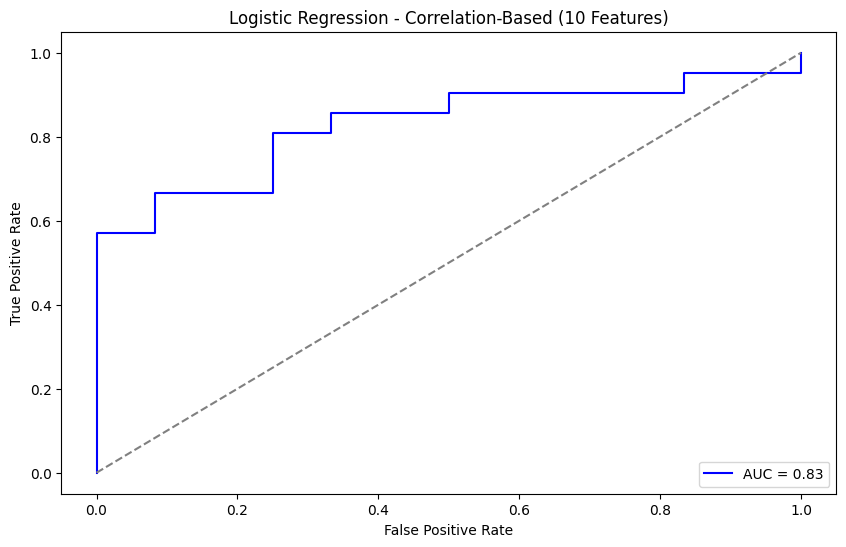


Performing Grid Search for Mutual Information-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 10 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': False, 'class_weight': None, 'C': 0.1}
Accuracy: 0.8182
AUC Score: 0.8333
Precision: 0.8947
Recall: 0.8095
F1 Score: 0.8500
Confusion Matrix:
[[10  2]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77        12
           1       0.89      0.81      0.85        21

    accuracy                           0.82        33
   macro avg       0.80      0.82      0.81        33
weighted avg       0.83      0.82      0.82        33



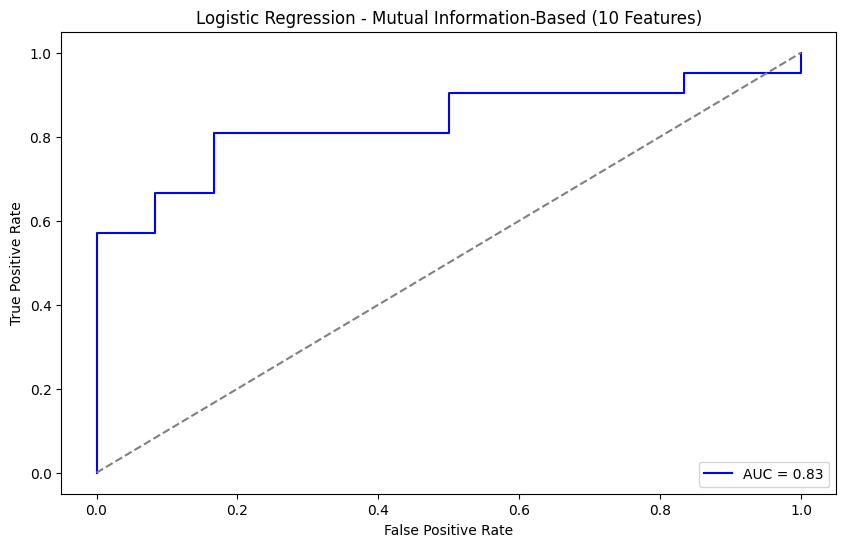


Performing Grid Search for SHAP-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 10 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': False, 'class_weight': None, 'C': 0.1}
Accuracy: 0.7879
AUC Score: 0.8611
Precision: 0.7917
Recall: 0.9048
F1 Score: 0.8444
Confusion Matrix:
[[ 7  5]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.78      0.58      0.67        12
           1       0.79      0.90      0.84        21

    accuracy                           0.79        33
   macro avg       0.78      0.74      0.76        33
weighted avg       0.79      0.79      0.78        33



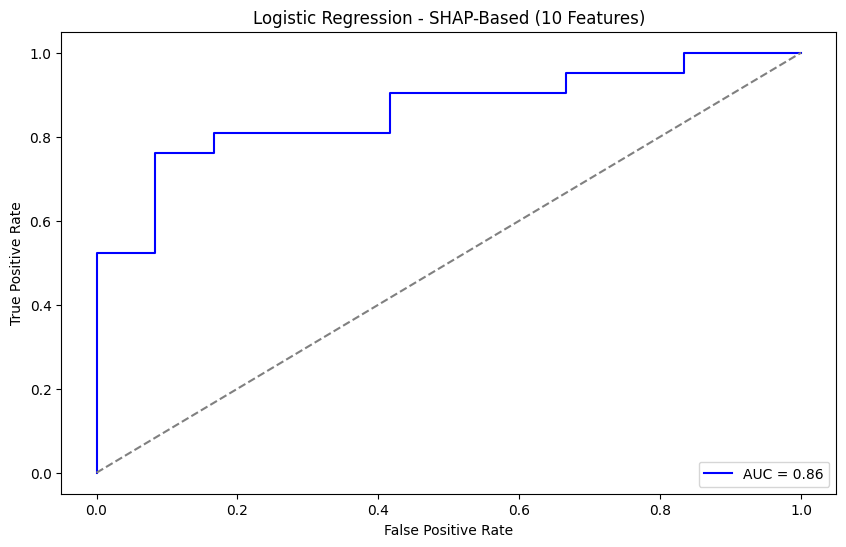

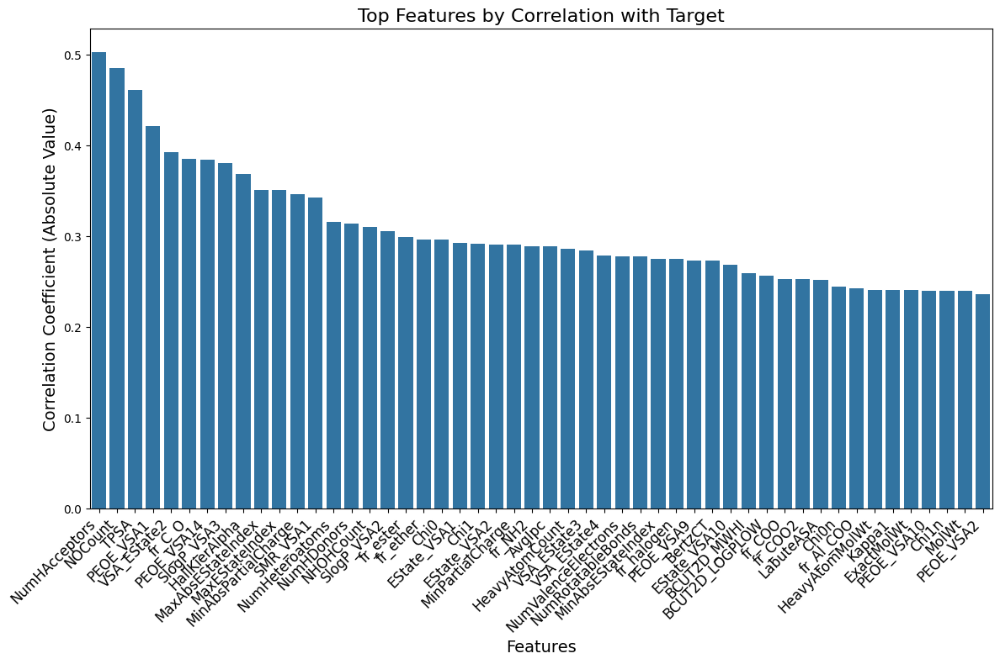

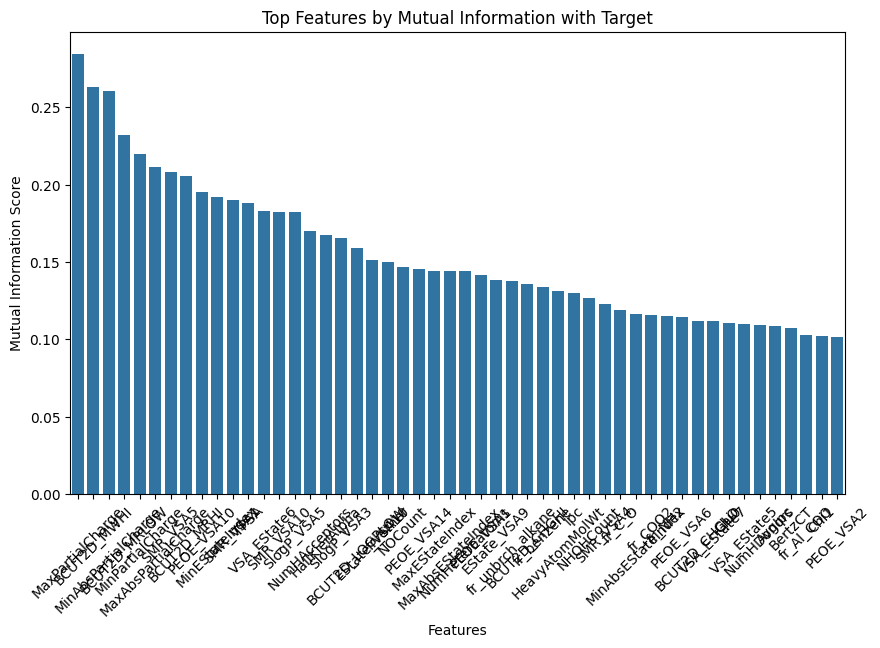

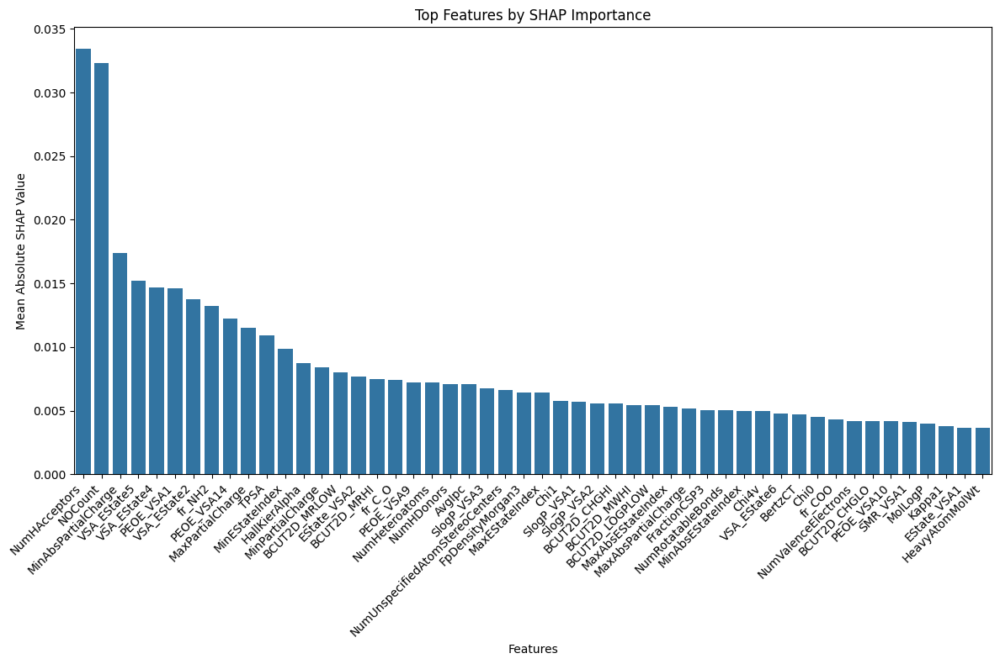


Performing Grid Search for Correlation-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 50 Features):
{'solver': 'liblinear', 'penalty': 'l1', 'fit_intercept': True, 'class_weight': 'balanced', 'C': 10}
Accuracy: 0.8485
AUC Score: 0.9008
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837
Confusion Matrix:
[[ 9  3]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78        12
           1       0.86      0.90      0.88        21

    accuracy                           0.85        33
   macro avg       0.84      0.83      0.83        33
weighted avg       0.85      0.85      0.85        33



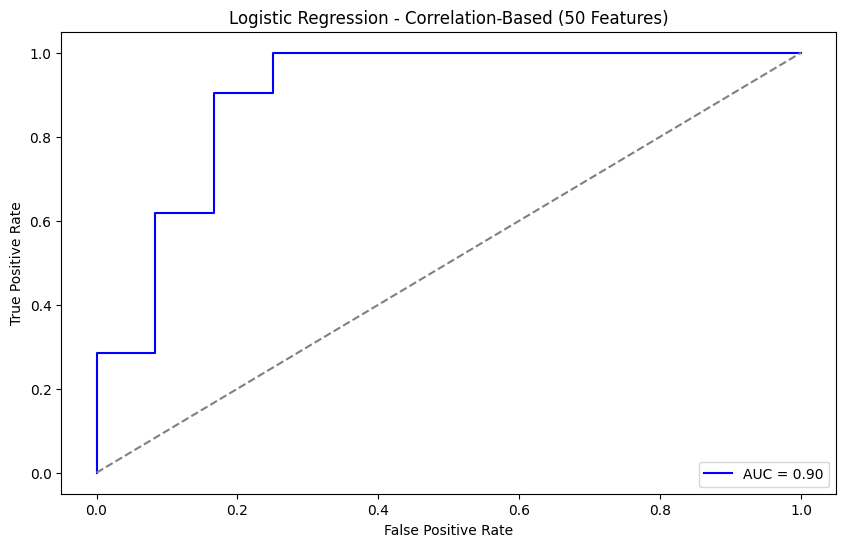


Performing Grid Search for Mutual Information-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 50 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 10}
Accuracy: 0.8182
AUC Score: 0.7817
Precision: 0.8571
Recall: 0.8571
F1 Score: 0.8571
Confusion Matrix:
[[ 9  3]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           1       0.86      0.86      0.86        21

    accuracy                           0.82        33
   macro avg       0.80      0.80      0.80        33
weighted avg       0.82      0.82      0.82        33



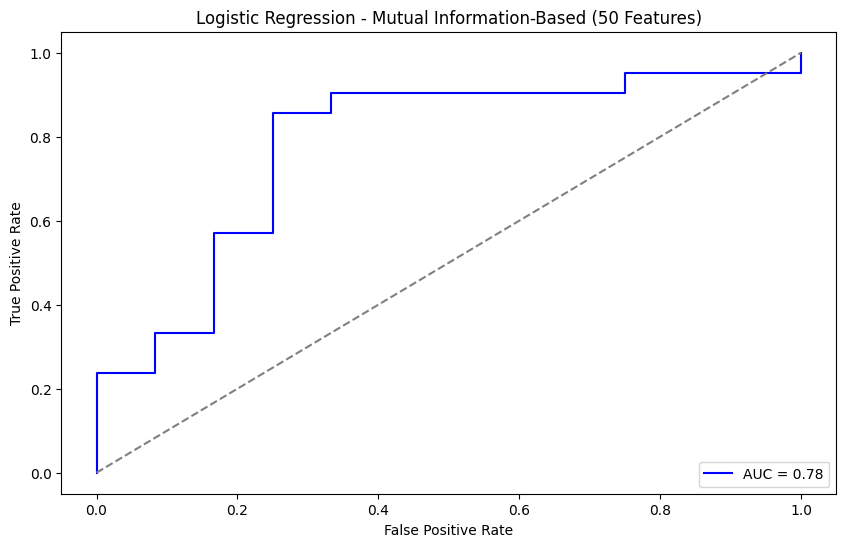


Performing Grid Search for SHAP-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 50 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 10}
Accuracy: 0.8485
AUC Score: 0.8849
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837
Confusion Matrix:
[[ 9  3]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78        12
           1       0.86      0.90      0.88        21

    accuracy                           0.85        33
   macro avg       0.84      0.83      0.83        33
weighted avg       0.85      0.85      0.85        33



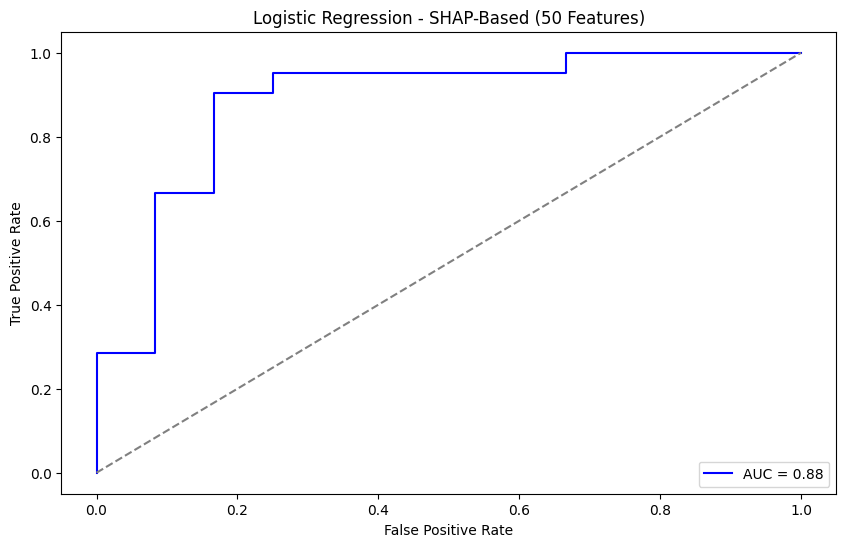

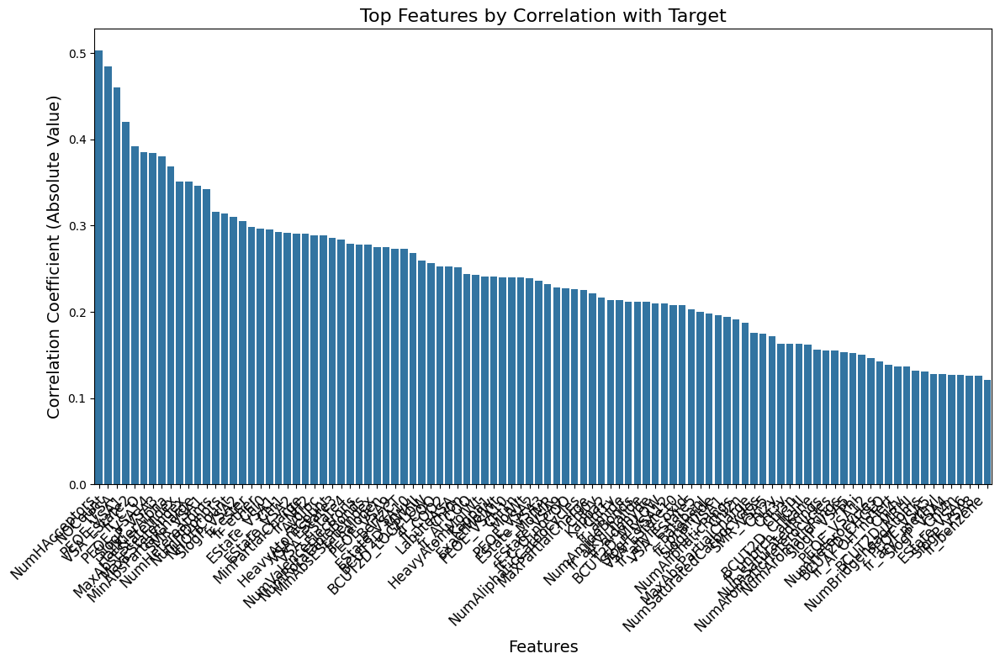

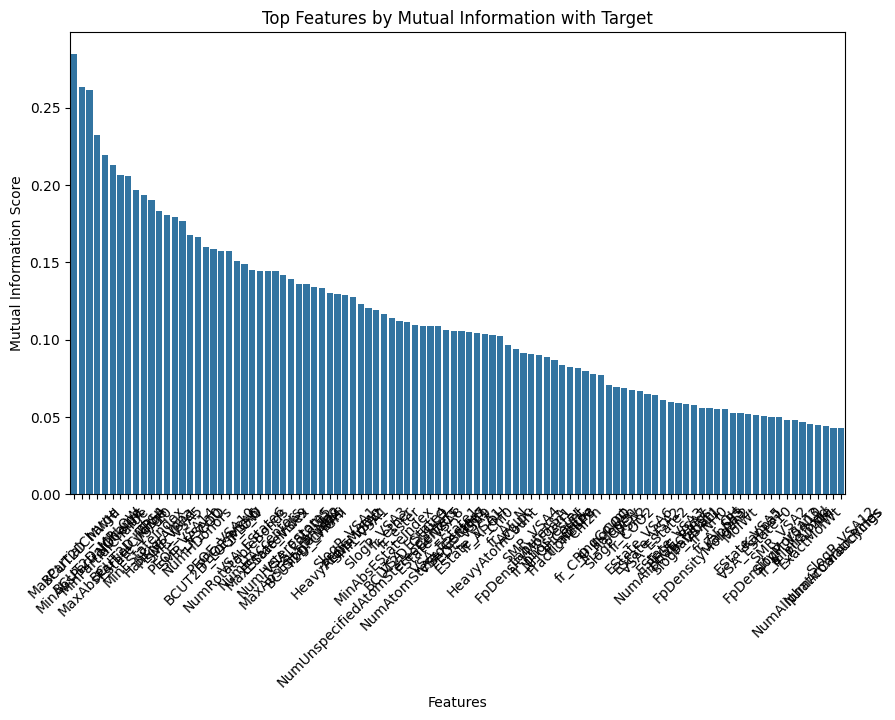

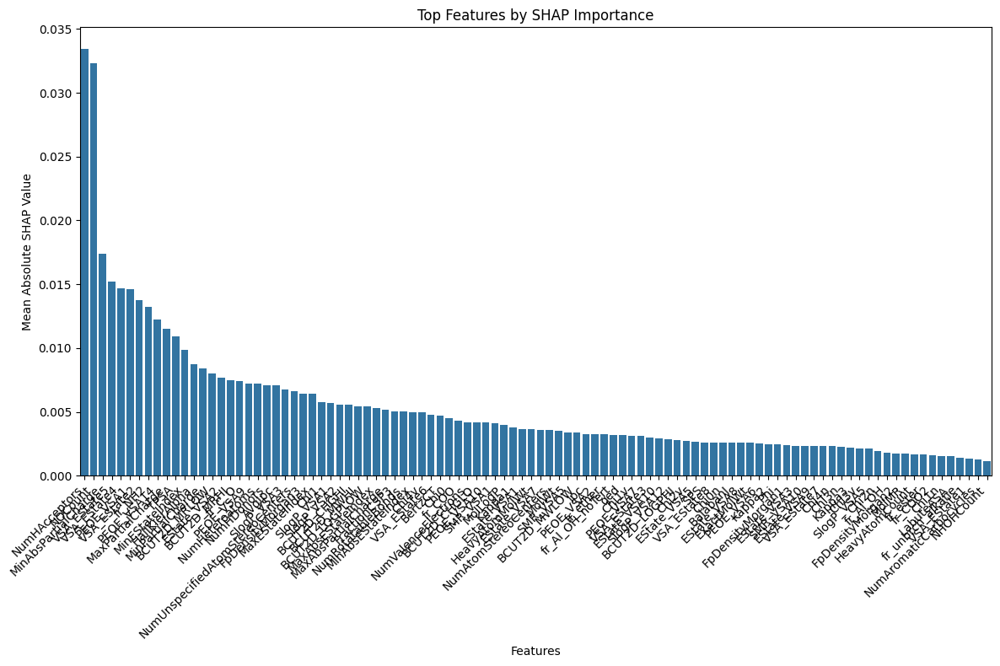


Performing Grid Search for Correlation-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 100 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': 'balanced', 'C': 10}
Accuracy: 0.8485
AUC Score: 0.8810
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837
Confusion Matrix:
[[ 9  3]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78        12
           1       0.86      0.90      0.88        21

    accuracy                           0.85        33
   macro avg       0.84      0.83      0.83        33
weighted avg       0.85      0.85      0.85        33



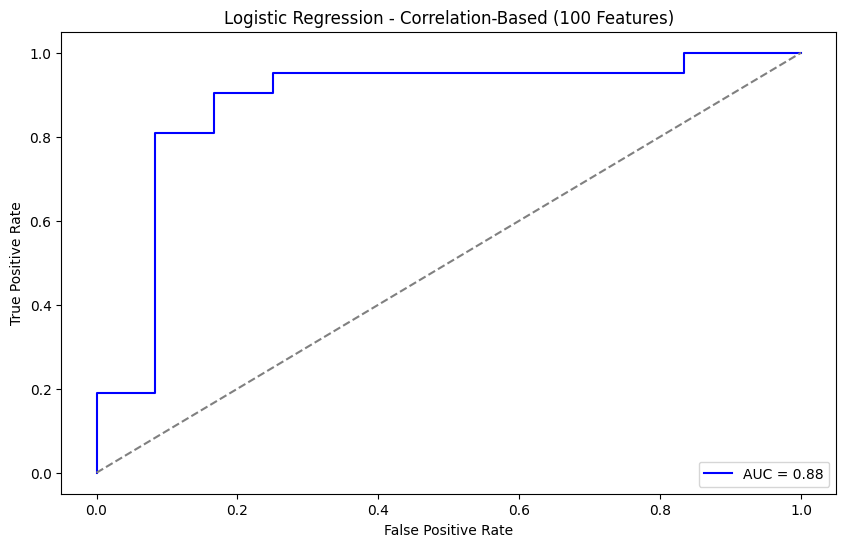


Performing Grid Search for Mutual Information-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 100 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 10}
Accuracy: 0.8182
AUC Score: 0.8889
Precision: 0.8571
Recall: 0.8571
F1 Score: 0.8571
Confusion Matrix:
[[ 9  3]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           1       0.86      0.86      0.86        21

    accuracy                           0.82        33
   macro avg       0.80      0.80      0.80        33
weighted avg       0.82      0.82      0.82        33



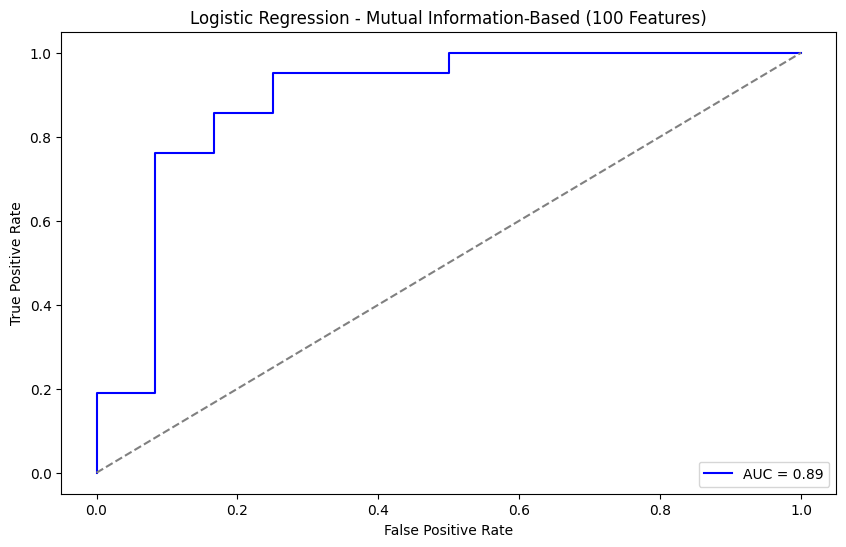


Performing Grid Search for SHAP-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 100 Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': True, 'class_weight': None, 'C': 1}
Accuracy: 0.8182
AUC Score: 0.8968
Precision: 0.8571
Recall: 0.8571
F1 Score: 0.8571
Confusion Matrix:
[[ 9  3]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           1       0.86      0.86      0.86        21

    accuracy                           0.82        33
   macro avg       0.80      0.80      0.80        33
weighted avg       0.82      0.82      0.82        33



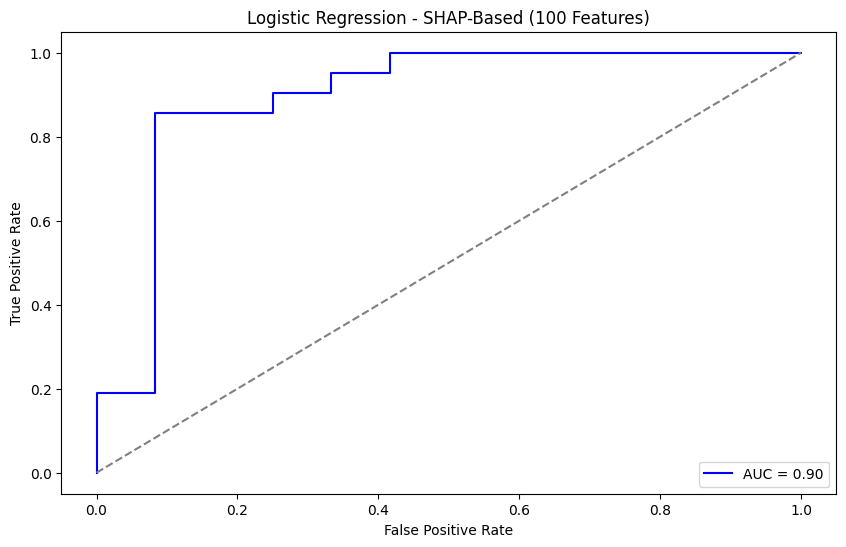


Performing Grid Search for All Features (Top all Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for All Features (Top all Features):
{'solver': 'liblinear', 'penalty': 'l2', 'fit_intercept': False, 'class_weight': None, 'C': 1}
Accuracy: 0.8182
AUC Score: 0.8214
Precision: 0.8571
Recall: 0.8571
F1 Score: 0.8571
Confusion Matrix:
[[ 9  3]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           1       0.86      0.86      0.86        21

    accuracy                           0.82        33
   macro avg       0.80      0.80      0.80        33
weighted avg       0.82      0.82      0.82        33



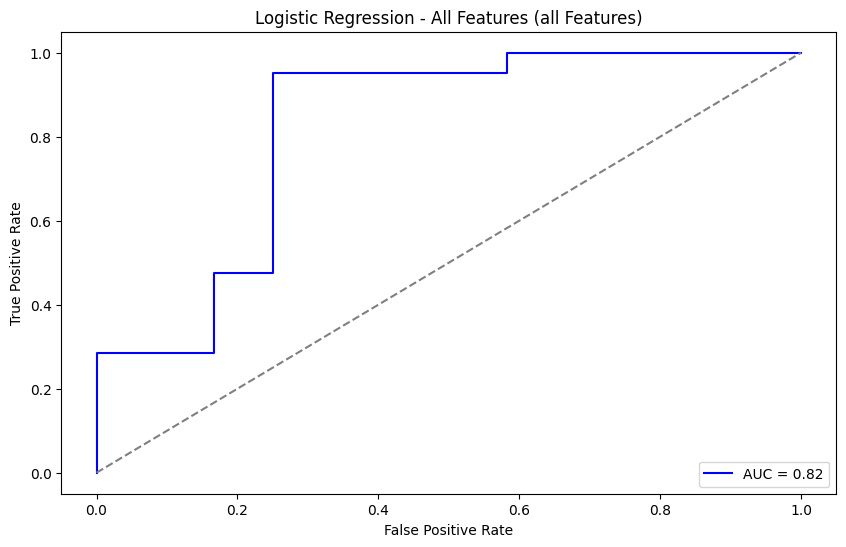


=== Overall Best Model ===
Feature Selection Method: Correlation-Based (50 Features)
Selected Features: Index(['NumHAcceptors', 'NOCount', 'TPSA', 'PEOE_VSA1', 'VSA_EState2',
       'fr_C_O', 'PEOE_VSA14', 'SlogP_VSA3', 'HallKierAlpha',
       'MaxAbsEStateIndex', 'MaxEStateIndex', 'MinAbsPartialCharge',
       'SMR_VSA1', 'NumHeteroatoms', 'NumHDonors', 'NHOHCount', 'SlogP_VSA2',
       'fr_ester', 'fr_ether', 'Chi0', 'EState_VSA1', 'Chi1', 'EState_VSA2',
       'MinPartialCharge', 'fr_NH2', 'AvgIpc', 'HeavyAtomCount', 'VSA_EState3',
       'VSA_EState4', 'NumValenceElectrons', 'NumRotatableBonds',
       'MinAbsEStateIndex', 'fr_halogen', 'PEOE_VSA9', 'BertzCT',
       'EState_VSA10', 'BCUT2D_MWHI', 'BCUT2D_LOGPLOW', 'fr_COO', 'fr_COO2',
       'LabuteASA', 'Chi0n', 'fr_Al_COO', 'HeavyAtomMolWt', 'Kappa1',
       'ExactMolWt', 'PEOE_VSA10', 'Chi1n', 'MolWt', 'PEOE_VSA2'],
      dtype='object')
AUC Score: 0.9008
Accuracy: 0.8485
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837

Conf

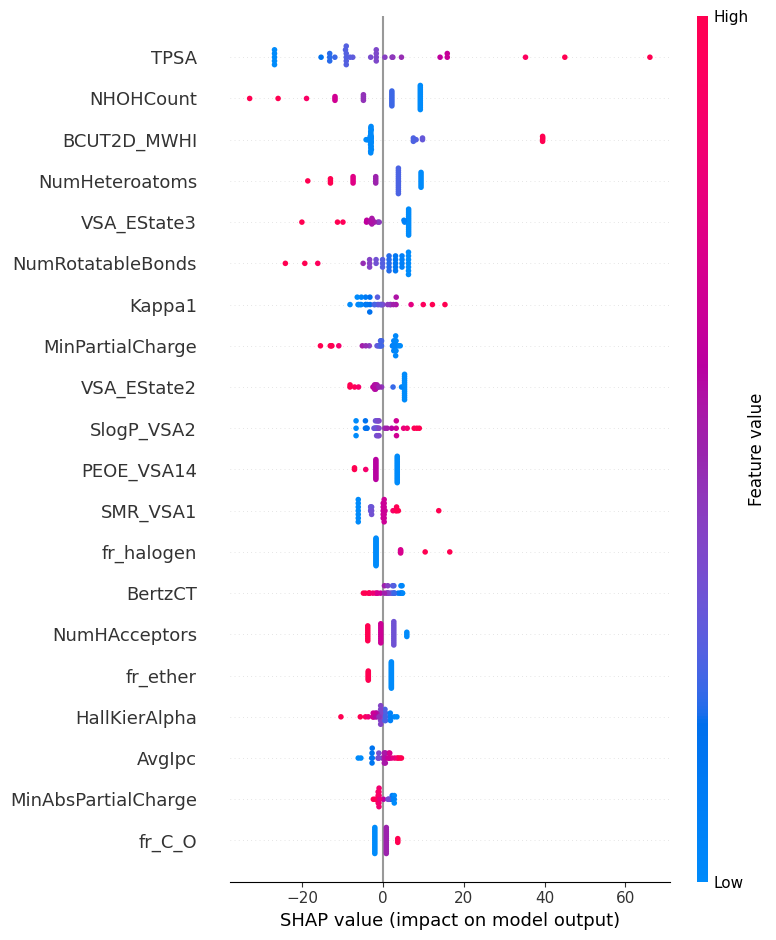

In [ ]:
param_grid_logreg = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'fit_intercept': [True, False],
    'class_weight': [None, 'balanced'],
    'solver': ['liblinear']
}

run_model_grid_search(
    df=df,
    target_column='Irritant',
    model_class=LogisticRegression,
    param_grid=param_grid_logreg,
    feature_counts=feature_counts,
    feature_selection_methods=feature_selection_methods,
    model_name="Logistic Regression",
    save_filename="best_logreg_model.pkl",
    extra_model_kwargs={'random_state': 42},
    scale_data=True,
    use_random_search=True,
    n_iter=40
)

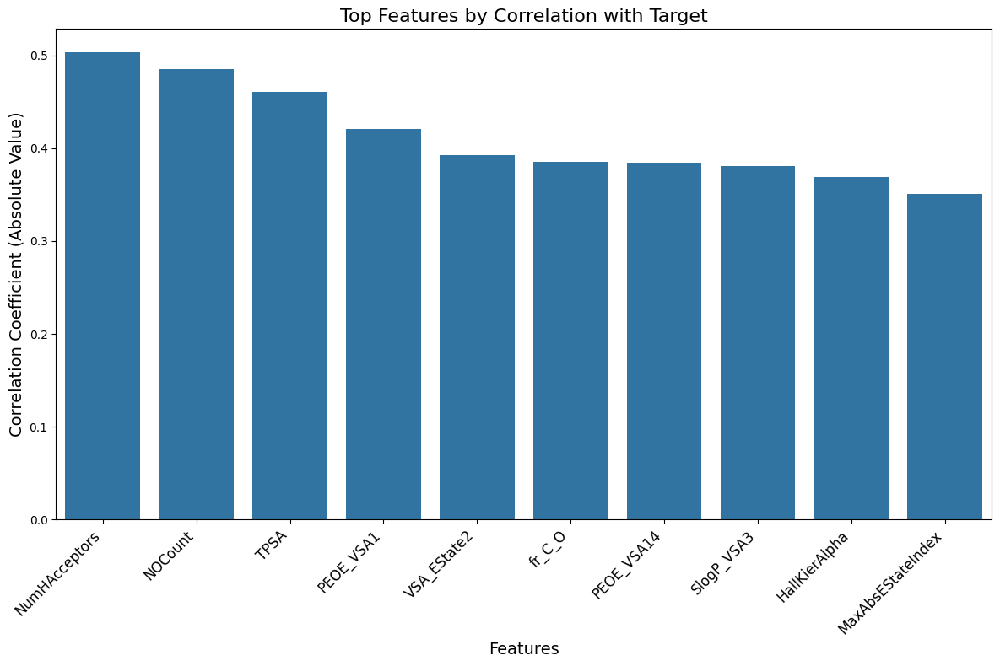

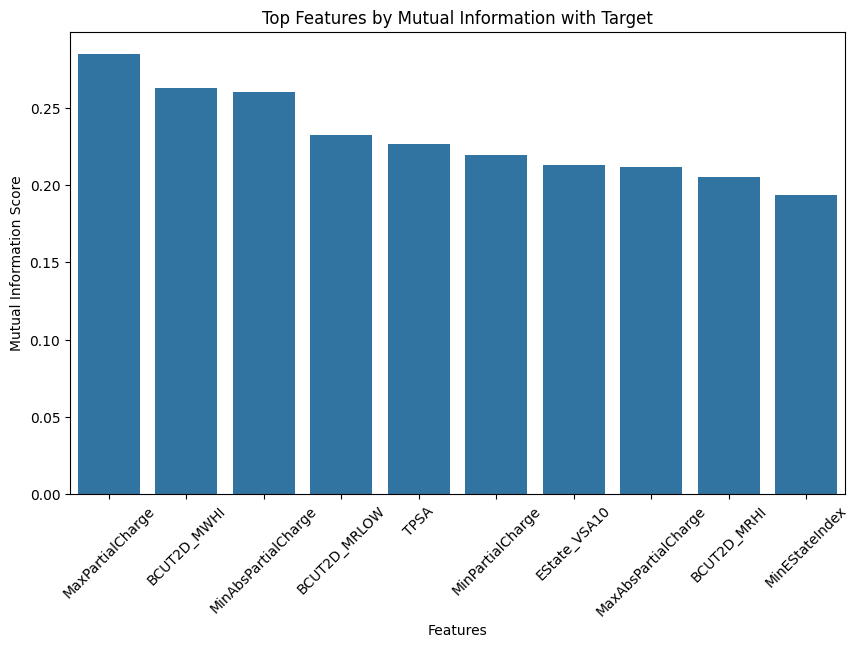

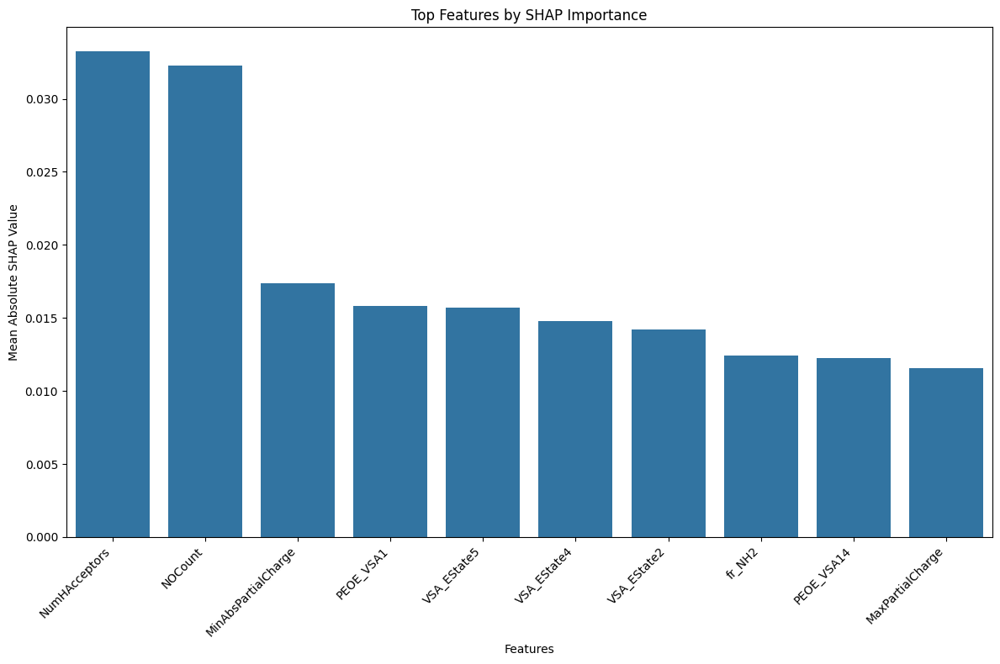


Performing Grid Search for Correlation-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 10 Features):
{'subsample': 0.8, 'n_estimators': 100, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.01}
Accuracy: 0.7576
AUC Score: 0.8690
Precision: 0.7826
Recall: 0.8571
F1 Score: 0.8182
Confusion Matrix:
[[ 7  5]
 [ 3 18]]
Classification Report:
              precision    recall  f1-score   support

           0       0.70      0.58      0.64        12
           1       0.78      0.86      0.82        21

    accuracy                           0.76        33
   macro avg       0.74      0.72      0.73        33
weighted avg       0.75      0.76      0.75        33



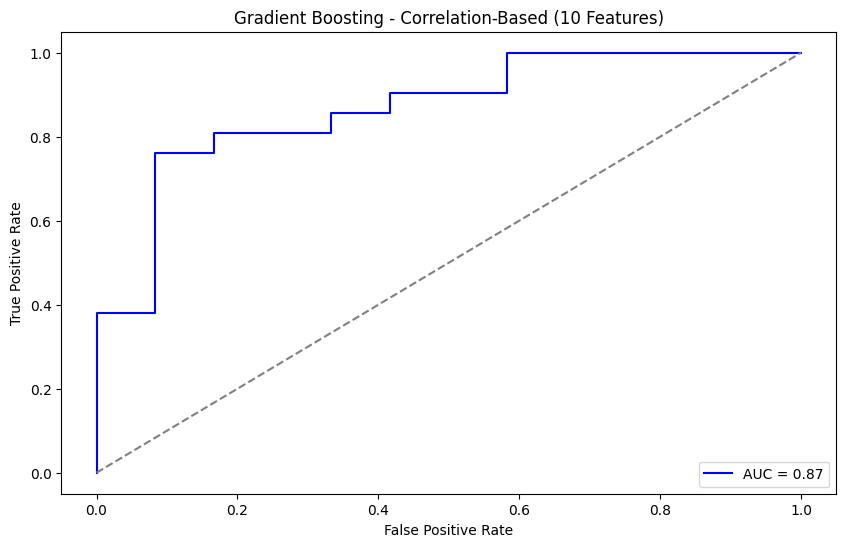


Performing Grid Search for Mutual Information-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 10 Features):
{'subsample': 0.6, 'n_estimators': 150, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': 'log2', 'max_depth': 5, 'learning_rate': 0.1}
Accuracy: 0.8485
AUC Score: 0.9127
Precision: 0.9444
Recall: 0.8095
F1 Score: 0.8718
Confusion Matrix:
[[11  1]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.92      0.81        12
           1       0.94      0.81      0.87        21

    accuracy                           0.85        33
   macro avg       0.84      0.86      0.84        33
weighted avg       0.87      0.85      0.85        33



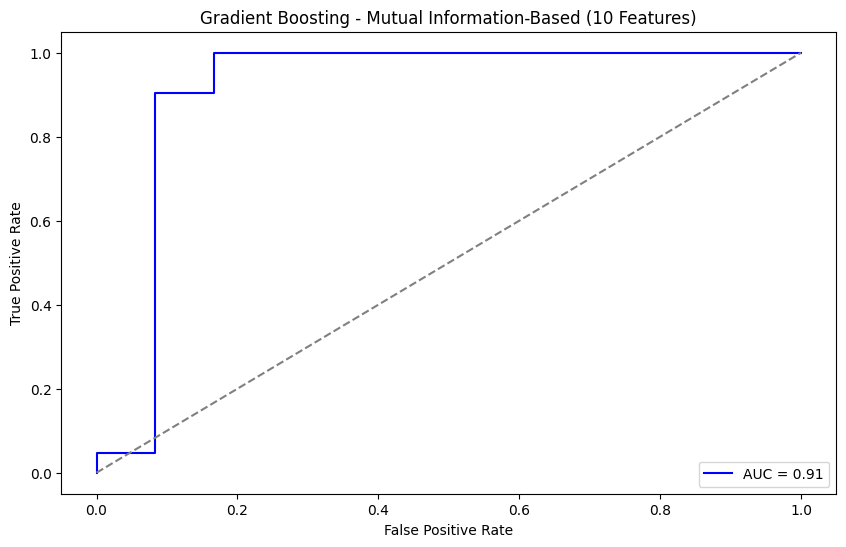


Performing Grid Search for SHAP-Based (Top 10 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 10 Features):
{'subsample': 0.6, 'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.05}
Accuracy: 0.9091
AUC Score: 0.9286
Precision: 0.9091
Recall: 0.9524
F1 Score: 0.9302
Confusion Matrix:
[[10  2]
 [ 1 20]]
Classification Report:
              precision    recall  f1-score   support

           0       0.91      0.83      0.87        12
           1       0.91      0.95      0.93        21

    accuracy                           0.91        33
   macro avg       0.91      0.89      0.90        33
weighted avg       0.91      0.91      0.91        33



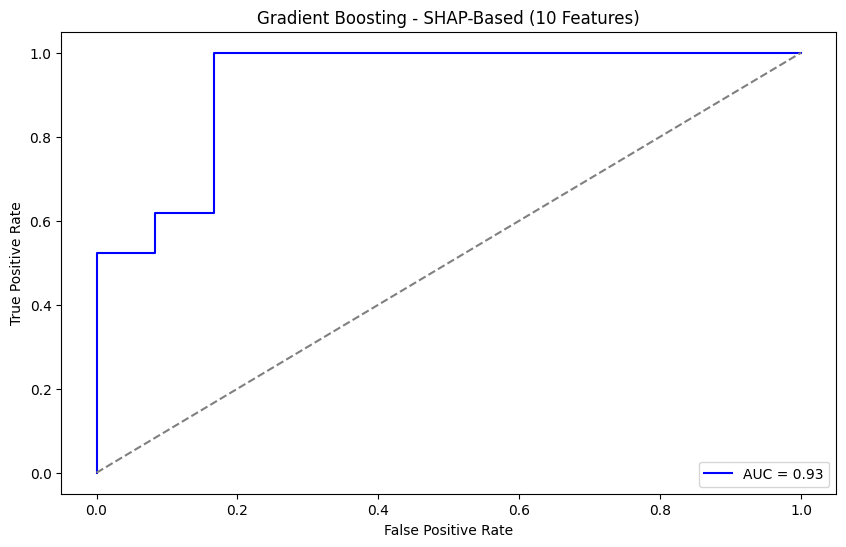

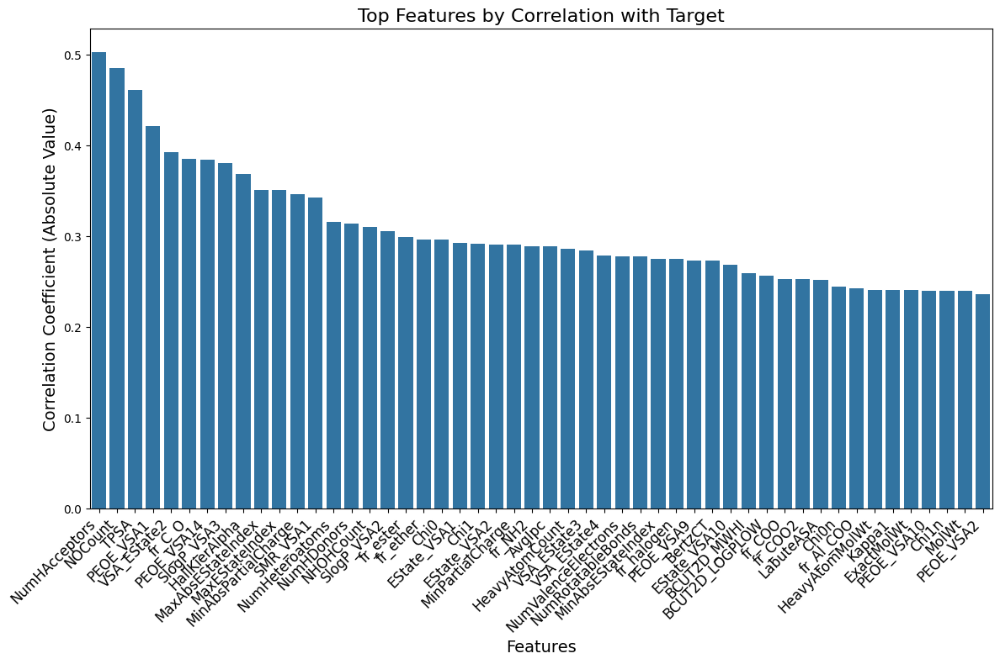

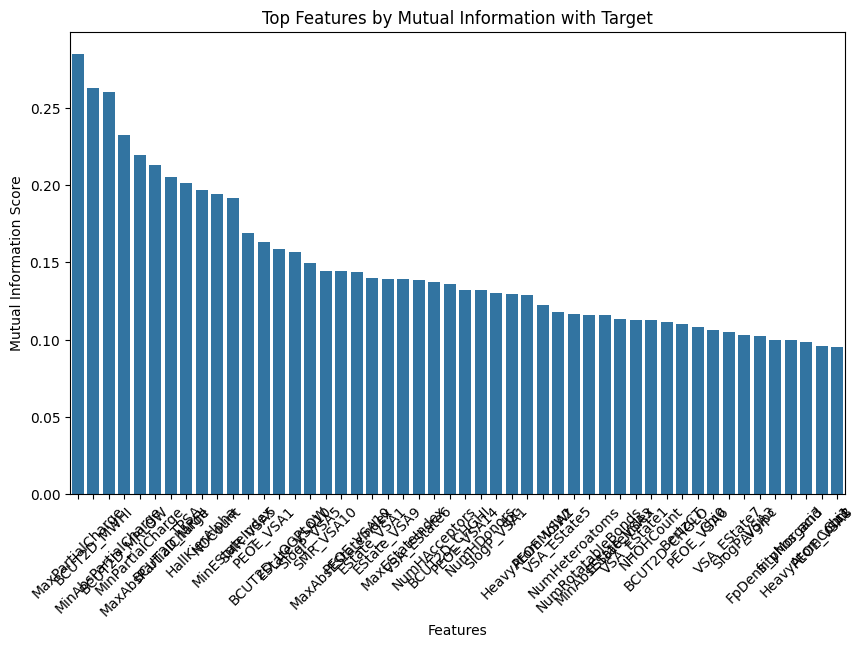

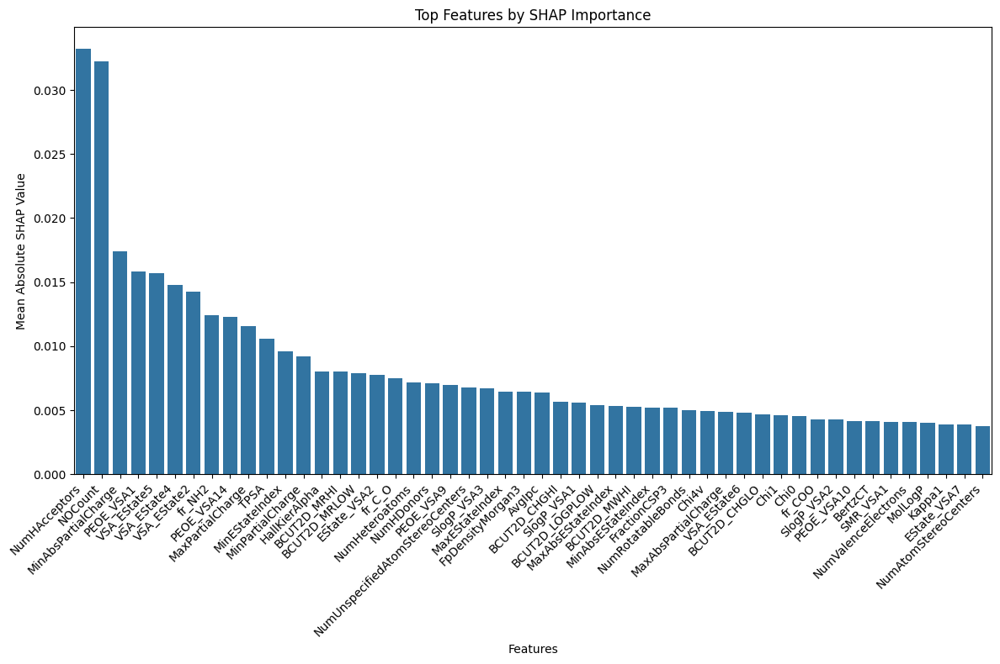


Performing Grid Search for Correlation-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 50 Features):
{'subsample': 1.0, 'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 5, 'learning_rate': 0.2}
Accuracy: 0.8485
AUC Score: 0.9524
Precision: 0.8636
Recall: 0.9048
F1 Score: 0.8837
Confusion Matrix:
[[ 9  3]
 [ 2 19]]
Classification Report:
              precision    recall  f1-score   support

           0       0.82      0.75      0.78        12
           1       0.86      0.90      0.88        21

    accuracy                           0.85        33
   macro avg       0.84      0.83      0.83        33
weighted avg       0.85      0.85      0.85        33



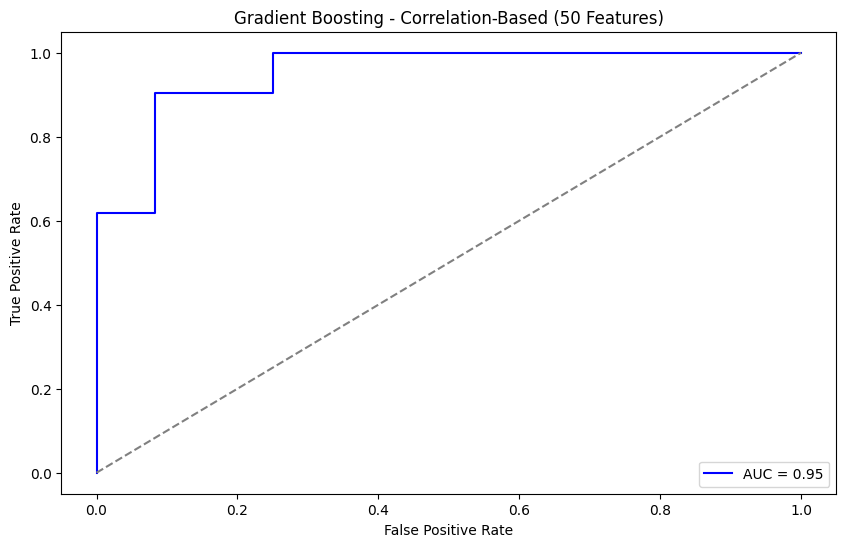


Performing Grid Search for Mutual Information-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 50 Features):
{'subsample': 0.8, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': None, 'max_depth': 7, 'learning_rate': 0.01}
Accuracy: 0.8182
AUC Score: 0.9206
Precision: 0.8947
Recall: 0.8095
F1 Score: 0.8500
Confusion Matrix:
[[10  2]
 [ 4 17]]
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77        12
           1       0.89      0.81      0.85        21

    accuracy                           0.82        33
   macro avg       0.80      0.82      0.81        33
weighted avg       0.83      0.82      0.82        33



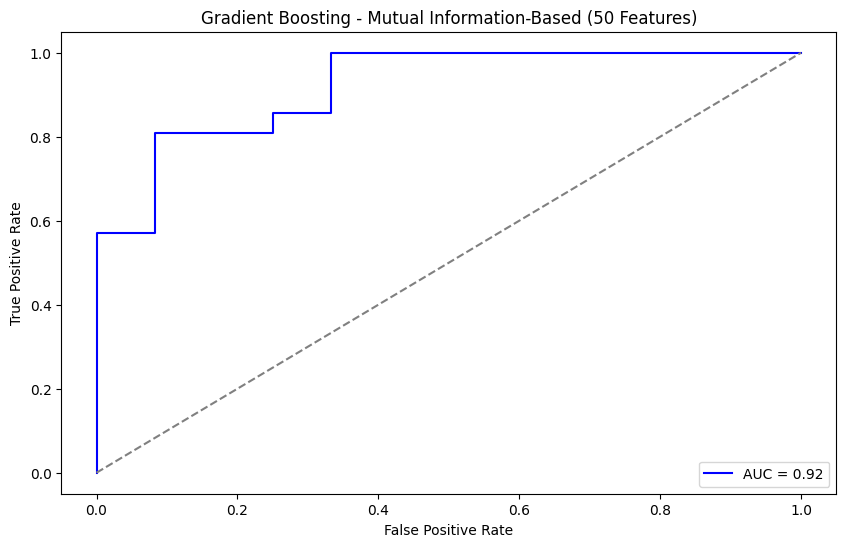


Performing Grid Search for SHAP-Based (Top 50 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 50 Features):
{'subsample': 0.8, 'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 7, 'learning_rate': 0.1}
Accuracy: 0.9394
AUC Score: 0.9563
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



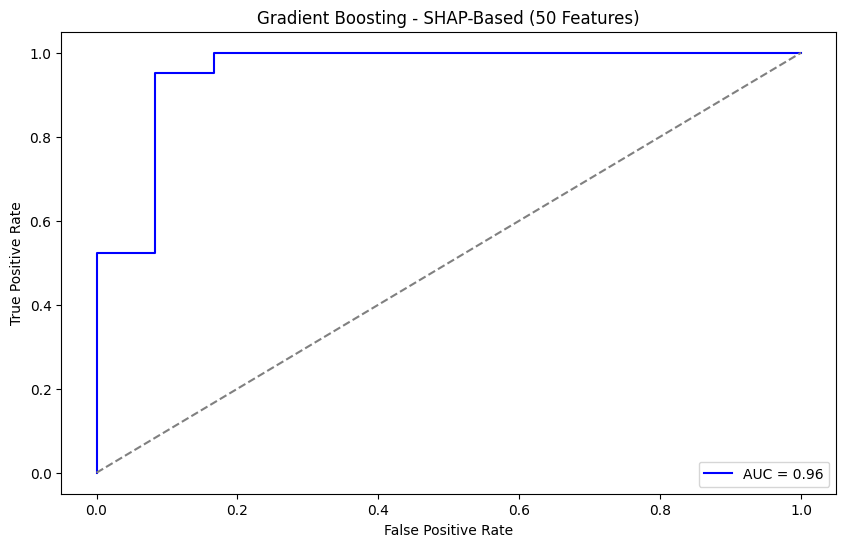

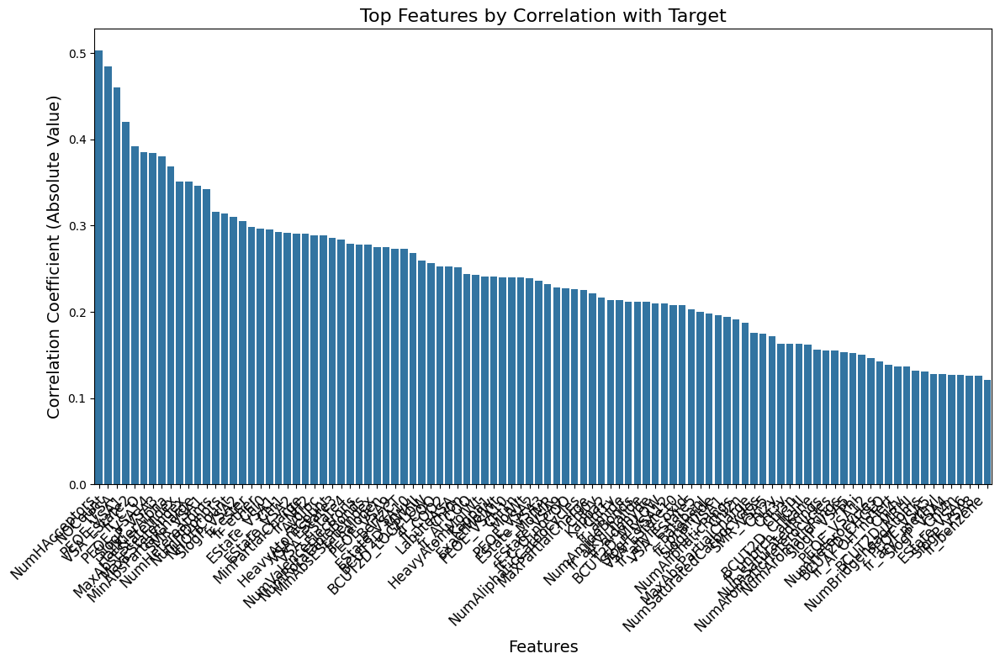

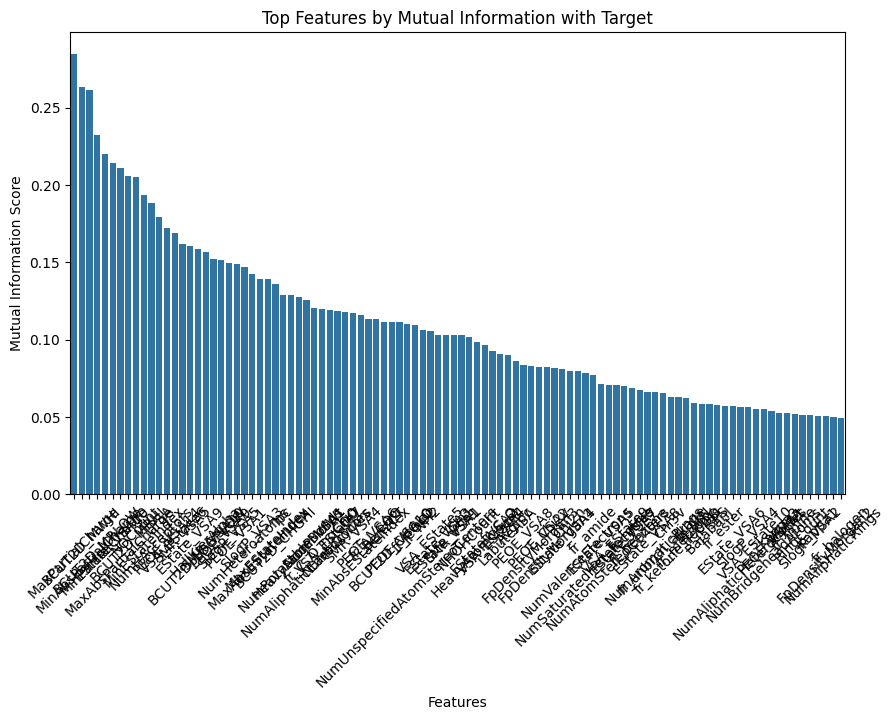

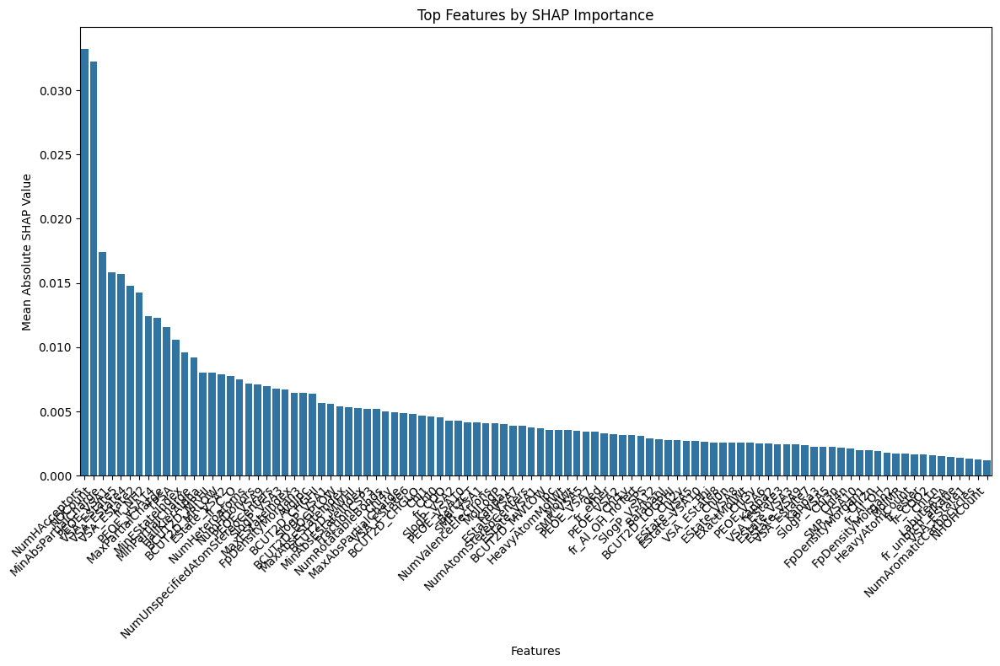


Performing Grid Search for Correlation-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Correlation-Based (Top 100 Features):
{'subsample': 0.6, 'n_estimators': 150, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_features': 'sqrt', 'max_depth': 5, 'learning_rate': 0.05}
Accuracy: 0.9697
AUC Score: 0.9524
Precision: 0.9545
Recall: 1.0000
F1 Score: 0.9767
Confusion Matrix:
[[11  1]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        12
           1       0.95      1.00      0.98        21

    accuracy                           0.97        33
   macro avg       0.98      0.96      0.97        33
weighted avg       0.97      0.97      0.97        33



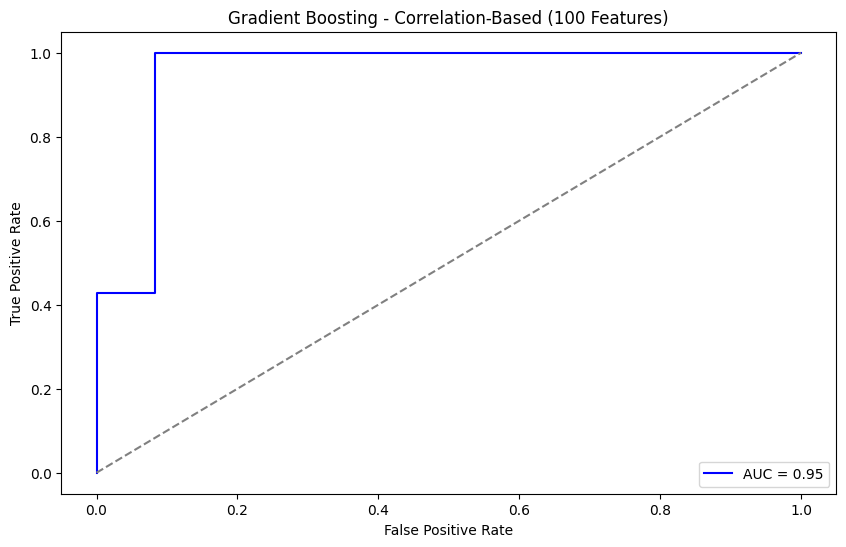


Performing Grid Search for Mutual Information-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for Mutual Information-Based (Top 100 Features):
{'subsample': 0.6, 'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 7, 'learning_rate': 0.1}
Accuracy: 0.9697
AUC Score: 0.9563
Precision: 0.9545
Recall: 1.0000
F1 Score: 0.9767
Confusion Matrix:
[[11  1]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        12
           1       0.95      1.00      0.98        21

    accuracy                           0.97        33
   macro avg       0.98      0.96      0.97        33
weighted avg       0.97      0.97      0.97        33



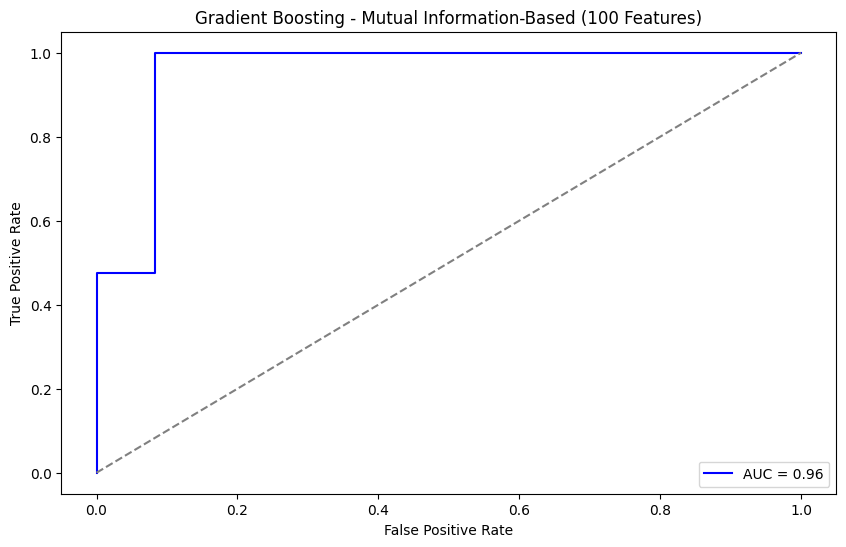


Performing Grid Search for SHAP-Based (Top 100 Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for SHAP-Based (Top 100 Features):
{'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 7, 'learning_rate': 0.1}
Accuracy: 0.9091
AUC Score: 0.9365
Precision: 0.8750
Recall: 1.0000
F1 Score: 0.9333
Confusion Matrix:
[[ 9  3]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.75      0.86        12
           1       0.88      1.00      0.93        21

    accuracy                           0.91        33
   macro avg       0.94      0.88      0.90        33
weighted avg       0.92      0.91      0.91        33



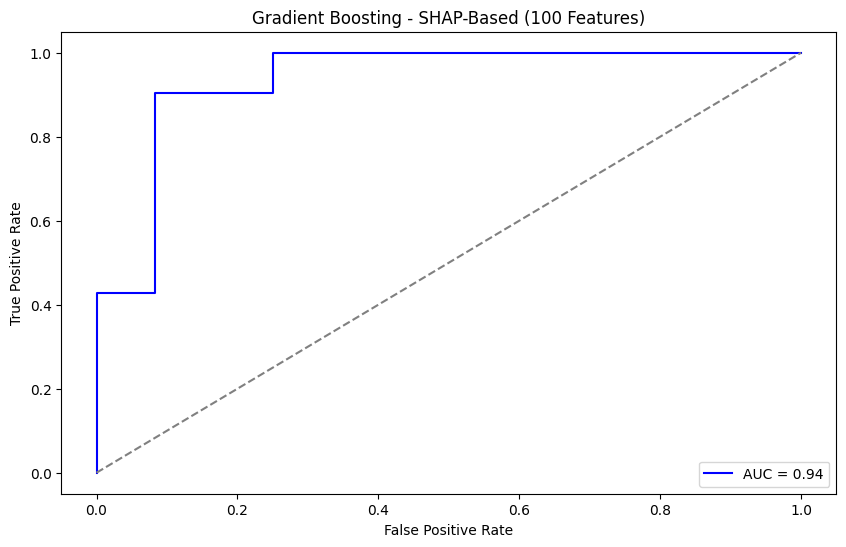


Performing Grid Search for All Features (Top all Features)
Running RandomizedSearchCV with n_iter=40
Fitting 5 folds for each of 40 candidates, totalling 200 fits

Best Parameters for All Features (Top all Features):
{'subsample': 1.0, 'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'log2', 'max_depth': 5, 'learning_rate': 0.2}
Accuracy: 0.9394
AUC Score: 0.9286
Precision: 0.9130
Recall: 1.0000
F1 Score: 0.9545
Confusion Matrix:
[[10  2]
 [ 0 21]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.83      0.91        12
           1       0.91      1.00      0.95        21

    accuracy                           0.94        33
   macro avg       0.96      0.92      0.93        33
weighted avg       0.94      0.94      0.94        33



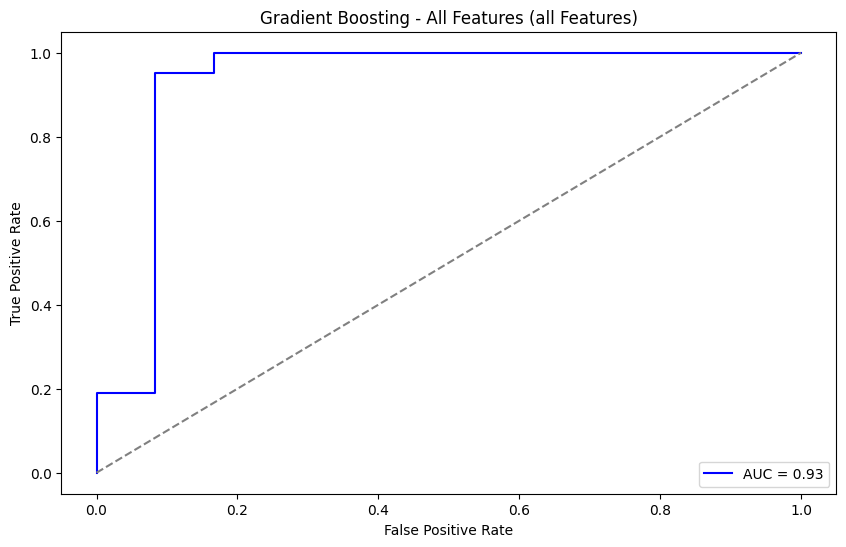


=== Overall Best Model ===
Feature Selection Method: SHAP-Based (50 Features)
Selected Features: 115                      NumHAcceptors
105                            NOCount
14                 MinAbsPartialCharge
47                           PEOE_VSA1
97                         VSA_EState5
96                         VSA_EState4
94                         VSA_EState2
143                             fr_NH2
52                          PEOE_VSA14
11                    MaxPartialCharge
81                                TPSA
3                       MinEStateIndex
12                    MinPartialCharge
41                       HallKierAlpha
24                         BCUT2D_MRHI
25                        BCUT2D_MRLOW
84                         EState_VSA2
138                             fr_C_O
117                     NumHeteroatoms
116                         NumHDonors
60                           PEOE_VSA9
123    NumUnspecifiedAtomStereoCenters
75                          SlogP_VSA3
1    

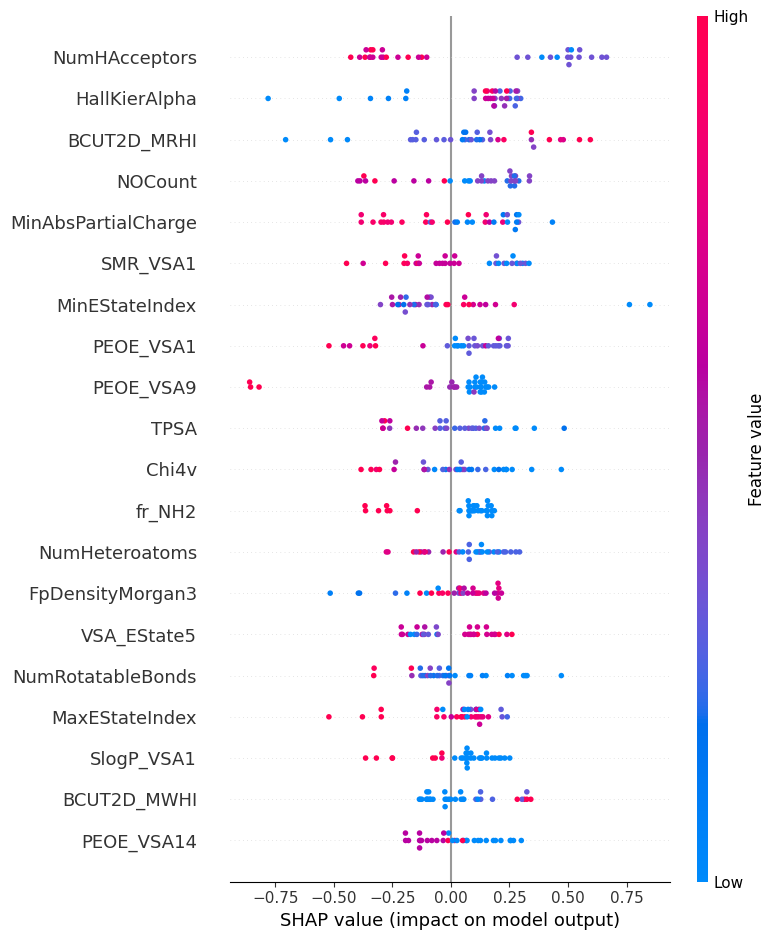

In [ ]:
param_grid_gb = {
    'n_estimators': [50, 100, 150],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.6, 0.8, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

run_model_grid_search(
    df=df,
    target_column='Irritant',
    model_class=GradientBoostingClassifier,
    param_grid=param_grid_gb,
    feature_counts=feature_counts,
    feature_selection_methods=feature_selection_methods,
    model_name="Gradient Boosting",
    save_filename="best_gb_model.pkl",
    extra_model_kwargs={'random_state': 42},
    use_random_search=True,
    n_iter=40
)